# Train

In [1]:
from sklearnex import patch_sklearn
patch_sklearn()
import pandas as pd
from pathlib import Path

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


In [2]:
from utils.dataloader import load_eeg_data_edf, load_eeg_data_gdf, load_eeg_data_mat
from utils.feature_extraction import bandpass_transform, psd_transform, standard_scaler_transform, pca_transform, wavelet_transform, time_domain_features_transform, frequency_domain_features_transform 
from models.mlmodels import KNN_model_predict, LDA_model_predict, SVM_model_predict, XGB_model_predict, KNNDWN_model_predict
from utils.mlpipelinebuilder import PipelineBuilder

Importing the dtw module. When using in academic works please cite:
  T. Giorgino. Computing and Visualizing Dynamic Time Warping Alignments in R: The dtw Package.
  J. Stat. Soft., doi:10.18637/jss.v031.i07.



In [3]:
def run_pipeline(x, y, fs, dataset_name, subject_id, results, multiclass=True):
    
    def add_XGB_if_is_multiclass_dataset(function):
        if multiclass:
            function.add_model(XGB_model_predict, "XGB")


    params = {"fs": 100, "dataset": dataset_name, "subject": subject_id}
    my_pipe = PipelineBuilder(multidimentional_data=True, params=params)
    my_pipe.add_model(KNN_model_predict, "KNN")
    my_pipe.add_model(SVM_model_predict, "SVM")
    my_pipe.add_model(LDA_model_predict, "LDA")
    add_XGB_if_is_multiclass_dataset(my_pipe)
    data, model_metrics = my_pipe.process(x,y)
    results.extend(model_metrics)


    my_pipe = PipelineBuilder(multidimentional_data=True, params=params)
    my_pipe.add_pipe(standard_scaler_transform, "STD_Scaler")
    my_pipe.add_model(KNN_model_predict, "KNN")
    my_pipe.add_model(SVM_model_predict, "SVM")
    my_pipe.add_model(LDA_model_predict, "LDA")
    add_XGB_if_is_multiclass_dataset(my_pipe)
    data, model_metrics = my_pipe.process(x,y )
    results.extend(model_metrics)


    my_pipe = PipelineBuilder(multidimentional_data=True, params=params)
    my_pipe.add_pipe(wavelet_transform, "Wavelet")
    my_pipe.add_model(KNN_model_predict, "KNN")
    my_pipe.add_model(SVM_model_predict, "SVM")
    my_pipe.add_model(LDA_model_predict, "LDA")
    add_XGB_if_is_multiclass_dataset(my_pipe)
    data, model_metrics = my_pipe.process(x, y)
    results.extend(model_metrics)

    my_pipe = PipelineBuilder(multidimentional_data=True, params=params)
    my_pipe.add_pipe(bandpass_transform, "bandpass")
    my_pipe.add_model(KNN_model_predict, "KNN")
    my_pipe.add_model(SVM_model_predict, "SVM")
    my_pipe.add_model(LDA_model_predict, "LDA")
    add_XGB_if_is_multiclass_dataset(my_pipe)
    results.extend(model_metrics)

    my_pipe = PipelineBuilder(multidimentional_data=True, params=params)
    my_pipe.add_pipe(bandpass_transform, "bandpass")
    my_pipe.add_pipe(psd_transform, "PSD")
    my_pipe.add_model(KNN_model_predict, "KNN")
    my_pipe.add_model(SVM_model_predict, "SVM")
    my_pipe.add_model(LDA_model_predict, "LDA")
    add_XGB_if_is_multiclass_dataset(my_pipe)
    data, model_metrics = my_pipe.process(x, y)
    results.extend(model_metrics)

    my_pipe = PipelineBuilder(multidimentional_data=True, params=params)
    my_pipe.add_pipe(wavelet_transform, "Wavelet")
    my_pipe.add_pipe(time_domain_features_transform, "Time Domain Features")
    my_pipe.add_model(KNN_model_predict, "KNN")
    my_pipe.add_model(SVM_model_predict, "SVM")
    my_pipe.add_model(LDA_model_predict, "LDA")
    add_XGB_if_is_multiclass_dataset(my_pipe)
    data, model_metrics = my_pipe.process(x, y)
    results.extend(model_metrics)


    my_pipe = PipelineBuilder(multidimentional_data=True, params=params)
    my_pipe.add_pipe(psd_transform, "PSD")
    my_pipe.add_pipe(time_domain_features_transform, "Time Domain Features")
    my_pipe.add_pipe(standard_scaler_transform, "STD_Scaler")
    my_pipe.add_model(KNN_model_predict, "KNN")
    my_pipe.add_model(SVM_model_predict, "SVM")
    my_pipe.add_model(LDA_model_predict, "LDA")
    add_XGB_if_is_multiclass_dataset(my_pipe)
    data, model_metrics = my_pipe.process(x, y)
    results.extend(model_metrics)

In [4]:
models_resut = []

## Dataset A

### Training all subjects' data at once

Shape of EEG: (59, 190594)
Sample rate: 100
Number of channels: 59
Channel names: ['AF3', 'AF4', 'F5', 'F3', 'F1', 'Fz', 'F2', 'F4', 'F6', 'FC5', 'FC3', 'FC1', 'FCz', 'FC2', 'FC4', 'FC6', 'CFC7', 'CFC5', 'CFC3', 'CFC1', 'CFC2', 'CFC4', 'CFC6', 'CFC8', 'T7', 'C5', 'C3', 'C1', 'Cz', 'C2', 'C4', 'C6', 'T8', 'CCP7', 'CCP5', 'CCP3', 'CCP1', 'CCP2', 'CCP4', 'CCP6', 'CCP8', 'CP5', 'CP3', 'CP1', 'CPz', 'CP2', 'CP4', 'CP6', 'P5', 'P3', 'P1', 'Pz', 'P2', 'P4', 'P6', 'PO1', 'PO2', 'O1', 'O2']
Number of events: 1
Event codes: [-1  1]
Class labels: ['left', 'foot']
Number of classes: 2
Shape of trials[cl1]: (100, 59, 200)
Shape of trials[cl2]: (100, 59, 200)
Shape of EEG: (59, 190594)
Sample rate: 100
Number of channels: 59
Channel names: ['AF3', 'AF4', 'F5', 'F3', 'F1', 'Fz', 'F2', 'F4', 'F6', 'FC5', 'FC3', 'FC1', 'FCz', 'FC2', 'FC4', 'FC6', 'CFC7', 'CFC5', 'CFC3', 'CFC1', 'CFC2', 'CFC4', 'CFC6', 'CFC8', 'T7', 'C5', 'C3', 'C1', 'Cz', 'C2', 'C4', 'C6', 'T8', 'CCP7', 'CCP5', 'CCP3', 'CCP1', 'CCP2', 

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: 
MODEL: LDA
Runtime: 0:01:41.152565
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.49      0.55      0.52       140
           1       0.49      0.43      0.46       140

    accuracy                           0.49       280
   macro avg       0.49      0.49      0.49       280
weighted avg       0.49      0.49      0.49       280
 

Train Data:

Cross validation score ACC: 0.511 

Test Data:

Accuracy: 0.48928571428571427 

Precision: 0.48912536896069597 

Recall: 0.48928571428571427 

F1 Score: 0.4873961413885368 

Area Under Curve: 0.4892857142857143 

Cohen_kappa: -0.021428571428571352 

Matthews Coef: -0.0215883212865237 


Processing step STD_Scaler...
Data Shape: (1400, 59, 200)...

Training KNN model...
Data Shape: (1400, 11800)...
---------------------------------------------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: STD_Scaler
MODEL: LDA
Runtime: 0:01:34.953178
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.54      0.56      0.55       140
           1       0.55      0.53      0.54       140

    accuracy                           0.55       280
   macro avg       0.55      0.55      0.55       280
weighted avg       0.55      0.55      0.55       280
 

Train Data:

Cross validation score ACC: 0.516 

Test Data:

Accuracy: 0.5464285714285714 

Precision: 0.5464878671775223 

Recall: 0.5464285714285714 

F1 Score: 0.5462838915470495 

Area Under Curve: 0.5464285714285714 

Cohen_kappa: 0.09285714285714286 

Matthews Coef: 0.09291641968594223 


Processing step Wavelet...
Data Shape: (1400, 59, 200)...

Training KNN model...
Data Shape: (1400, 3127)...
--------------------------------------------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet
MODEL: LDA
Runtime: 0:00:13.178751
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.52      0.56      0.54       140
           1       0.52      0.47      0.49       140

    accuracy                           0.52       280
   macro avg       0.52      0.52      0.52       280
weighted avg       0.52      0.52      0.52       280
 

Train Data:

Cross validation score ACC: 0.498 

Test Data:

Accuracy: 0.5178571428571429 

Precision: 0.5180124543255623 

Recall: 0.5178571428571429 

F1 Score: 0.5168155846147946 

Area Under Curve: 0.5178571428571429 

Cohen_kappa: 0.0357142857142857 

Matthews Coef: 0.035869260940215975 


Processing step bandpass...
Data Shape: (1400, 59, 200)...

Processing step PSD...
Data Shape: (1400, 59, 200)...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '



Training KNN model...
Data Shape: (1400, 5959)...
----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: KNN
Runtime: 0:00:00.269727
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.53      0.59      0.56       140
           1       0.54      0.47      0.50       140

    accuracy                           0.53       280
   macro avg       0.53      0.53      0.53       280
weighted avg       0.53      0.53      0.53       280
 

Train Data:

Cross validation score ACC: 0.534 

Test Data:

Accuracy: 0.5321428571428571 

Precision: 0.532623893117912 

Recall: 0.5321428571428571 

F1 Score: 0.5304118498034848 

Area Under Curve: 0.5321428571428571 

Cohen_kappa: 0.06428571428571428 

Matthews Coef: 0.0647649638595711 


Training SVM model...
Data Shape: (1400, 5959)...
-------------------------------------------------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: LDA
Runtime: 0:00:26.132576
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.57      0.58      0.57       140
           1       0.57      0.56      0.57       140

    accuracy                           0.57       280
   macro avg       0.57      0.57      0.57       280
weighted avg       0.57      0.57      0.57       280
 

Train Data:

Cross validation score ACC: 0.517 

Test Data:

Accuracy: 0.5714285714285714 

Precision: 0.5714431516636048 

Recall: 0.5714285714285714 

F1 Score: 0.5714067044236951 

Area Under Curve: 0.5714285714285714 

Cohen_kappa: 0.1428571428571429 

Matthews Coef: 0.14287172234821077 


Processing step Wavelet...
Data Shape: (1400, 59, 200)...

Processing step Time Domain Features...
Data Shape: (1400, 59, 53)...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 53, using nperseg = 53
  warnings.warn('nperseg = {0:d} is greater than input length '



Training KNN model...
Data Shape: (1400, 472)...
----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: KNN
Runtime: 0:00:00.038928
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.50      0.47      0.48       140
           1       0.50      0.52      0.51       140

    accuracy                           0.50       280
   macro avg       0.50      0.50      0.50       280
weighted avg       0.50      0.50      0.50       280
 

Train Data:

Cross validation score ACC: 0.503 

Test Data:

Accuracy: 0.49642857142857144 

Precision: 0.4964196204797708 

Recall: 0.49642857142857144 

F1 Score: 0.4961136424551058 

Area Under Curve: 0.49642857142857144 

Cohen_kappa: -0.0071428571428571175 

Matthews Coef: -0.007151802490310841 


Training SVM model...
Data Shape: (1400, 472)...
-------------------------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '



Processing step Time Domain Features...
Data Shape: (1400, 59, 101)...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 101, using nperseg = 101
  warnings.warn('nperseg = {0:d} is greater than input length '



Processing step STD_Scaler...
Data Shape: (1400, 472)...

Training KNN model...
Data Shape: (1400, 472)...
----------------------------------------------------------------------------------------------------
PIPELINE: PSD -> Time Domain Features -> STD_Scaler
MODEL: KNN
Runtime: 0:00:00.032954
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.49      0.47      0.48       140
           1       0.49      0.51      0.50       140

    accuracy                           0.49       280
   macro avg       0.49      0.49      0.49       280
weighted avg       0.49      0.49      0.49       280
 

Train Data:

Cross validation score ACC: 0.483 

Test Data:

Accuracy: 0.4928571428571429 

Precision: 0.4928439991821713 

Recall: 0.4928571428571429 

F1 Score: 0.4926241641570108 

Area Under Curve: 0.4928571428571429 

Cohen_kappa: -0.014285714285714235 

Matthews Coef: -0.014298851919775802 


Training SVM model...


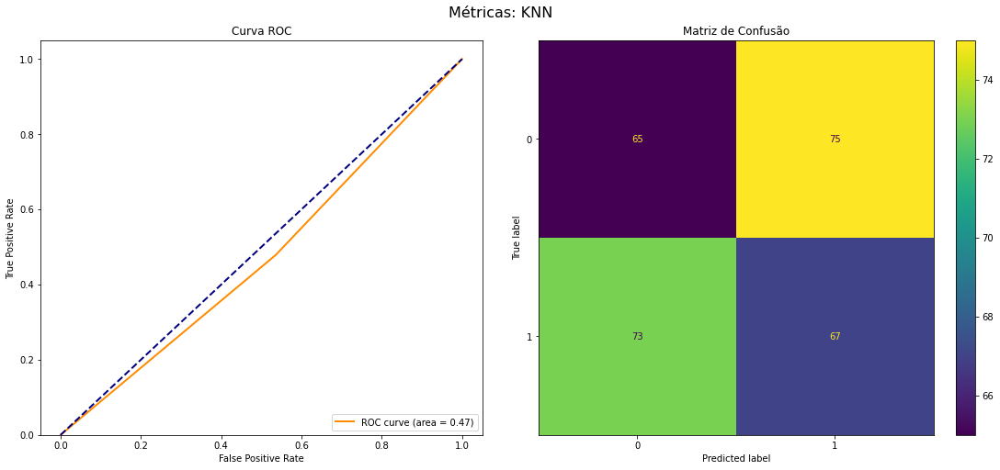

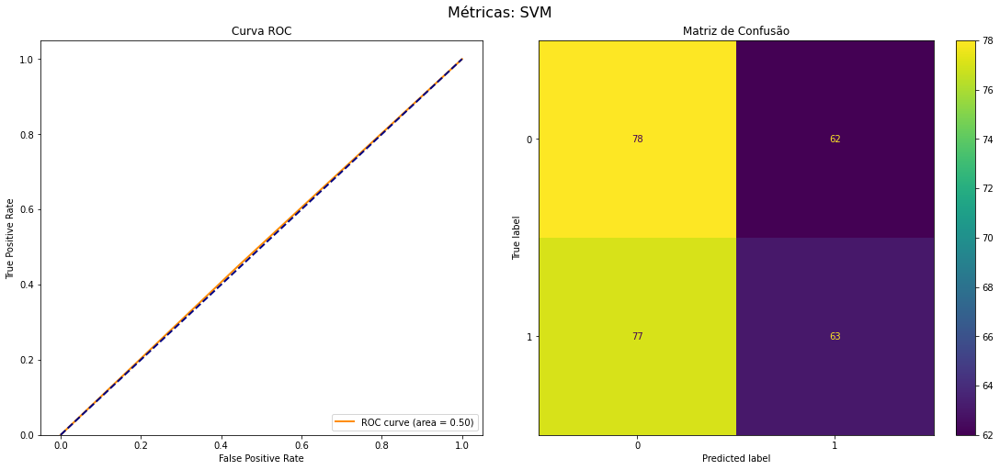

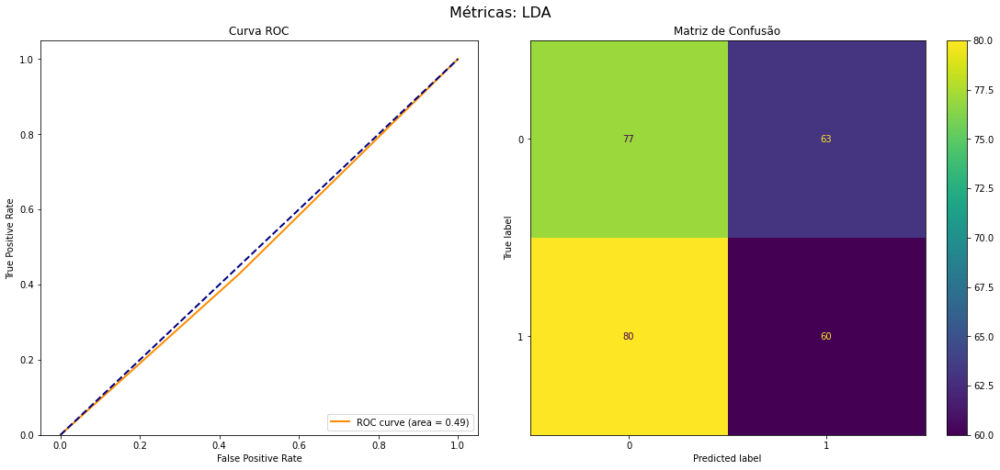

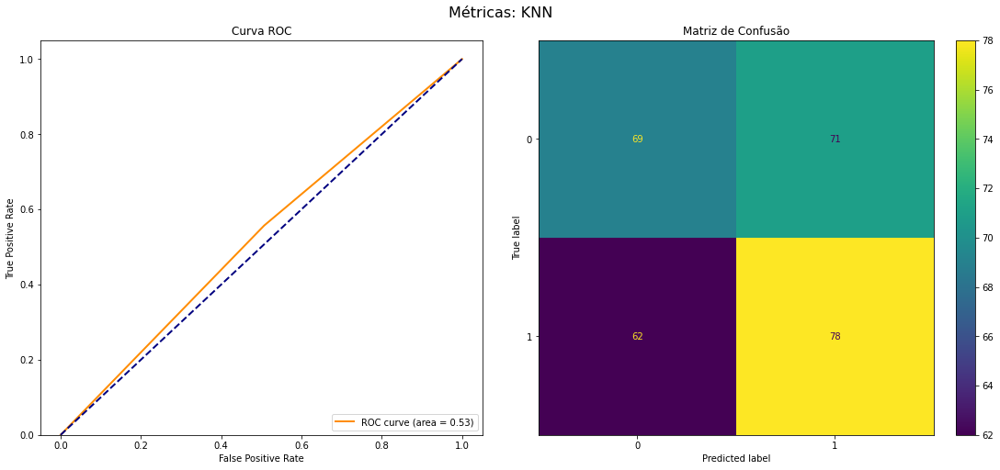

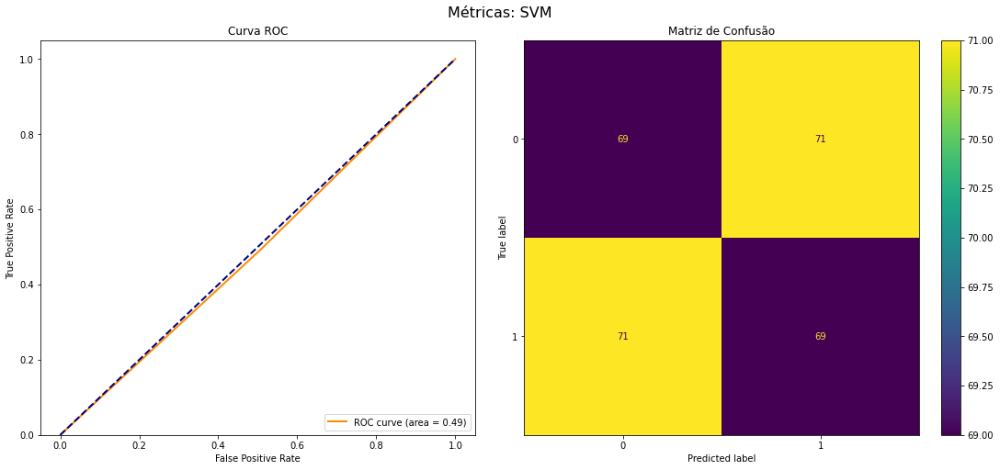

...

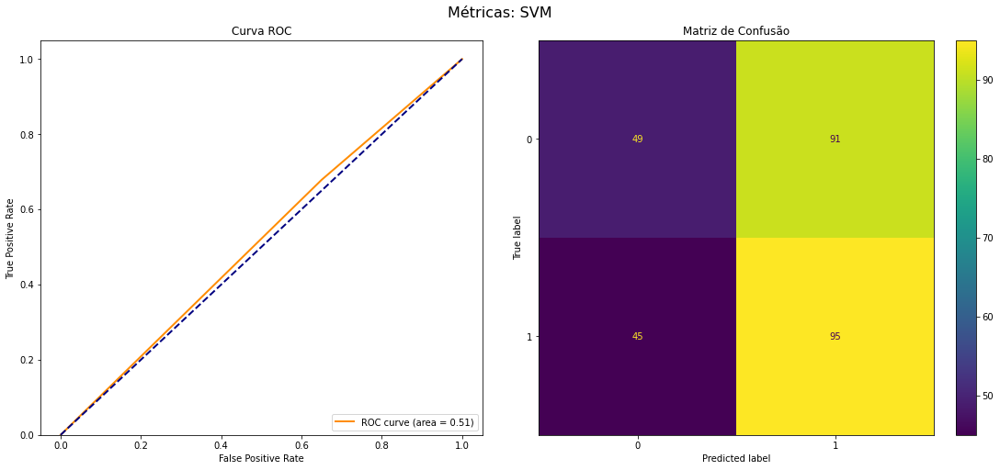

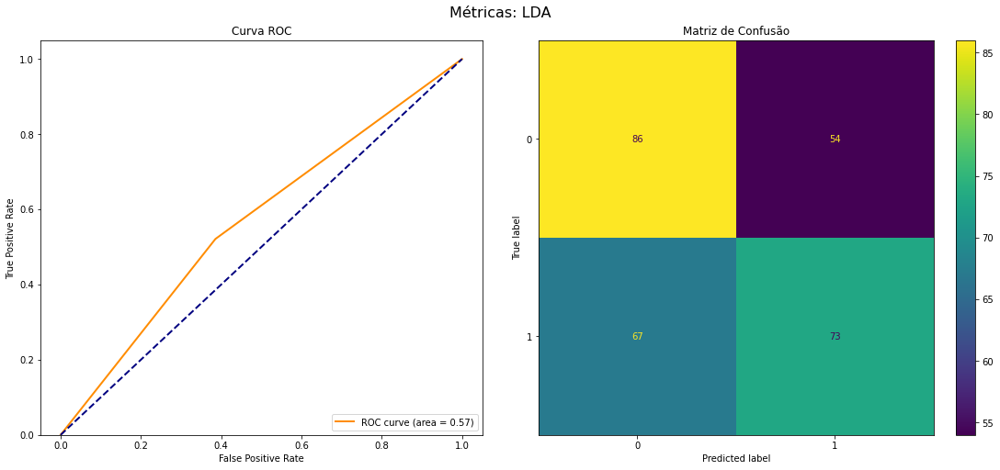

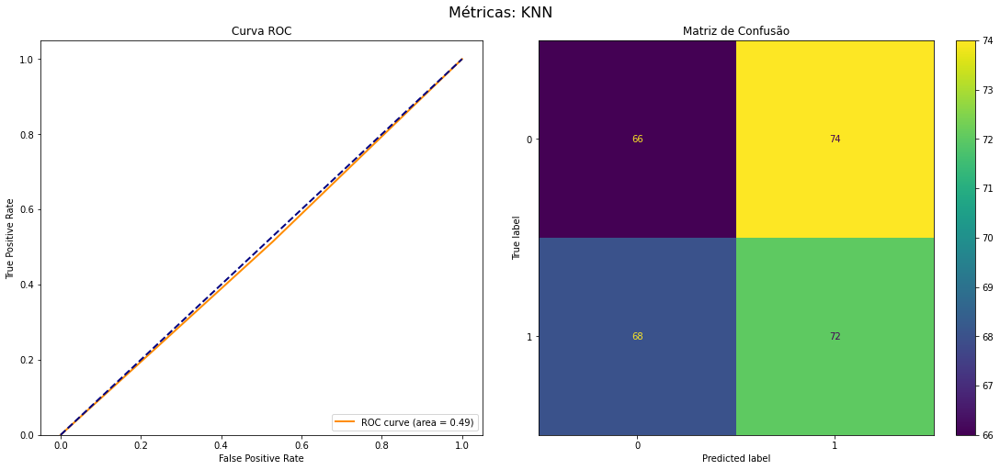

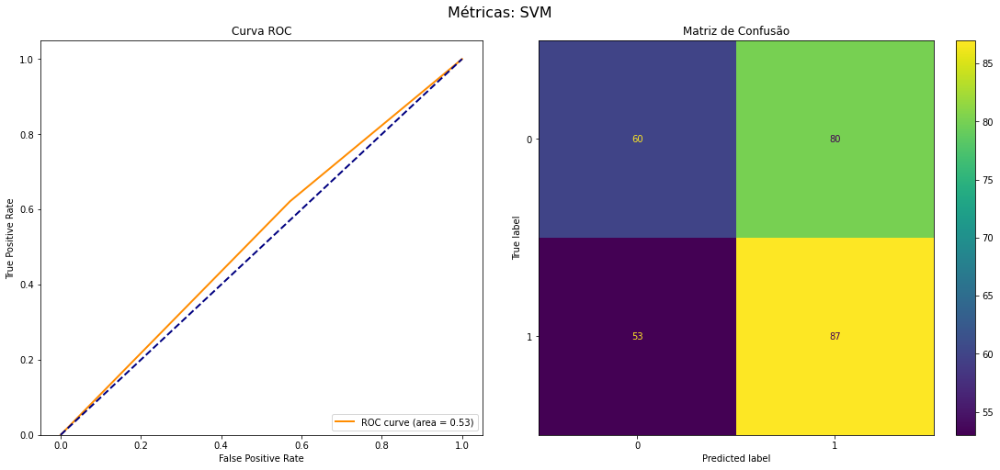

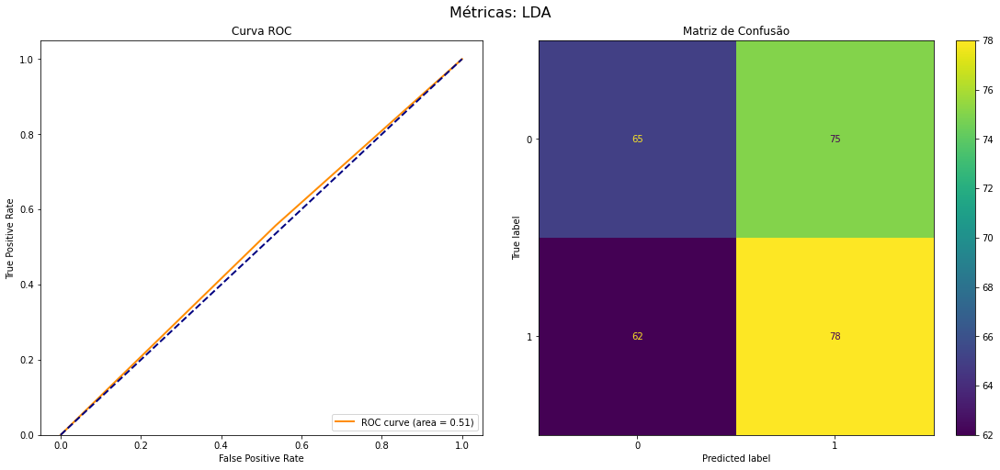

In [5]:
directory = 'C:/Users/Maods/Documents/TCC/data/BCICIV_1_mat/'
ext = '*.mat'
x_mat,y_mat = load_eeg_data_mat(directory, ext)
run_pipeline(x_mat,y_mat, fs=100, dataset_name="BCICIV_I", subject_id="all", results=models_resut, multiclass=False)

### Training the subjects' data separately

Shape of EEG: (59, 190594)
Sample rate: 100
Number of channels: 59
Channel names: ['AF3', 'AF4', 'F5', 'F3', 'F1', 'Fz', 'F2', 'F4', 'F6', 'FC5', 'FC3', 'FC1', 'FCz', 'FC2', 'FC4', 'FC6', 'CFC7', 'CFC5', 'CFC3', 'CFC1', 'CFC2', 'CFC4', 'CFC6', 'CFC8', 'T7', 'C5', 'C3', 'C1', 'Cz', 'C2', 'C4', 'C6', 'T8', 'CCP7', 'CCP5', 'CCP3', 'CCP1', 'CCP2', 'CCP4', 'CCP6', 'CCP8', 'CP5', 'CP3', 'CP1', 'CPz', 'CP2', 'CP4', 'CP6', 'P5', 'P3', 'P1', 'Pz', 'P2', 'P4', 'P6', 'PO1', 'PO2', 'O1', 'O2']
Number of events: 1
Event codes: [-1  1]
Class labels: ['left', 'foot']
Number of classes: 2
Shape of trials[cl1]: (100, 59, 200)
Shape of trials[cl2]: (100, 59, 200)

Training KNN model...
Data Shape: (200, 11800)...
----------------------------------------------------------------------------------------------------
PIPELINE: 
MODEL: KNN
Runtime: 0:00:00.120952
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.68      0.65      0

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: 
MODEL: LDA
Runtime: 0:00:50.513516
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.57      0.65      0.60        20
           1       0.59      0.50      0.54        20

    accuracy                           0.57        40
   macro avg       0.58      0.57      0.57        40
weighted avg       0.58      0.57      0.57        40
 

Train Data:

Cross validation score ACC: 0.606 

Test Data:

Accuracy: 0.575 

Precision: 0.5767263427109974 

Recall: 0.575 

F1 Score: 0.572595851665619 

Area Under Curve: 0.5750000000000001 

Cohen_kappa: 0.15000000000000002 

Matthews Coef: 0.1517165212272521 


Processing step STD_Scaler...
Data Shape: (200, 59, 200)...

Training KNN model...
Data Shape: (200, 11800)...
--------------------------------------------------------------------------------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: STD_Scaler
MODEL: LDA
Runtime: 0:00:48.681468
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.56      0.70      0.62        20
           1       0.60      0.45      0.51        20

    accuracy                           0.57        40
   macro avg       0.58      0.57      0.57        40
weighted avg       0.58      0.57      0.57        40
 

Train Data:

Cross validation score ACC: 0.581 

Test Data:

Accuracy: 0.575 

Precision: 0.5800000000000001 

Recall: 0.575 

F1 Score: 0.5682539682539682 

Area Under Curve: 0.575 

Cohen_kappa: 0.15000000000000002 

Matthews Coef: 0.15491933384829668 


Processing step Wavelet...
Data Shape: (200, 59, 200)...

Training KNN model...
Data Shape: (200, 3127)...
-------------------------------------------------------------------------------------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet
MODEL: LDA
Runtime: 0:00:03.197902
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.59      0.65      0.62        20
           1       0.61      0.55      0.58        20

    accuracy                           0.60        40
   macro avg       0.60      0.60      0.60        40
weighted avg       0.60      0.60      0.60        40
 

Train Data:

Cross validation score ACC: 0.625 

Test Data:

Accuracy: 0.6 

Precision: 0.601010101010101 

Recall: 0.6 

F1 Score: 0.5989974937343359 

Area Under Curve: 0.6000000000000001 

Cohen_kappa: 0.19999999999999996 

Matthews Coef: 0.20100756305184242 


Processing step bandpass...
Data Shape: (200, 59, 200)...

Processing step PSD...
Data Shape: (200, 59, 200)...

Training KNN model...
Data Shape: (200, 5959)...
-------------------------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '


----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: SVM
Runtime: 0:00:00.076665
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.52      0.65      0.58        20
           1       0.53      0.40      0.46        20

    accuracy                           0.53        40
   macro avg       0.53      0.53      0.52        40
weighted avg       0.53      0.53      0.52        40
 

Train Data:

Cross validation score ACC: 0.669 

Test Data:

Accuracy: 0.525 

Precision: 0.5266666666666666 

Recall: 0.525 

F1 Score: 0.5174603174603176 

Area Under Curve: 0.5249999999999999 

Cohen_kappa: 0.050000000000000044 

Matthews Coef: 0.051639777949432225 


Training LDA model...
Data Shape: (200, 5959)...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: LDA
Runtime: 0:00:11.009733
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.57      0.65      0.60        20
           1       0.59      0.50      0.54        20

    accuracy                           0.57        40
   macro avg       0.58      0.57      0.57        40
weighted avg       0.58      0.57      0.57        40
 

Train Data:

Cross validation score ACC: 0.588 

Test Data:

Accuracy: 0.575 

Precision: 0.5767263427109974 

Recall: 0.575 

F1 Score: 0.572595851665619 

Area Under Curve: 0.5750000000000001 

Cohen_kappa: 0.15000000000000002 

Matthews Coef: 0.1517165212272521 


Processing step Wavelet...
Data Shape: (200, 59, 200)...

Processing step Time Domain Features...
Data Shape: (200, 59, 53)...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 53, using nperseg = 53
  warnings.warn('nperseg = {0:d} is greater than input length '



Training KNN model...
Data Shape: (200, 472)...
----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: KNN
Runtime: 0:00:00.008212
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.65      0.75      0.70        20
           1       0.71      0.60      0.65        20

    accuracy                           0.68        40
   macro avg       0.68      0.68      0.67        40
weighted avg       0.68      0.68      0.67        40
 

Train Data:

Cross validation score ACC: 0.575 

Test Data:

Accuracy: 0.675 

Precision: 0.6790281329923274 

Recall: 0.675 

F1 Score: 0.6731615336266499 

Area Under Curve: 0.675 

Cohen_kappa: 0.35 

Matthews Coef: 0.35400521619692155 


Training SVM model...
Data Shape: (200, 472)...
----------------------------------------------------------------------------------------------------


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: LDA
Runtime: 0:00:00.420812
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.61      0.55      0.58        20
           1       0.59      0.65      0.62        20

    accuracy                           0.60        40
   macro avg       0.60      0.60      0.60        40
weighted avg       0.60      0.60      0.60        40
 

Train Data:

Cross validation score ACC: 0.712 

Test Data:

Accuracy: 0.6 

Precision: 0.601010101010101 

Recall: 0.6 

F1 Score: 0.5989974937343359 

Area Under Curve: 0.6 

Cohen_kappa: 0.19999999999999996 

Matthews Coef: 0.20100756305184242 


Processing step PSD...
Data Shape: (200, 59, 200)...

Processing step Time Domain Features...
Data Shape: (200, 59, 101)...

Processing step STD_Scaler...
Data Shape: (200, 472)...

Training

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: PSD -> Time Domain Features -> STD_Scaler
MODEL: LDA
Runtime: 0:00:00.428646
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.55      0.55      0.55        20
           1       0.55      0.55      0.55        20

    accuracy                           0.55        40
   macro avg       0.55      0.55      0.55        40
weighted avg       0.55      0.55      0.55        40
 

Train Data:

Cross validation score ACC: 0.631 

Test Data:

Accuracy: 0.55 

Precision: 0.55 

Recall: 0.55 

F1 Score: 0.55 

Area Under Curve: 0.55 

Cohen_kappa: 0.09999999999999998 

Matthews Coef: 0.1 

Shape of EEG: (59, 190594)
Sample rate: 100
Number of channels: 59
Channel names: ['AF3', 'AF4', 'F5', 'F3', 'F1', 'Fz', 'F2', 'F4', 'F6', 'FC5', 'FC3', 'FC1', 'FCz', 'FC2', 'FC4', 'FC6', 'CFC7', 'CFC5', 'CFC3', 'CFC1', '

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: 
MODEL: LDA
Runtime: 0:00:48.958681
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.50      0.35      0.41        20
           1       0.50      0.65      0.57        20

    accuracy                           0.50        40
   macro avg       0.50      0.50      0.49        40
weighted avg       0.50      0.50      0.49        40
 

Train Data:

Cross validation score ACC: 0.562 

Test Data:

Accuracy: 0.5 

Precision: 0.5 

Recall: 0.5 

F1 Score: 0.48849104859335035 

Area Under Curve: 0.5 

Cohen_kappa: 0.0 

Matthews Coef: 0.0 


Processing step STD_Scaler...
Data Shape: (200, 59, 200)...

Training KNN model...
Data Shape: (200, 11800)...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\src\utils\mlpipelinebuilder.py:107: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1, 2, constrained_layout=True, figsize=(15,7))


----------------------------------------------------------------------------------------------------
PIPELINE: STD_Scaler
MODEL: KNN
Runtime: 0:00:00.090649
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.60      0.45      0.51        20
           1       0.56      0.70      0.62        20

    accuracy                           0.57        40
   macro avg       0.58      0.57      0.57        40
weighted avg       0.58      0.57      0.57        40
 

Train Data:

Cross validation score ACC: 0.506 

Test Data:

Accuracy: 0.575 

Precision: 0.5800000000000001 

Recall: 0.575 

F1 Score: 0.5682539682539682 

Area Under Curve: 0.575 

Cohen_kappa: 0.15000000000000002 

Matthews Coef: 0.15491933384829668 


Training SVM model...
Data Shape: (200, 11800)...
----------------------------------------------------------------------------------------------------
PIPELINE: STD_Scaler
MODEL: SVM
Runtime: 0:00:00.1296

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: STD_Scaler
MODEL: LDA
Runtime: 0:00:48.383969
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.71      0.50      0.59        20
           1       0.62      0.80      0.70        20

    accuracy                           0.65        40
   macro avg       0.66      0.65      0.64        40
weighted avg       0.66      0.65      0.64        40
 

Train Data:

Cross validation score ACC: 0.544 

Test Data:

Accuracy: 0.65 

Precision: 0.6648351648351649 

Recall: 0.65 

F1 Score: 0.6419437340153452 

Area Under Curve: 0.65 

Cohen_kappa: 0.30000000000000004 

Matthews Coef: 0.3144854510165755 


Processing step Wavelet...
Data Shape: (200, 59, 200)...

Training KNN model...
Data Shape: (200, 3127)...
----------------------------------------------------------------------------------------------------


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet
MODEL: LDA
Runtime: 0:00:03.201841
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.50      0.50      0.50        20
           1       0.50      0.50      0.50        20

    accuracy                           0.50        40
   macro avg       0.50      0.50      0.50        40
weighted avg       0.50      0.50      0.50        40
 

Train Data:

Cross validation score ACC: 0.556 

Test Data:

Accuracy: 0.5 

Precision: 0.5 

Recall: 0.5 

F1 Score: 0.5 

Area Under Curve: 0.5 

Cohen_kappa: 0.0 

Matthews Coef: 0.0 


Processing step bandpass...
Data Shape: (200, 59, 200)...

Processing step PSD...
Data Shape: (200, 59, 200)...

Training KNN model...
Data Shape: (200, 5959)...
----------------------------------------------------------------------------------------------------
PIPELINE: ba

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '


----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: SVM
Runtime: 0:00:00.085987
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.62      0.65      0.63        20
           1       0.63      0.60      0.62        20

    accuracy                           0.62        40
   macro avg       0.63      0.62      0.62        40
weighted avg       0.63      0.62      0.62        40
 

Train Data:

Cross validation score ACC: 0.612 

Test Data:

Accuracy: 0.625 

Precision: 0.6253132832080202 

Recall: 0.625 

F1 Score: 0.6247654784240151 

Area Under Curve: 0.625 

Cohen_kappa: 0.25 

Matthews Coef: 0.25031308716087947 


Training LDA model...
Data Shape: (200, 5959)...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: LDA
Runtime: 0:00:11.742661
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.48      0.50      0.49        20
           1       0.47      0.45      0.46        20

    accuracy                           0.48        40
   macro avg       0.47      0.47      0.47        40
weighted avg       0.47      0.47      0.47        40
 

Train Data:

Cross validation score ACC: 0.488 

Test Data:

Accuracy: 0.475 

Precision: 0.474937343358396 

Recall: 0.475 

F1 Score: 0.474671669793621 

Area Under Curve: 0.475 

Cohen_kappa: -0.050000000000000044 

Matthews Coef: -0.05006261743217589 


Processing step Wavelet...
Data Shape: (200, 59, 200)...

Processing step Time Domain Features...
Data Shape: (200, 59, 53)...

Training KNN model...
Data Shape: (200, 472)...
----------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 53, using nperseg = 53
  warnings.warn('nperseg = {0:d} is greater than input length '


----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: SVM
Runtime: 0:00:00.153738
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.48      0.50      0.49        20
           1       0.47      0.45      0.46        20

    accuracy                           0.48        40
   macro avg       0.47      0.47      0.47        40
weighted avg       0.47      0.47      0.47        40
 

Train Data:

Cross validation score ACC: 0.512 

Test Data:

Accuracy: 0.475 

Precision: 0.474937343358396 

Recall: 0.475 

F1 Score: 0.474671669793621 

Area Under Curve: 0.475 

Cohen_kappa: -0.050000000000000044 

Matthews Coef: -0.05006261743217589 


Training LDA model...
Data Shape: (200, 472)...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: LDA
Runtime: 0:00:00.433403
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.56      0.45      0.50        20
           1       0.54      0.65      0.59        20

    accuracy                           0.55        40
   macro avg       0.55      0.55      0.55        40
weighted avg       0.55      0.55      0.55        40
 

Train Data:

Cross validation score ACC: 0.556 

Test Data:

Accuracy: 0.55 

Precision: 0.5520833333333333 

Recall: 0.55 

F1 Score: 0.5454545454545454 

Area Under Curve: 0.55 

Cohen_kappa: 0.09999999999999998 

Matthews Coef: 0.10206207261596575 


Processing step PSD...
Data Shape: (200, 59, 200)...

Processing step Time Domain Features...
Data Shape: (200, 59, 101)...

Processing step STD_Scaler...
Data Shape: (200, 472)...

Trai

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: PSD -> Time Domain Features -> STD_Scaler
MODEL: LDA
Runtime: 0:00:00.448839
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.42      0.40      0.41        20
           1       0.43      0.45      0.44        20

    accuracy                           0.42        40
   macro avg       0.42      0.43      0.42        40
weighted avg       0.42      0.42      0.42        40
 

Train Data:

Cross validation score ACC: 0.469 

Test Data:

Accuracy: 0.425 

Precision: 0.424812030075188 

Recall: 0.425 

F1 Score: 0.42464040025015637 

Area Under Curve: 0.425 

Cohen_kappa: -0.1499999999999999 

Matthews Coef: -0.15018785229652767 

Shape of EEG: (59, 190549)
Sample rate: 100
Number of channels: 59
Channel names: ['AF3', 'AF4', 'F5', 'F3', 'F1', 'Fz', 'F2', 'F4', 'F6', 'FC5', 'FC3', 'FC1', 'FCz', 'FC2',

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: 
MODEL: LDA
Runtime: 0:00:49.221770
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.55      0.60      0.57        20
           1       0.56      0.50      0.53        20

    accuracy                           0.55        40
   macro avg       0.55      0.55      0.55        40
weighted avg       0.55      0.55      0.55        40
 

Train Data:

Cross validation score ACC: 0.506 

Test Data:

Accuracy: 0.55 

Precision: 0.5505050505050505 

Recall: 0.55 

F1 Score: 0.5488721804511277 

Area Under Curve: 0.5499999999999999 

Cohen_kappa: 0.09999999999999998 

Matthews Coef: 0.10050378152592121 


Processing step STD_Scaler...
Data Shape: (200, 59, 200)...

Training KNN model...
Data Shape: (200, 11800)...
--------------------------------------------------------------------------------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: STD_Scaler
MODEL: LDA
Runtime: 0:00:48.457462
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.61      0.70      0.65        20
           1       0.65      0.55      0.59        20

    accuracy                           0.62        40
   macro avg       0.63      0.62      0.62        40
weighted avg       0.63      0.62      0.62        40
 

Train Data:

Cross validation score ACC: 0.45 

Test Data:

Accuracy: 0.625 

Precision: 0.6278772378516624 

Recall: 0.625 

F1 Score: 0.6228786926461345 

Area Under Curve: 0.625 

Cohen_kappa: 0.25 

Matthews Coef: 0.25286086871208685 


Processing step Wavelet...
Data Shape: (200, 59, 200)...

Training KNN model...
Data Shape: (200, 3127)...
----------------------------------------------------------------------------------------------------
PIPELINE: Wa

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet
MODEL: LDA
Runtime: 0:00:03.211658
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.63      0.60      0.62        20
           1       0.62      0.65      0.63        20

    accuracy                           0.62        40
   macro avg       0.63      0.62      0.62        40
weighted avg       0.63      0.62      0.62        40
 

Train Data:

Cross validation score ACC: 0.45 

Test Data:

Accuracy: 0.625 

Precision: 0.6253132832080202 

Recall: 0.625 

F1 Score: 0.6247654784240151 

Area Under Curve: 0.625 

Cohen_kappa: 0.25 

Matthews Coef: 0.25031308716087947 


Processing step bandpass...
Data Shape: (200, 59, 200)...

Processing step PSD...
Data Shape: (200, 59, 200)...

Training KNN model...
Data Shape: (200, 5959)...
-------------------------------------------------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '


----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: SVM
Runtime: 0:00:00.086479
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.72      0.65      0.68        20
           1       0.68      0.75      0.71        20

    accuracy                           0.70        40
   macro avg       0.70      0.70      0.70        40
weighted avg       0.70      0.70      0.70        40
 

Train Data:

Cross validation score ACC: 0.581 

Test Data:

Accuracy: 0.7 

Precision: 0.702020202020202 

Recall: 0.7 

F1 Score: 0.6992481203007519 

Area Under Curve: 0.7 

Cohen_kappa: 0.4 

Matthews Coef: 0.40201512610368484 


Training LDA model...
Data Shape: (200, 5959)...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: LDA
Runtime: 0:00:10.996862
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.71      0.75      0.73        20
           1       0.74      0.70      0.72        20

    accuracy                           0.73        40
   macro avg       0.73      0.72      0.72        40
weighted avg       0.73      0.72      0.72        40
 

Train Data:

Cross validation score ACC: 0.431 

Test Data:

Accuracy: 0.725 

Precision: 0.7255639097744361 

Recall: 0.725 

F1 Score: 0.7248280175109443 

Area Under Curve: 0.725 

Cohen_kappa: 0.44999999999999996 

Matthews Coef: 0.450563556889583 


Processing step Wavelet...
Data Shape: (200, 59, 200)...

Processing step Time Domain Features...
Data Shape: (200, 59, 53)...

Training KNN model...
Data Shape: (200, 472)...
-------------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 53, using nperseg = 53
  warnings.warn('nperseg = {0:d} is greater than input length '



Training SVM model...
Data Shape: (200, 472)...
----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: SVM
Runtime: 0:00:17.943815
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.47      0.45      0.46        20
           1       0.48      0.50      0.49        20

    accuracy                           0.48        40
   macro avg       0.47      0.47      0.47        40
weighted avg       0.47      0.47      0.47        40
 

Train Data:

Cross validation score ACC: 0.506 

Test Data:

Accuracy: 0.475 

Precision: 0.474937343358396 

Recall: 0.475 

F1 Score: 0.474671669793621 

Area Under Curve: 0.475 

Cohen_kappa: -0.050000000000000044 

Matthews Coef: -0.05006261743217589 


Training LDA model...
Data Shape: (200, 472)...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: LDA
Runtime: 0:00:00.427694
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.40      0.30      0.34        20
           1       0.44      0.55      0.49        20

    accuracy                           0.42        40
   macro avg       0.42      0.43      0.42        40
weighted avg       0.42      0.42      0.42        40
 

Train Data:

Cross validation score ACC: 0.481 

Test Data:

Accuracy: 0.425 

Precision: 0.42000000000000004 

Recall: 0.425 

F1 Score: 0.4158730158730159 

Area Under Curve: 0.42500000000000004 

Cohen_kappa: -0.1499999999999999 

Matthews Coef: -0.15491933384829668 


Processing step PSD...
Data Shape: (200, 59, 200)...

Processing step Time Domain Features...
Data Shape: (200, 59, 101)...

Processing step STD_Scaler...
Data Shape: 

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: PSD -> Time Domain Features -> STD_Scaler
MODEL: LDA
Runtime: 0:00:00.412557
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.53      0.45      0.49        20
           1       0.52      0.60      0.56        20

    accuracy                           0.53        40
   macro avg       0.53      0.53      0.52        40
weighted avg       0.53      0.53      0.52        40
 

Train Data:

Cross validation score ACC: 0.431 

Test Data:

Accuracy: 0.525 

Precision: 0.5255754475703325 

Recall: 0.525 

F1 Score: 0.5223130106851037 

Area Under Curve: 0.525 

Cohen_kappa: 0.050000000000000044 

Matthews Coef: 0.05057217374241736 

Shape of EEG: (59, 190473)
Sample rate: 100
Number of channels: 59
Channel names: ['AF3', 'AF4', 'F5', 'F3', 'F1', 'Fz', 'F2', 'F4', 'F6', 'FC5', 'FC3', 'FC1', 'FCz', 'FC2',

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: 
MODEL: LDA
Runtime: 0:00:48.417030
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.38      0.40      0.39        20
           1       0.37      0.35      0.36        20

    accuracy                           0.38        40
   macro avg       0.37      0.38      0.37        40
weighted avg       0.37      0.38      0.37        40
 

Train Data:

Cross validation score ACC: 0.538 

Test Data:

Accuracy: 0.375 

Precision: 0.37468671679197996 

Recall: 0.375 

F1 Score: 0.37460913070669166 

Area Under Curve: 0.375 

Cohen_kappa: -0.25 

Matthews Coef: -0.25031308716087947 


Processing step STD_Scaler...
Data Shape: (200, 59, 200)...

Training KNN model...
Data Shape: (200, 11800)...
----------------------------------------------------------------------------------------------------
PIPELINE: STD

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: STD_Scaler
MODEL: LDA
Runtime: 0:00:49.204021
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.48      0.55      0.51        20
           1       0.47      0.40      0.43        20

    accuracy                           0.48        40
   macro avg       0.47      0.48      0.47        40
weighted avg       0.47      0.47      0.47        40
 

Train Data:

Cross validation score ACC: 0.544 

Test Data:

Accuracy: 0.475 

Precision: 0.47442455242966747 

Recall: 0.475 

F1 Score: 0.47203016970458833 

Area Under Curve: 0.47500000000000003 

Cohen_kappa: -0.050000000000000044 

Matthews Coef: -0.05057217374241736 


Processing step Wavelet...
Data Shape: (200, 59, 200)...

Training KNN model...
Data Shape: (200, 3127)...
------------------------------------------------------------------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet
MODEL: LDA
Runtime: 0:00:03.333638
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.45      0.50      0.48        20
           1       0.44      0.40      0.42        20

    accuracy                           0.45        40
   macro avg       0.45      0.45      0.45        40
weighted avg       0.45      0.45      0.45        40
 

Train Data:

Cross validation score ACC: 0.55 

Test Data:

Accuracy: 0.45 

Precision: 0.4494949494949495 

Recall: 0.45 

F1 Score: 0.44862155388471175 

Area Under Curve: 0.44999999999999996 

Cohen_kappa: -0.10000000000000009 

Matthews Coef: -0.10050378152592121 


Processing step bandpass...
Data Shape: (200, 59, 200)...

Processing step PSD...
Data Shape: (200, 59, 200)...

Training KNN model...
Data Shape: (200, 5959)...
-------------------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '


----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: SVM
Runtime: 0:00:00.079543
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.53      0.40      0.46        20
           1       0.52      0.65      0.58        20

    accuracy                           0.53        40
   macro avg       0.53      0.53      0.52        40
weighted avg       0.53      0.53      0.52        40
 

Train Data:

Cross validation score ACC: 0.512 

Test Data:

Accuracy: 0.525 

Precision: 0.5266666666666666 

Recall: 0.525 

F1 Score: 0.5174603174603176 

Area Under Curve: 0.525 

Cohen_kappa: 0.050000000000000044 

Matthews Coef: 0.051639777949432225 


Training LDA model...
Data Shape: (200, 5959)...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: LDA
Runtime: 0:00:11.039664
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.44      0.35      0.39        20
           1       0.46      0.55      0.50        20

    accuracy                           0.45        40
   macro avg       0.45      0.45      0.44        40
weighted avg       0.45      0.45      0.44        40
 

Train Data:

Cross validation score ACC: 0.488 

Test Data:

Accuracy: 0.45 

Precision: 0.44791666666666663 

Recall: 0.45 

F1 Score: 0.4444444444444445 

Area Under Curve: 0.45 

Cohen_kappa: -0.10000000000000009 

Matthews Coef: -0.10206207261596575 


Processing step Wavelet...
Data Shape: (200, 59, 200)...

Processing step Time Domain Features...
Data Shape: (200, 59, 53)...

Training KNN model...
Data Shape: (200, 472)...
-----------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 53, using nperseg = 53
  warnings.warn('nperseg = {0:d} is greater than input length '



Training SVM model...
Data Shape: (200, 472)...
----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: SVM
Runtime: 0:00:46.437573
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.29      0.30      0.29        20
           1       0.26      0.25      0.26        20

    accuracy                           0.28        40
   macro avg       0.27      0.28      0.27        40
weighted avg       0.27      0.28      0.27        40
 

Train Data:

Cross validation score ACC: 0.494 

Test Data:

Accuracy: 0.275 

Precision: 0.27443609022556387 

Recall: 0.275 

F1 Score: 0.27454659161976236 

Area Under Curve: 0.275 

Cohen_kappa: -0.44999999999999996 

Matthews Coef: -0.450563556889583 


Training LDA model...
Data Shape: (200, 472)...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: LDA
Runtime: 0:00:00.423103
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.50      0.45      0.47        20
           1       0.50      0.55      0.52        20

    accuracy                           0.50        40
   macro avg       0.50      0.50      0.50        40
weighted avg       0.50      0.50      0.50        40
 

Train Data:

Cross validation score ACC: 0.444 

Test Data:

Accuracy: 0.5 

Precision: 0.5 

Recall: 0.5 

F1 Score: 0.4987468671679198 

Area Under Curve: 0.5 

Cohen_kappa: 0.0 

Matthews Coef: 0.0 


Processing step PSD...
Data Shape: (200, 59, 200)...

Processing step Time Domain Features...
Data Shape: (200, 59, 101)...

Processing step STD_Scaler...
Data Shape: (200, 472)...

Training KNN model...
Data Shape: (200, 472)...
------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: PSD -> Time Domain Features -> STD_Scaler
MODEL: LDA
Runtime: 0:00:00.422993
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.54      0.70      0.61        20
           1       0.57      0.40      0.47        20

    accuracy                           0.55        40
   macro avg       0.55      0.55      0.54        40
weighted avg       0.55      0.55      0.54        40
 

Train Data:

Cross validation score ACC: 0.488 

Test Data:

Accuracy: 0.55 

Precision: 0.554945054945055 

Recall: 0.55 

F1 Score: 0.5396419437340153 

Area Under Curve: 0.5499999999999999 

Cohen_kappa: 0.09999999999999998 

Matthews Coef: 0.10482848367219183 

Shape of EEG: (59, 190329)
Sample rate: 100
Number of channels: 59
Channel names: ['AF3', 'AF4', 'F5', 'F3', 'F1', 'Fz', 'F2', 'F4', 'F6', 'FC5', 'FC3', 'FC1', 'FCz

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: 
MODEL: LDA
Runtime: 0:00:50.202427
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.43      0.50      0.47        20
           1       0.41      0.35      0.38        20

    accuracy                           0.42        40
   macro avg       0.42      0.42      0.42        40
weighted avg       0.42      0.42      0.42        40
 

Train Data:

Cross validation score ACC: 0.5 

Test Data:

Accuracy: 0.425 

Precision: 0.4232736572890025 

Recall: 0.425 

F1 Score: 0.4217473287240729 

Area Under Curve: 0.42500000000000004 

Cohen_kappa: -0.1499999999999999 

Matthews Coef: -0.1517165212272521 


Processing step STD_Scaler...
Data Shape: (200, 59, 200)...

Training KNN model...
Data Shape: (200, 11800)...
-------------------------------------------------------------------------------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: STD_Scaler
MODEL: LDA
Runtime: 0:00:53.995189
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.43      0.50      0.47        20
           1       0.41      0.35      0.38        20

    accuracy                           0.42        40
   macro avg       0.42      0.42      0.42        40
weighted avg       0.42      0.42      0.42        40
 

Train Data:

Cross validation score ACC: 0.412 

Test Data:

Accuracy: 0.425 

Precision: 0.4232736572890025 

Recall: 0.425 

F1 Score: 0.4217473287240729 

Area Under Curve: 0.42500000000000004 

Cohen_kappa: -0.1499999999999999 

Matthews Coef: -0.1517165212272521 


Processing step Wavelet...
Data Shape: (200, 59, 200)...

Training KNN model...
Data Shape: (200, 3127)...
-----------------------------------------------------------------------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet
MODEL: LDA
Runtime: 0:00:03.358478
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.43      0.45      0.44        20
           1       0.42      0.40      0.41        20

    accuracy                           0.42        40
   macro avg       0.42      0.43      0.42        40
weighted avg       0.42      0.42      0.42        40
 

Train Data:

Cross validation score ACC: 0.438 

Test Data:

Accuracy: 0.425 

Precision: 0.424812030075188 

Recall: 0.425 

F1 Score: 0.42464040025015637 

Area Under Curve: 0.42499999999999993 

Cohen_kappa: -0.1499999999999999 

Matthews Coef: -0.15018785229652767 


Processing step bandpass...
Data Shape: (200, 59, 200)...

Processing step PSD...
Data Shape: (200, 59, 200)...

Training KNN model...
Data Shape: (200, 5959)...
------------------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '


----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: SVM
Runtime: 0:00:00.084853
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.70      0.80      0.74        20
           1       0.76      0.65      0.70        20

    accuracy                           0.73        40
   macro avg       0.73      0.73      0.72        40
weighted avg       0.73      0.72      0.72        40
 

Train Data:

Cross validation score ACC: 0.688 

Test Data:

Accuracy: 0.725 

Precision: 0.7301790281329923 

Recall: 0.725 

F1 Score: 0.7234443746071653 

Area Under Curve: 0.7250000000000001 

Cohen_kappa: 0.44999999999999996 

Matthews Coef: 0.4551495636817563 


Training LDA model...
Data Shape: (200, 5959)...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: LDA
Runtime: 0:00:12.028687
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.44      0.55      0.49        20
           1       0.40      0.30      0.34        20

    accuracy                           0.42        40
   macro avg       0.42      0.43      0.42        40
weighted avg       0.42      0.42      0.42        40
 

Train Data:

Cross validation score ACC: 0.556 

Test Data:

Accuracy: 0.425 

Precision: 0.42000000000000004 

Recall: 0.425 

F1 Score: 0.4158730158730159 

Area Under Curve: 0.42500000000000004 

Cohen_kappa: -0.1499999999999999 

Matthews Coef: -0.15491933384829668 


Processing step Wavelet...
Data Shape: (200, 59, 200)...

Processing step Time Domain Features...
Data Shape: (200, 59, 53)...

Training KNN model...
Data Shape: (200, 472)...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 53, using nperseg = 53
  warnings.warn('nperseg = {0:d} is greater than input length '


----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: KNN
Runtime: 0:00:00.012385
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.48      0.50      0.49        20
           1       0.47      0.45      0.46        20

    accuracy                           0.48        40
   macro avg       0.47      0.47      0.47        40
weighted avg       0.47      0.47      0.47        40
 

Train Data:

Cross validation score ACC: 0.45 

Test Data:

Accuracy: 0.475 

Precision: 0.474937343358396 

Recall: 0.475 

F1 Score: 0.474671669793621 

Area Under Curve: 0.475 

Cohen_kappa: -0.050000000000000044 

Matthews Coef: -0.05006261743217589 


Training SVM model...
Data Shape: (200, 472)...
----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain F

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: LDA
Runtime: 0:00:00.460476
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.67      0.80      0.73        20
           1       0.75      0.60      0.67        20

    accuracy                           0.70        40
   macro avg       0.71      0.70      0.70        40
weighted avg       0.71      0.70      0.70        40
 

Train Data:

Cross validation score ACC: 0.469 

Test Data:

Accuracy: 0.7 

Precision: 0.7083333333333333 

Recall: 0.7 

F1 Score: 0.6969696969696969 

Area Under Curve: 0.7000000000000002 

Cohen_kappa: 0.4 

Matthews Coef: 0.408248290463863 


Processing step PSD...
Data Shape: (200, 59, 200)...

Processing step Time Domain Features...
Data Shape: (200, 59, 101)...

Processing step STD_Scaler...
Data Shape: (200, 472)...

Training K

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: PSD -> Time Domain Features -> STD_Scaler
MODEL: LDA
Runtime: 0:00:00.449176
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.52      0.60      0.56        20
           1       0.53      0.45      0.49        20

    accuracy                           0.53        40
   macro avg       0.53      0.53      0.52        40
weighted avg       0.53      0.53      0.52        40
 

Train Data:

Cross validation score ACC: 0.475 

Test Data:

Accuracy: 0.525 

Precision: 0.5255754475703325 

Recall: 0.525 

F1 Score: 0.5223130106851037 

Area Under Curve: 0.525 

Cohen_kappa: 0.050000000000000044 

Matthews Coef: 0.05057217374241736 

Shape of EEG: (59, 190608)
Sample rate: 100
Number of channels: 59
Channel names: ['AF3', 'AF4', 'F5', 'F3', 'F1', 'Fz', 'F2', 'F4', 'F6', 'FC5', 'FC3', 'FC1', 'FCz', 'FC2',

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: 
MODEL: LDA
Runtime: 0:00:54.533260
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.59      0.65      0.62        20
           1       0.61      0.55      0.58        20

    accuracy                           0.60        40
   macro avg       0.60      0.60      0.60        40
weighted avg       0.60      0.60      0.60        40
 

Train Data:

Cross validation score ACC: 0.456 

Test Data:

Accuracy: 0.6 

Precision: 0.601010101010101 

Recall: 0.6 

F1 Score: 0.5989974937343359 

Area Under Curve: 0.6000000000000001 

Cohen_kappa: 0.19999999999999996 

Matthews Coef: 0.20100756305184242 


Processing step STD_Scaler...
Data Shape: (200, 59, 200)...

Training KNN model...
Data Shape: (200, 11800)...
-----------------------------------------------------------------------------------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: STD_Scaler
MODEL: LDA
Runtime: 0:00:54.364671
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.56      0.70      0.62        20
           1       0.60      0.45      0.51        20

    accuracy                           0.57        40
   macro avg       0.58      0.57      0.57        40
weighted avg       0.58      0.57      0.57        40
 

Train Data:

Cross validation score ACC: 0.438 

Test Data:

Accuracy: 0.575 

Precision: 0.5800000000000001 

Recall: 0.575 

F1 Score: 0.5682539682539682 

Area Under Curve: 0.575 

Cohen_kappa: 0.15000000000000002 

Matthews Coef: 0.15491933384829668 


Processing step Wavelet...
Data Shape: (200, 59, 200)...

Training KNN model...
Data Shape: (200, 3127)...
-------------------------------------------------------------------------------------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet
MODEL: LDA
Runtime: 0:00:03.465050
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.54      0.65      0.59        20
           1       0.56      0.45      0.50        20

    accuracy                           0.55        40
   macro avg       0.55      0.55      0.55        40
weighted avg       0.55      0.55      0.55        40
 

Train Data:

Cross validation score ACC: 0.438 

Test Data:

Accuracy: 0.55 

Precision: 0.5520833333333333 

Recall: 0.55 

F1 Score: 0.5454545454545454 

Area Under Curve: 0.55 

Cohen_kappa: 0.09999999999999998 

Matthews Coef: 0.10206207261596575 


Processing step bandpass...
Data Shape: (200, 59, 200)...

Processing step PSD...
Data Shape: (200, 59, 200)...

Training KNN model...
Data Shape: (200, 5959)...
------------------------------------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '


----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: SVM
Runtime: 0:00:00.082227
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.61      0.55      0.58        20
           1       0.59      0.65      0.62        20

    accuracy                           0.60        40
   macro avg       0.60      0.60      0.60        40
weighted avg       0.60      0.60      0.60        40
 

Train Data:

Cross validation score ACC: 0.675 

Test Data:

Accuracy: 0.6 

Precision: 0.601010101010101 

Recall: 0.6 

F1 Score: 0.5989974937343359 

Area Under Curve: 0.6 

Cohen_kappa: 0.19999999999999996 

Matthews Coef: 0.20100756305184242 


Training LDA model...
Data Shape: (200, 5959)...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: LDA
Runtime: 0:00:12.264653
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.48      0.55      0.51        20
           1       0.47      0.40      0.43        20

    accuracy                           0.48        40
   macro avg       0.47      0.48      0.47        40
weighted avg       0.47      0.47      0.47        40
 

Train Data:

Cross validation score ACC: 0.506 

Test Data:

Accuracy: 0.475 

Precision: 0.47442455242966747 

Recall: 0.475 

F1 Score: 0.47203016970458833 

Area Under Curve: 0.47500000000000003 

Cohen_kappa: -0.050000000000000044 

Matthews Coef: -0.05057217374241736 


Processing step Wavelet...
Data Shape: (200, 59, 200)...

Processing step Time Domain Features...
Data Shape: (200, 59, 53)...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 53, using nperseg = 53
  warnings.warn('nperseg = {0:d} is greater than input length '



Training KNN model...
Data Shape: (200, 472)...
----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: KNN
Runtime: 0:00:00.010230
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.54      0.35      0.42        20
           1       0.52      0.70      0.60        20

    accuracy                           0.53        40
   macro avg       0.53      0.52      0.51        40
weighted avg       0.53      0.53      0.51        40
 

Train Data:

Cross validation score ACC: 0.562 

Test Data:

Accuracy: 0.525 

Precision: 0.5284900284900285 

Recall: 0.525 

F1 Score: 0.5099935525467441 

Area Under Curve: 0.5249999999999999 

Cohen_kappa: 0.050000000000000044 

Matthews Coef: 0.05337605126836238 


Training SVM model...
Data Shape: (200, 472)...
------------------------------------------------------------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: LDA
Runtime: 0:00:00.454831
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.52      0.65      0.58        20
           1       0.53      0.40      0.46        20

    accuracy                           0.53        40
   macro avg       0.53      0.53      0.52        40
weighted avg       0.53      0.53      0.52        40
 

Train Data:

Cross validation score ACC: 0.6 

Test Data:

Accuracy: 0.525 

Precision: 0.5266666666666666 

Recall: 0.525 

F1 Score: 0.5174603174603176 

Area Under Curve: 0.5249999999999999 

Cohen_kappa: 0.050000000000000044 

Matthews Coef: 0.051639777949432225 


Processing step PSD...
Data Shape: (200, 59, 200)...

Processing step Time Domain Features...
Data Shape: (200, 59, 101)...

Processing step STD_Scaler...
Data Shape: (20

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: PSD -> Time Domain Features -> STD_Scaler
MODEL: LDA
Runtime: 0:00:00.459842
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.55      0.55      0.55        20
           1       0.55      0.55      0.55        20

    accuracy                           0.55        40
   macro avg       0.55      0.55      0.55        40
weighted avg       0.55      0.55      0.55        40
 

Train Data:

Cross validation score ACC: 0.625 

Test Data:

Accuracy: 0.55 

Precision: 0.55 

Recall: 0.55 

F1 Score: 0.55 

Area Under Curve: 0.55 

Cohen_kappa: 0.09999999999999998 

Matthews Coef: 0.1 

Shape of EEG: (59, 190602)
Sample rate: 100
Number of channels: 59
Channel names: ['AF3', 'AF4', 'F5', 'F3', 'F1', 'Fz', 'F2', 'F4', 'F6', 'FC5', 'FC3', 'FC1', 'FCz', 'FC2', 'FC4', 'FC6', 'CFC7', 'CFC5', 'CFC3', 'CFC1', '

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: 
MODEL: LDA
Runtime: 0:00:55.615258
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.55      0.60      0.57        20
           1       0.56      0.50      0.53        20

    accuracy                           0.55        40
   macro avg       0.55      0.55      0.55        40
weighted avg       0.55      0.55      0.55        40
 

Train Data:

Cross validation score ACC: 0.531 

Test Data:

Accuracy: 0.55 

Precision: 0.5505050505050505 

Recall: 0.55 

F1 Score: 0.5488721804511277 

Area Under Curve: 0.5499999999999999 

Cohen_kappa: 0.09999999999999998 

Matthews Coef: 0.10050378152592121 


Processing step STD_Scaler...
Data Shape: (200, 59, 200)...

Training KNN model...
Data Shape: (200, 11800)...
--------------------------------------------------------------------------------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: STD_Scaler
MODEL: LDA
Runtime: 0:00:54.432034
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.55      0.60      0.57        20
           1       0.56      0.50      0.53        20

    accuracy                           0.55        40
   macro avg       0.55      0.55      0.55        40
weighted avg       0.55      0.55      0.55        40
 

Train Data:

Cross validation score ACC: 0.525 

Test Data:

Accuracy: 0.55 

Precision: 0.5505050505050505 

Recall: 0.55 

F1 Score: 0.5488721804511277 

Area Under Curve: 0.5499999999999999 

Cohen_kappa: 0.09999999999999998 

Matthews Coef: 0.10050378152592121 


Processing step Wavelet...
Data Shape: (200, 59, 200)...

Training KNN model...
Data Shape: (200, 3127)...
--------------------------------------------------------------------------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet
MODEL: LDA
Runtime: 0:00:03.406813
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.64      0.70      0.67        20
           1       0.67      0.60      0.63        20

    accuracy                           0.65        40
   macro avg       0.65      0.65      0.65        40
weighted avg       0.65      0.65      0.65        40
 

Train Data:

Cross validation score ACC: 0.5 

Test Data:

Accuracy: 0.65 

Precision: 0.6515151515151515 

Recall: 0.65 

F1 Score: 0.6491228070175439 

Area Under Curve: 0.6499999999999999 

Cohen_kappa: 0.30000000000000004 

Matthews Coef: 0.30151134457776363 


Processing step bandpass...
Data Shape: (200, 59, 200)...

Processing step PSD...
Data Shape: (200, 59, 200)...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '



Training KNN model...
Data Shape: (200, 5959)...
----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: KNN
Runtime: 0:00:00.055867
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.45      0.50      0.48        20
           1       0.44      0.40      0.42        20

    accuracy                           0.45        40
   macro avg       0.45      0.45      0.45        40
weighted avg       0.45      0.45      0.45        40
 

Train Data:

Cross validation score ACC: 0.594 

Test Data:

Accuracy: 0.45 

Precision: 0.4494949494949495 

Recall: 0.45 

F1 Score: 0.44862155388471175 

Area Under Curve: 0.44999999999999996 

Cohen_kappa: -0.10000000000000009 

Matthews Coef: -0.10050378152592121 


Training SVM model...
Data Shape: (200, 5959)...
-------------------------------------------------------------------------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: LDA
Runtime: 0:00:12.032986
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.50      0.60      0.55        20
           1       0.50      0.40      0.44        20

    accuracy                           0.50        40
   macro avg       0.50      0.50      0.49        40
weighted avg       0.50      0.50      0.49        40
 

Train Data:

Cross validation score ACC: 0.606 

Test Data:

Accuracy: 0.5 

Precision: 0.5 

Recall: 0.5 

F1 Score: 0.494949494949495 

Area Under Curve: 0.5 

Cohen_kappa: 0.0 

Matthews Coef: 0.0 


Processing step Wavelet...
Data Shape: (200, 59, 200)...

Processing step Time Domain Features...
Data Shape: (200, 59, 53)...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 53, using nperseg = 53
  warnings.warn('nperseg = {0:d} is greater than input length '



Training KNN model...
Data Shape: (200, 472)...
----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: KNN
Runtime: 0:00:00.014960
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.45      0.45      0.45        20
           1       0.45      0.45      0.45        20

    accuracy                           0.45        40
   macro avg       0.45      0.45      0.45        40
weighted avg       0.45      0.45      0.45        40
 

Train Data:

Cross validation score ACC: 0.544 

Test Data:

Accuracy: 0.45 

Precision: 0.45 

Recall: 0.45 

F1 Score: 0.45 

Area Under Curve: 0.45 

Cohen_kappa: -0.10000000000000009 

Matthews Coef: -0.1 


Training SVM model...
Data Shape: (200, 472)...
----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Doma

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: LDA
Runtime: 0:00:00.449038
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.52      0.60      0.56        20
           1       0.53      0.45      0.49        20

    accuracy                           0.53        40
   macro avg       0.53      0.53      0.52        40
weighted avg       0.53      0.53      0.52        40
 

Train Data:

Cross validation score ACC: 0.631 

Test Data:

Accuracy: 0.525 

Precision: 0.5255754475703325 

Recall: 0.525 

F1 Score: 0.5223130106851037 

Area Under Curve: 0.525 

Cohen_kappa: 0.050000000000000044 

Matthews Coef: 0.05057217374241736 


Processing step PSD...
Data Shape: (200, 59, 200)...

Processing step Time Domain Features...
Data Shape: (200, 59, 101)...

Processing step STD_Scaler...
Data Shape: (200, 472)...



c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: PSD -> Time Domain Features -> STD_Scaler
MODEL: LDA
Runtime: 0:00:00.437421
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.59      0.65      0.62        20
           1       0.61      0.55      0.58        20

    accuracy                           0.60        40
   macro avg       0.60      0.60      0.60        40
weighted avg       0.60      0.60      0.60        40
 

Train Data:

Cross validation score ACC: 0.512 

Test Data:

Accuracy: 0.6 

Precision: 0.601010101010101 

Recall: 0.6 

F1 Score: 0.5989974937343359 

Area Under Curve: 0.6000000000000001 

Cohen_kappa: 0.19999999999999996 

Matthews Coef: 0.20100756305184242 



ValueError: With n_samples=0, test_size=0.2 and train_size=None, the resulting train set will be empty. Adjust any of the aforementioned parameters.

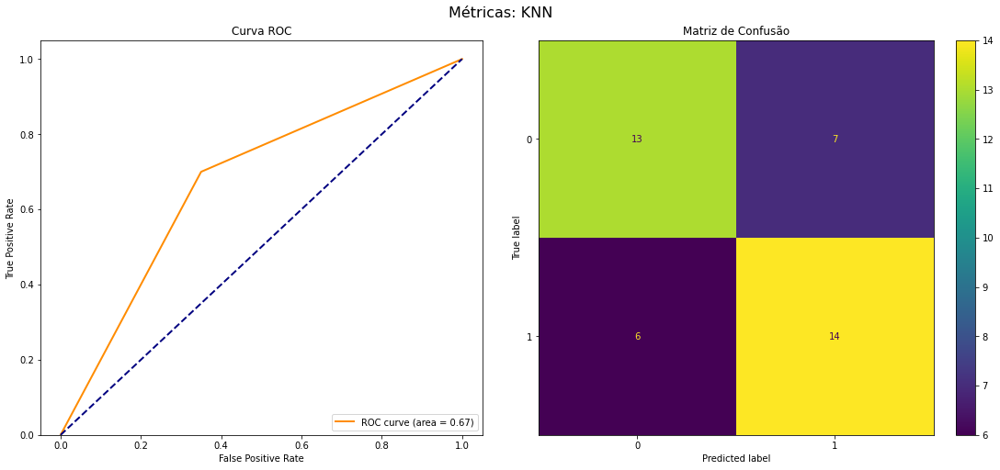

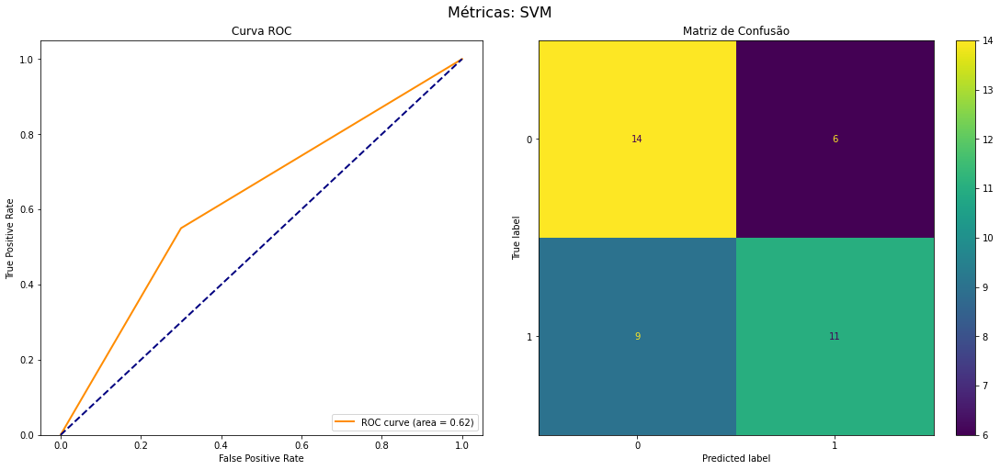

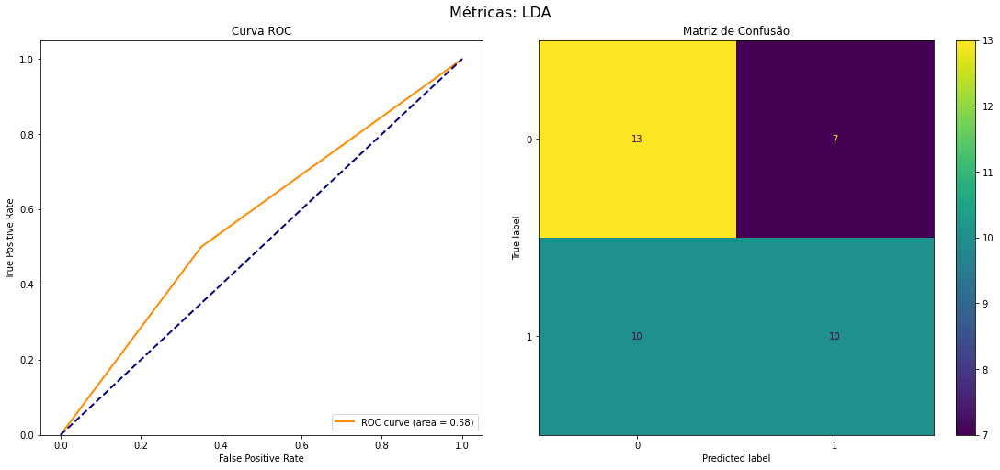

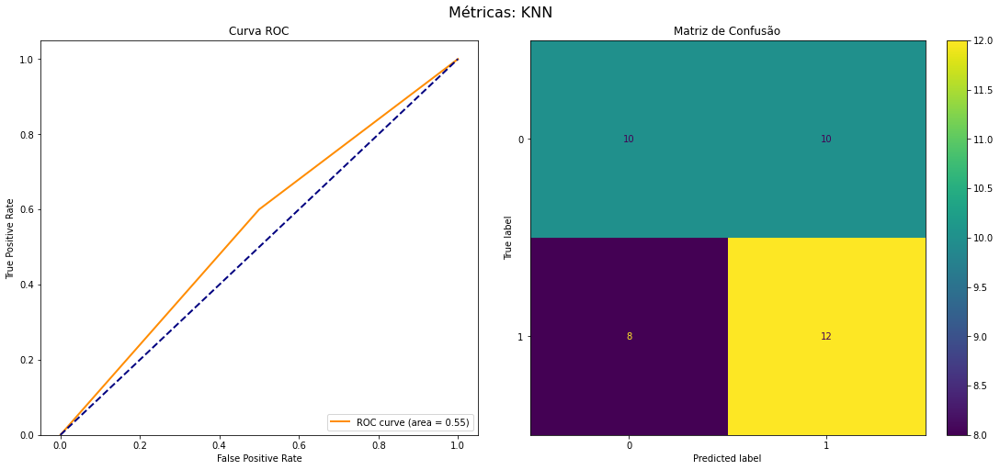

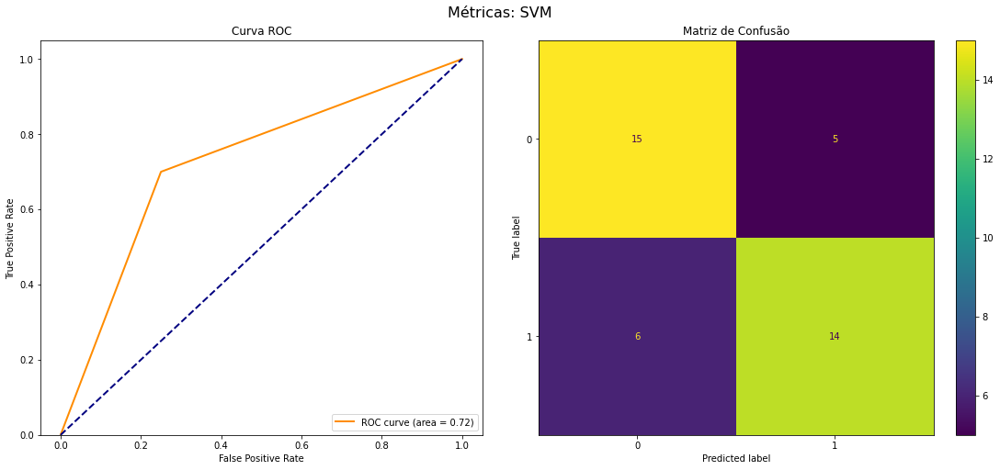

...

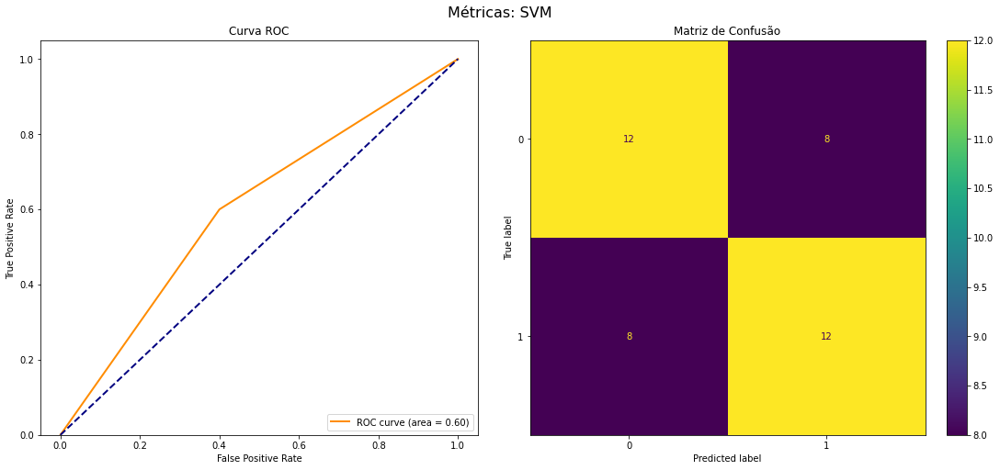

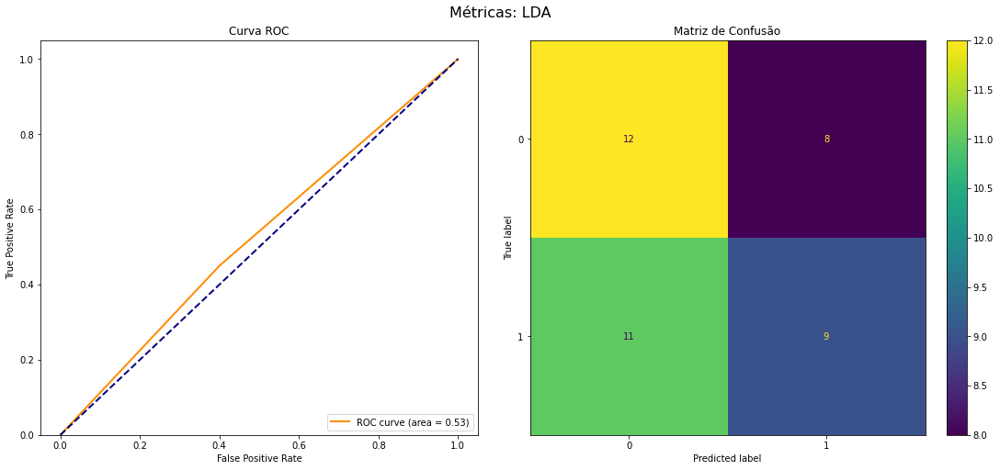

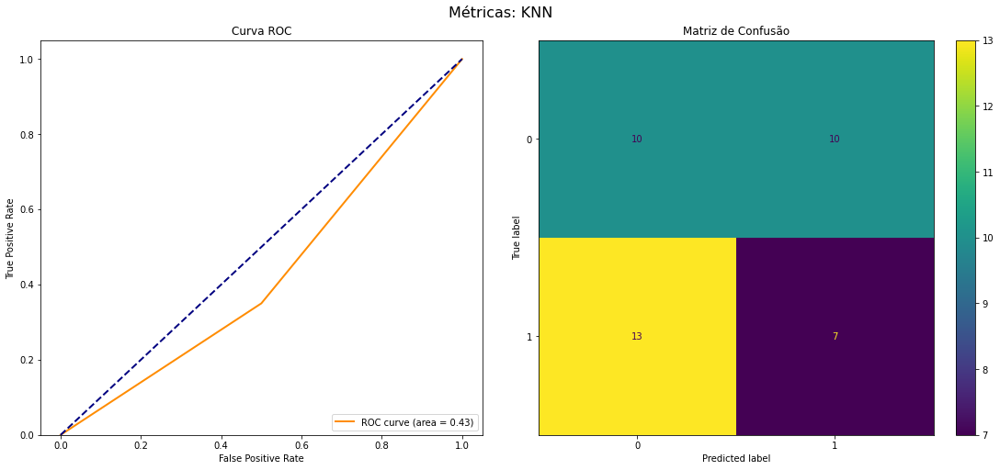

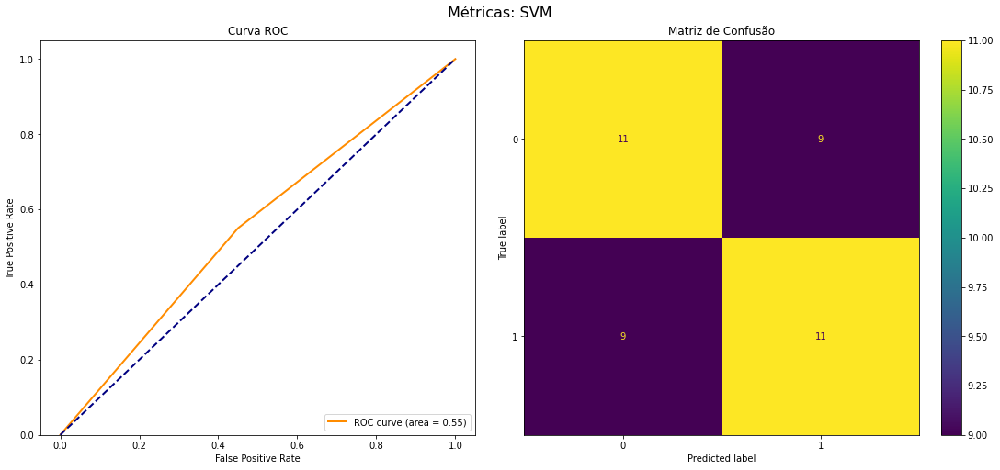

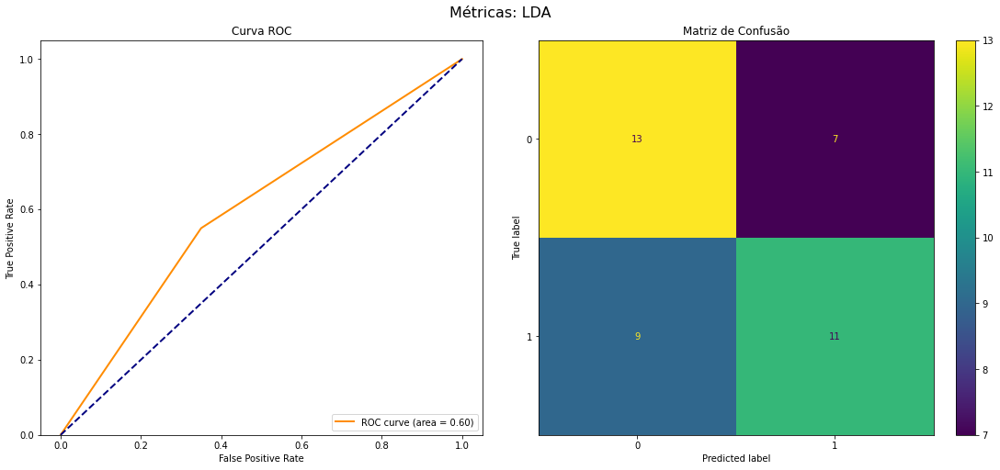

In [6]:

directory = 'C:/Users/Maods/Documents/TCC/data/BCICIV_1_mat/'
files = [ file.stem for file in Path(directory).glob('*.mat')]
for file in files:
    extension = file + '.mat'
    x_mat,y_mat = load_eeg_data_mat(directory, extension)
    run_pipeline(x_mat,y_mat, fs=100, dataset_name="BCICIV_I", subject_id=file, results=models_resut, multiclass=False)



## Dataset B

### Training all subjects' data at once

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\mne\io\edf\edf.py:1123: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  etmode = np.fromstring(etmode, UINT8).tolist()[0]
C:\Users\Maods\.pyenv\pyenv-win\versions\3.9.12\lib\contextlib.py:126: RuntimeWarning: Channel names are not unique, found duplicates for: {'EEG'}. Applying running numbers for duplicates.
  next(self.gen)
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\mne\io\edf\edf.py:1123: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  etmode = np.fromstring(etmode, UINT8).tolist()[0]
C:\Users\Maods\.pyenv\pyenv-win\versions\3.9.12\lib\contextlib.py:126: RuntimeWarning: Channel names are not unique, found duplicates for: {'EEG'}. Applying running numbers for duplicates.
  next(self.gen)
c:\Users\Maods\Doc


Training KNN model...
Data Shape: (1584, 4422)...
----------------------------------------------------------------------------------------------------
PIPELINE: 
MODEL: KNN
Runtime: 0:00:00.253155
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.36      0.41      0.38        86
           1       0.38      0.45      0.41        87
           2       0.37      0.24      0.29        72
           3       0.32      0.32      0.32        72

    accuracy                           0.36       317
   macro avg       0.36      0.35      0.35       317
weighted avg       0.36      0.36      0.35       317
 

Train Data:

Cross validation score ACC: 0.335 

Test Data:

Accuracy: 0.35962145110410093 

Precision: 0.3593227593754348 

Recall: 0.35962145110410093 

F1 Score: 0.3549481583904598 

Area Under Curve: 0.4727136431784108 

Cohen_kappa: 0.13925523661753303 

Matthews Coef: 0.1402546148794676 


Training SVM mo

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

----------------------------------------------------------------------------------------------------
PIPELINE: 
MODEL: LDA
Runtime: 0:00:24.435637
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.39      0.31      0.35        86
           1       0.30      0.34      0.32        87
           2       0.28      0.26      0.27        72
           3       0.29      0.32      0.30        72

    accuracy                           0.31       317
   macro avg       0.31      0.31      0.31       317
weighted avg       0.32      0.31      0.31       317
 

Train Data:

Cross validation score ACC: 0.365 

Test Data:

Accuracy: 0.31230283911671924 

Precision: 0.31647689970991283 

Recall: 0.31230283911671924 

F1 Score: 0.31284472256103807 

Area Under Curve: 0.5153173413293354 

Cohen_kappa: 0.08103723404255325 

Matthews Coef: 0.0812850109206538 


Training XGB model...
Data Shape: (1584, 4422)...
--------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: STD_Scaler
MODEL: LDA
Runtime: 0:00:26.028769
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.38      0.40      0.39        86
           1       0.41      0.36      0.38        87
           2       0.32      0.32      0.32        72
           3       0.38      0.42      0.39        72

    accuracy                           0.37       317
   macro avg       0.37      0.37      0.37       317
weighted avg       0.37      0.37      0.37       317
 

Train Data:

Cross validation score ACC: 0.36 

Test Data:

Accuracy: 0.3722397476340694 

Precision: 0.3738134513915425 

Recall: 0.3722397476340694 

F1 Score: 0.37216363121565593 

Area Under Curve: 0.4846826586706647 

Cohen_kappa: 0.16217759715249558 

Matthews Coef: 0.16241272738383258 


Training XGB model...
Data Shape: (1584, 4422)...
-------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet
MODEL: LDA
Runtime: 0:00:06.951143
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.37      0.29      0.32        86
           1       0.34      0.30      0.32        87
           2       0.29      0.33      0.31        72
           3       0.24      0.29      0.26        72

    accuracy                           0.30       317
   macro avg       0.31      0.30      0.30       317
weighted avg       0.31      0.30      0.30       317
 

Train Data:

Cross validation score ACC: 0.302 

Test Data:

Accuracy: 0.3028391167192429 

Precision: 0.31211671157707493 

Recall: 0.3028391167192429 

F1 Score: 0.3047732933708836 

Area Under Curve: 0.5368565717141429 

Cohen_kappa: 0.07298903047384653 

Matthews Coef: 0.07341550079145089 


Training XGB model...
Data Shape: (1584, 1188)...
---------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 201, using nperseg = 201
  warnings.warn('nperseg = {0:d} is greater than input length '



Training KNN model...
Data Shape: (1584, 2222)...
----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: KNN
Runtime: 0:00:00.143551
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.29      0.35      0.31        86
           1       0.31      0.39      0.34        87
           2       0.18      0.15      0.17        72
           3       0.33      0.18      0.23        72

    accuracy                           0.28       317
   macro avg       0.27      0.27      0.26       317
weighted avg       0.28      0.28      0.27       317
 

Train Data:

Cross validation score ACC: 0.284 

Test Data:

Accuracy: 0.277602523659306 

Precision: 0.27635231475537625 

Recall: 0.277602523659306 

F1 Score: 0.269774620932008 

Area Under Curve: 0.5117691154422789 

Cohen_kappa: 0.025989534415671534 

Matthews Coef: 0.026364469959563232 


T

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: LDA
Runtime: 0:00:12.312621
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.21      0.22      0.22        86
           1       0.29      0.29      0.29        87
           2       0.22      0.22      0.22        72
           3       0.26      0.25      0.26        72

    accuracy                           0.25       317
   macro avg       0.25      0.25      0.25       317
weighted avg       0.25      0.25      0.25       317
 

Train Data:

Cross validation score ACC: 0.282 

Test Data:

Accuracy: 0.24605678233438485 

Precision: 0.24677874424487803 

Recall: 0.24605678233438485 

F1 Score: 0.2463585779561713 

Area Under Curve: 0.4935032483758121 

Cohen_kappa: -0.008626772282499973 

Matthews Coef: -0.00862826778921653 


Training XGB model...
Data Shape: (1584, 2222)

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 54, using nperseg = 54
  warnings.warn('nperseg = {0:d} is greater than input length '



Training KNN model...
Data Shape: (1584, 176)...
----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: KNN
Runtime: 0:00:00.025926
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.28      0.38      0.32        86
           1       0.30      0.36      0.33        87
           2       0.25      0.14      0.18        72
           3       0.21      0.17      0.19        72

    accuracy                           0.27       317
   macro avg       0.26      0.26      0.25       317
weighted avg       0.26      0.27      0.26       317
 

Train Data:

Cross validation score ACC: 0.29 

Test Data:

Accuracy: 0.27129337539432175 

Precision: 0.2640961747475015 

Recall: 0.27129337539432175 

F1 Score: 0.2605193384065432 

Area Under Curve: 0.5216391804097951 

Cohen_kappa: 0.016678080812149942 

Matthews Coef: 0.01697

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: LDA
Runtime: 0:00:00.479814
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.40      0.47      0.43        86
           1       0.35      0.47      0.40        87
           2       0.22      0.15      0.18        72
           3       0.21      0.15      0.18        72

    accuracy                           0.32       317
   macro avg       0.30      0.31      0.30       317
weighted avg       0.30      0.32      0.31       317
 

Train Data:

Cross validation score ACC: 0.344 

Test Data:

Accuracy: 0.3249211356466877 

Precision: 0.3047449094006696 

Recall: 0.3249211356466877 

F1 Score: 0.30944780890522217 

Area Under Curve: 0.5486006996501749 

Cohen_kappa: 0.08989924737385802 

Matthews Coef: 0.09108045687322494 


Training XGB model...
Data Shape: (

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 201, using nperseg = 201
  warnings.warn('nperseg = {0:d} is greater than input length '



Processing step Time Domain Features...
Data Shape: (1584, 22, 101)...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 101, using nperseg = 101
  warnings.warn('nperseg = {0:d} is greater than input length '



Processing step STD_Scaler...
Data Shape: (1584, 176)...

Training KNN model...
Data Shape: (1584, 176)...
----------------------------------------------------------------------------------------------------
PIPELINE: PSD -> Time Domain Features -> STD_Scaler
MODEL: KNN
Runtime: 0:00:00.021679
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.31      0.49      0.38        86
           1       0.33      0.37      0.35        87
           2       0.28      0.21      0.24        72
           3       0.23      0.10      0.14        72

    accuracy                           0.30       317
   macro avg       0.29      0.29      0.28       317
weighted avg       0.29      0.30      0.28       317
 

Train Data:

Cross validation score ACC: 0.304 

Test Data:

Accuracy: 0.3028391167192429 

Precision: 0.28902666139442323 

Recall: 0.3028391167192429 

F1 Score: 0.28347926133598855 

Area Under Curve: 0.52536231

c:\Users\Maods\Documents\Repos\EEG-Analysis-\src\utils\mlpipelinebuilder.py:107: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1, 2, constrained_layout=True, figsize=(15,7))


----------------------------------------------------------------------------------------------------
PIPELINE: PSD -> Time Domain Features -> STD_Scaler
MODEL: SVM
Runtime: 0:00:00.286749
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.35      0.42      0.38        86
           1       0.35      0.45      0.39        87
           2       0.25      0.21      0.23        72
           3       0.33      0.19      0.25        72

    accuracy                           0.33       317
   macro avg       0.32      0.32      0.31       317
weighted avg       0.32      0.33      0.32       317
 

Train Data:

Cross validation score ACC: 0.339 

Test Data:

Accuracy: 0.3280757097791798 

Precision: 0.322879795849613 

Recall: 0.3280757097791798 

F1 Score: 0.3183288774902831 

Area Under Curve: 0.5161169415292354 

Cohen_kappa: 0.0942006627047477 

Matthews Coef: 0.0954766583870854 


Training LDA model...
Data Sh

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: PSD -> Time Domain Features -> STD_Scaler
MODEL: LDA
Runtime: 0:00:00.405103
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.34      0.38      0.36        86
           1       0.33      0.46      0.39        87
           2       0.24      0.19      0.22        72
           3       0.33      0.19      0.24        72

    accuracy                           0.32       317
   macro avg       0.31      0.31      0.30       317
weighted avg       0.31      0.32      0.31       317
 

Train Data:

Cross validation score ACC: 0.353 

Test Data:

Accuracy: 0.3186119873817035 

Precision: 0.31351315712916045 

Recall: 0.3186119873817035 

F1 Score: 0.3086691756558716 

Area Under Curve: 0.5340829585207396 

Cohen_kappa: 0.08117175024489742 

Matthews Coef: 0.08242583468470424 


Training XGB model...
Dat

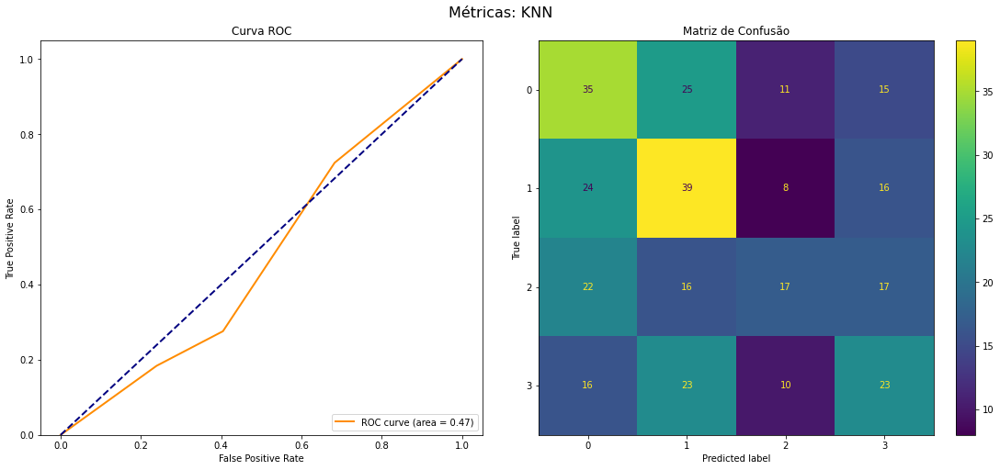

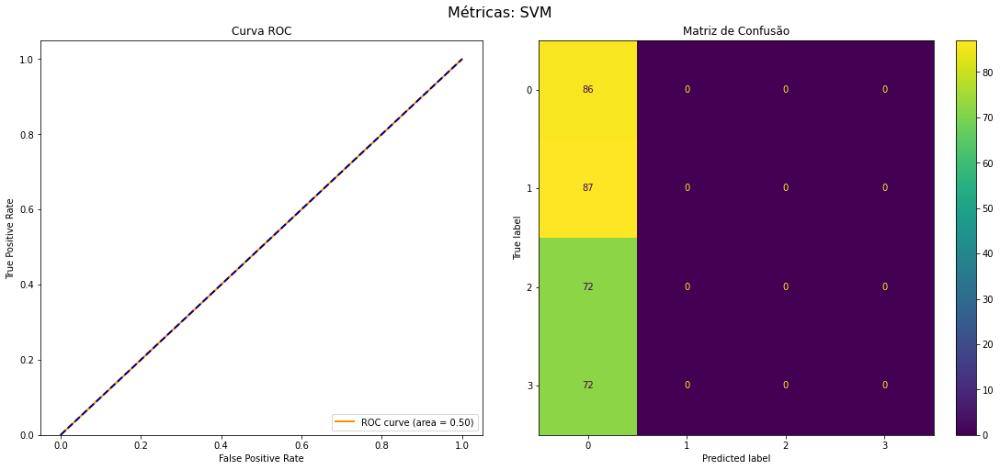

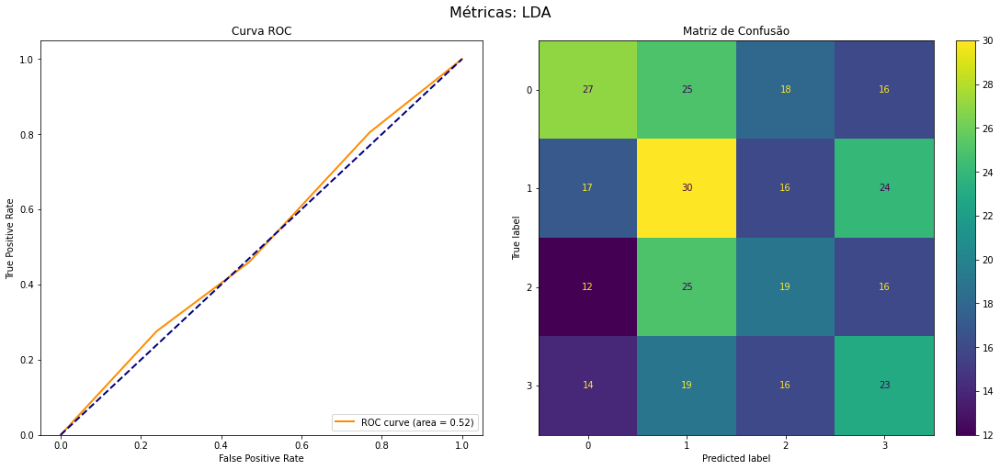

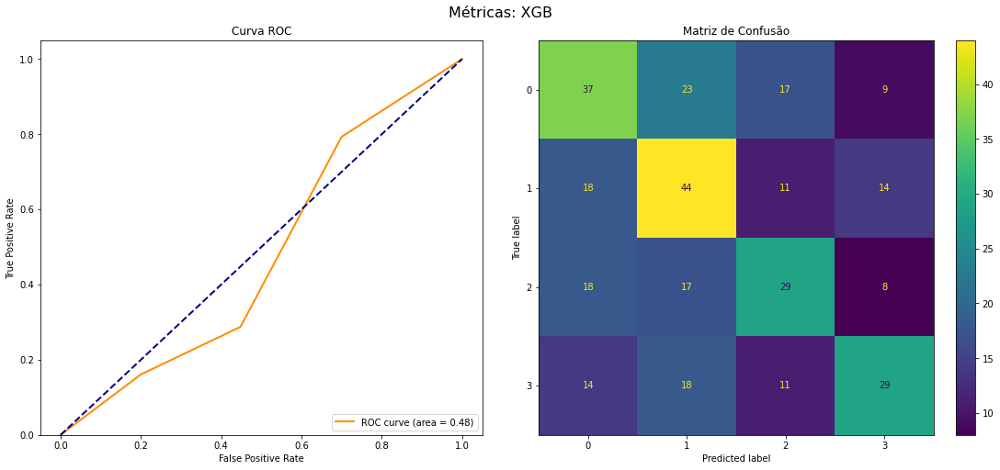

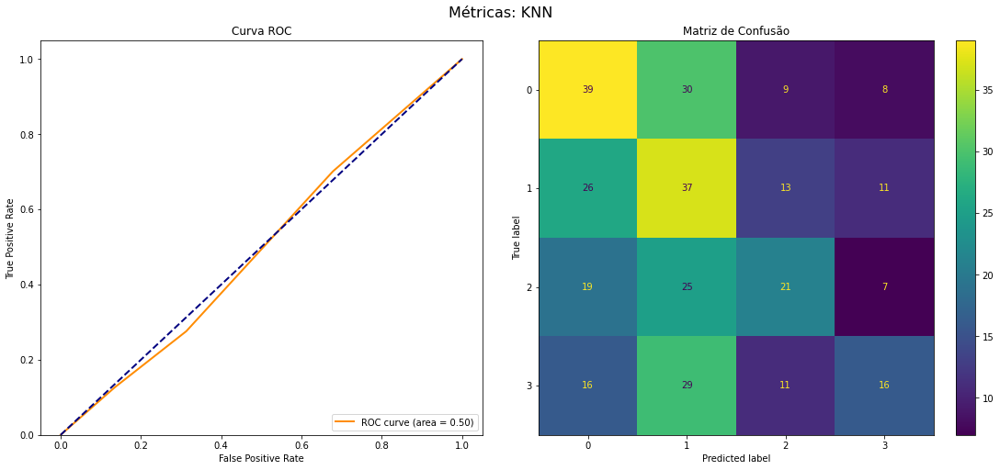

...

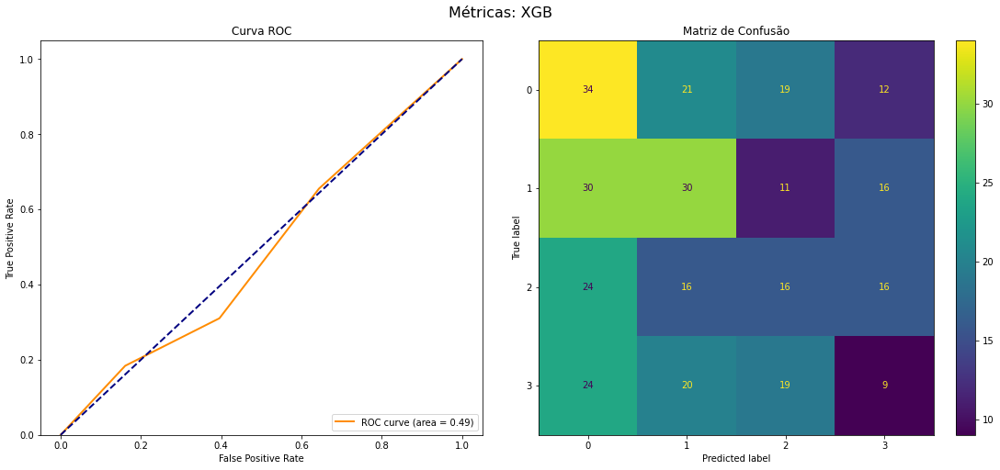

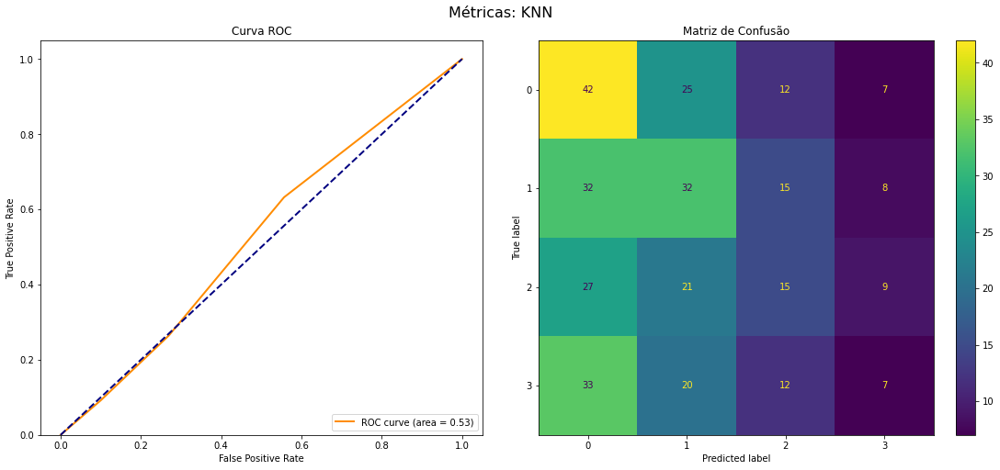

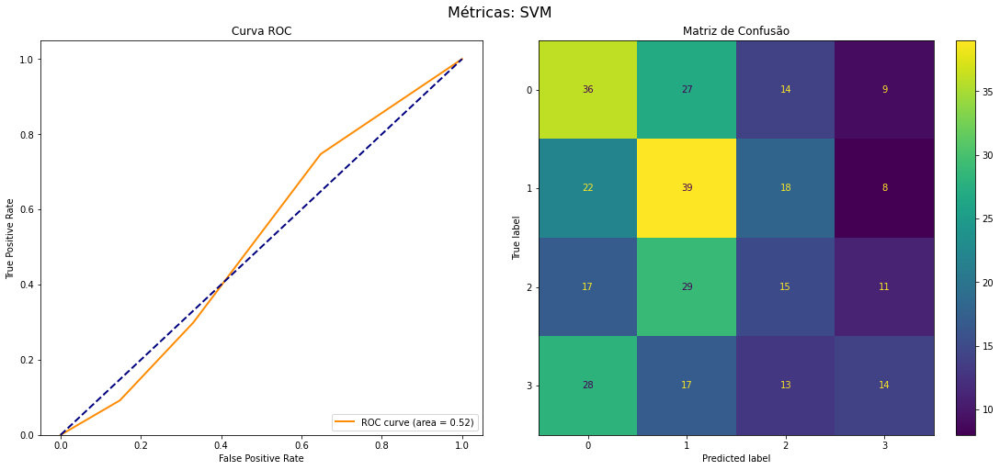

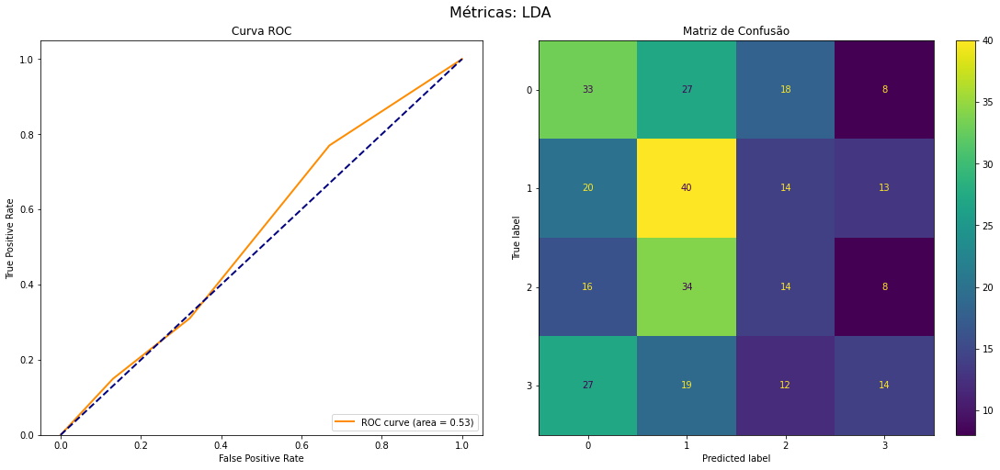

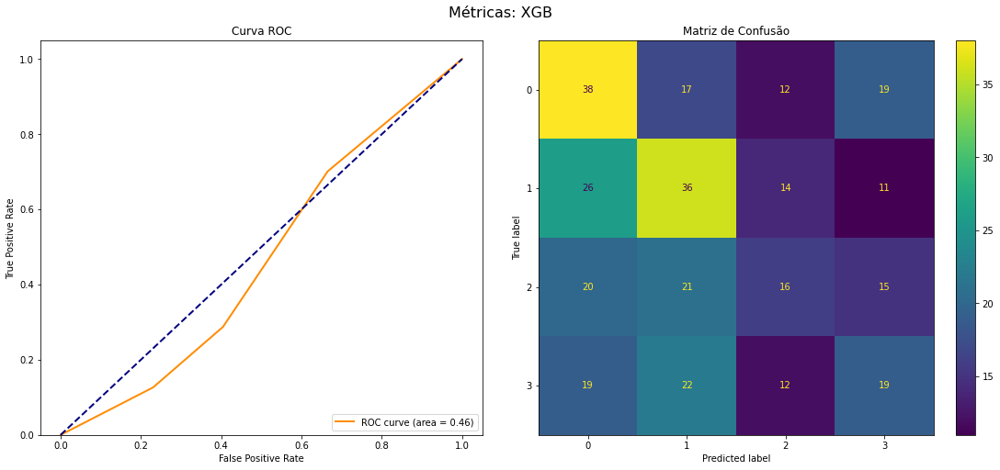

In [29]:
directory = 'C:/Users/Maods/Documents/TCC/data/BCICIV_2a_gdf-dataset/' 
extension = '*T.gdf'


x_train_BCICIV, y_train_BCICIV = load_eeg_data_gdf(directory, extension)

run_pipeline(x_train_BCICIV, y_train_BCICIV, fs=250, dataset_name="BCICIV_II", subject_id="all", results=models_resut, multiclass=True)

### Training the subjects' data separately

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\mne\io\edf\edf.py:1123: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  etmode = np.fromstring(etmode, UINT8).tolist()[0]
C:\Users\Maods\.pyenv\pyenv-win\versions\3.9.12\lib\contextlib.py:126: RuntimeWarning: Channel names are not unique, found duplicates for: {'EEG'}. Applying running numbers for duplicates.
  next(self.gen)



Training KNN model...
Data Shape: (288, 4422)...
----------------------------------------------------------------------------------------------------
PIPELINE: 
MODEL: KNN
Runtime: 0:00:00.050039
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.19      0.36      0.24        14
           1       0.36      0.33      0.34        15
           2       0.47      0.50      0.48        14
           3       0.00      0.00      0.00        15

    accuracy                           0.29        58
   macro avg       0.25      0.30      0.27        58
weighted avg       0.25      0.29      0.26        58
 

Train Data:

Cross validation score ACC: 0.326 

Test Data:

Accuracy: 0.29310344827586204 

Precision: 0.24970808246670317 

Recall: 0.29310344827586204 

F1 Score: 0.2645804936051739 

Area Under Curve: 0.365891472868217 

Cohen_kappa: 0.0623028391167193 

Matthews Coef: 0.06692500448962067 


Training SVM mod

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

Train Data:

Cross validation score ACC: 0.409 

Test Data:

Accuracy: 0.25862068965517243 

Precision: 0.11203643461288225 

Recall: 0.25862068965517243 

F1 Score: 0.12628328412384537 

Area Under Curve: 0.4232558139534884 

Cohen_kappa: 0.022727272727272707 

Matthews Coef: 0.0501669291630431 


Training LDA model...
Data Shape: (288, 4422)...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: 
MODEL: LDA
Runtime: 0:00:08.626411
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.38      0.36      0.37        14
           1       0.53      0.53      0.53        15
           2       0.44      0.57      0.50        14
           3       0.25      0.20      0.22        15

    accuracy                           0.41        58
   macro avg       0.40      0.42      0.41        58
weighted avg       0.40      0.41      0.41        58
 

Train Data:

Cross validation score ACC: 0.452 

Test Data:

Accuracy: 0.41379310344827586 

Precision: 0.40270409666961393 

Recall: 0.41379310344827586 

F1 Score: 0.4054916985951469 

Area Under Curve: 0.5038759689922481 

Cohen_kappa: 0.2190099009900992 

Matthews Coef: 0.22014505648309038 


Processing step STD_Scaler...
Data Shape: (288, 22, 201)...

Trai

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: STD_Scaler
MODEL: LDA
Runtime: 0:00:08.644713
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.25      0.21      0.23        14
           1       0.38      0.33      0.36        15
           2       0.33      0.36      0.34        14
           3       0.22      0.27      0.24        15

    accuracy                           0.29        58
   macro avg       0.30      0.29      0.29        58
weighted avg       0.30      0.29      0.29        58
 

Train Data:

Cross validation score ACC: 0.43 

Test Data:

Accuracy: 0.29310344827586204 

Precision: 0.2977453580901857 

Recall: 0.29310344827586204 

F1 Score: 0.29399761950297026 

Area Under Curve: 0.5441860465116278 

Cohen_kappa: 0.05672352241174117 

Matthews Coef: 0.056927202671034224 


Processing step Wavelet...
Data Shape: (288, 22, 201).

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet
MODEL: LDA
Runtime: 0:00:01.210997
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.36      0.36      0.36        14
           1       0.59      0.67      0.62        15
           2       0.42      0.36      0.38        14
           3       0.27      0.27      0.27        15

    accuracy                           0.41        58
   macro avg       0.41      0.41      0.41        58
weighted avg       0.41      0.41      0.41        58
 

Train Data:

Cross validation score ACC: 0.457 

Test Data:

Accuracy: 0.41379310344827586 

Precision: 0.40787694388100065 

Recall: 0.41379310344827586 

F1 Score: 0.40964854111405835 

Area Under Curve: 0.5449612403100775 

Cohen_kappa: 0.21746031746031746 

Matthews Coef: 0.21780666066671964 


Processing step bandpass...
Data Shape: (288, 22, 201)..

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 201, using nperseg = 201
  warnings.warn('nperseg = {0:d} is greater than input length '


----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: SVM
Runtime: 0:00:00.086843
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.30      0.21      0.25        14
           1       0.00      0.00      0.00        15
           2       0.25      0.86      0.39        14
           3       0.00      0.00      0.00        15

    accuracy                           0.26        58
   macro avg       0.14      0.27      0.16        58
weighted avg       0.13      0.26      0.15        58
 

Train Data:

Cross validation score ACC: 0.257 

Test Data:

Accuracy: 0.25862068965517243 

Precision: 0.1327586206896552 

Recall: 0.25862068965517243 

F1 Score: 0.15378197997775303 

Area Under Curve: 0.43643410852713177 

Cohen_kappa: 0.022727272727272707 

Matthews Coef: 0.03727518743349904 


Training LDA model...
Data Shape: (288, 2222)..

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: LDA
Runtime: 0:00:02.449763
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.22      0.14      0.17        14
           1       0.38      0.53      0.44        15
           2       0.20      0.21      0.21        14
           3       0.54      0.47      0.50        15

    accuracy                           0.34        58
   macro avg       0.34      0.34      0.33        58
weighted avg       0.34      0.34      0.34        58
 

Train Data:

Cross validation score ACC: 0.343 

Test Data:

Accuracy: 0.3448275862068966 

Precision: 0.33969517072965344 

Recall: 0.3448275862068966 

F1 Score: 0.33617243102586636 

Area Under Curve: 0.36434108527131787 

Cohen_kappa: 0.12470214455917383 

Matthews Coef: 0.1263721575386419 


Processing step Wavelet...
Data Shape: (288, 22, 2

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 54, using nperseg = 54
  warnings.warn('nperseg = {0:d} is greater than input length '



Training SVM model...
Data Shape: (288, 176)...
----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: SVM
Runtime: 0:00:00.022906
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.18      0.29      0.22        14
           1       0.31      0.27      0.29        15
           2       0.38      0.21      0.27        14
           3       0.20      0.20      0.20        15

    accuracy                           0.24        58
   macro avg       0.27      0.24      0.25        58
weighted avg       0.27      0.24      0.25        58
 

Train Data:

Cross validation score ACC: 0.287 

Test Data:

Accuracy: 0.2413793103448276 

Precision: 0.2657041234627442 

Recall: 0.2413793103448276 

F1 Score: 0.24508633129322785 

Area Under Curve: 0.4782945736434108 

Cohen_kappa: -0.011093502377178988 

Matthews Coef: -0.0113

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: LDA
Runtime: 0:00:00.219799
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.15      0.21      0.18        14
           1       0.36      0.33      0.34        15
           2       0.40      0.29      0.33        14
           3       0.43      0.40      0.41        15

    accuracy                           0.31        58
   macro avg       0.33      0.31      0.32        58
weighted avg       0.34      0.31      0.32        58
 

Train Data:

Cross validation score ACC: 0.296 

Test Data:

Accuracy: 0.3103448275862069 

Precision: 0.3359605911330049 

Recall: 0.3103448275862069 

F1 Score: 0.31925112494462704 

Area Under Curve: 0.4891472868217054 

Cohen_kappa: 0.08082408874801905 

Matthews Coef: 0.08170213267636439 


Processing step PSD...
Data Shape: 

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: PSD -> Time Domain Features -> STD_Scaler
MODEL: LDA
Runtime: 0:00:00.213612
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.24      0.36      0.29        14
           1       0.23      0.20      0.21        15
           2       0.31      0.29      0.30        14
           3       0.55      0.40      0.46        15

    accuracy                           0.31        58
   macro avg       0.33      0.31      0.31        58
weighted avg       0.33      0.31      0.32        58
 

Train Data:

Cross validation score ACC: 0.391 

Test Data:

Accuracy: 0.3103448275862069 

Precision: 0.332489349730729 

Recall: 0.3103448275862069 

F1 Score: 0.31526742733639285 

Area Under Curve: 0.5767441860465117 

Cohen_kappa: 0.08227848101265833 

Matthews Coef: 0.08343925967369054 


Training KNN model...
Data

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

----------------------------------------------------------------------------------------------------
PIPELINE: 
MODEL: LDA
Runtime: 0:00:08.535668
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.20      0.21      0.21        14
           1       0.38      0.20      0.26        15
           2       0.41      0.64      0.50        14
           3       0.31      0.27      0.29        15

    accuracy                           0.33        58
   macro avg       0.32      0.33      0.31        58
weighted avg       0.32      0.33      0.31        58
 

Train Data:

Cross validation score ACC: 0.491 

Test Data:

Accuracy: 0.3275862068965517 

Precision: 0.3235802990113335 

Recall: 0.3275862068965517 

F1 Score: 0.31198809462263943 

Area Under Curve: 0.44961240310077516 

Cohen_kappa: 0.10628210193599374 

Matthews Coef: 0.10884103663518839 


Processing step STD_Scaler...
Data Shape: (288, 22, 201)...

Trai

c:\Users\Maods\Documents\Repos\EEG-Analysis-\src\utils\mlpipelinebuilder.py:107: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1, 2, constrained_layout=True, figsize=(15,7))


----------------------------------------------------------------------------------------------------
PIPELINE: STD_Scaler
MODEL: SVM
Runtime: 0:00:00.155629
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.35      0.43      0.39        14
           1       0.38      0.33      0.36        15
           2       0.29      0.36      0.32        14
           3       0.45      0.33      0.38        15

    accuracy                           0.36        58
   macro avg       0.37      0.36      0.36        58
weighted avg       0.37      0.36      0.36        58
 

Train Data:

Cross validation score ACC: 0.513 

Test Data:

Accuracy: 0.3620689655172414 

Precision: 0.3732109675314544 

Recall: 0.3620689655172414 

F1 Score: 0.3631354740920925 

Area Under Curve: 0.5519379844961241 

Cohen_kappa: 0.15110759493670878 

Matthews Coef: 0.15225393693012362 


Training LDA model...
Data Shape: (288, 4422)...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: STD_Scaler
MODEL: LDA
Runtime: 0:00:08.642941
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.32      0.43      0.36        14
           1       0.40      0.27      0.32        15
           2       0.31      0.36      0.33        14
           3       0.38      0.33      0.36        15

    accuracy                           0.34        58
   macro avg       0.35      0.35      0.34        58
weighted avg       0.35      0.34      0.34        58
 

Train Data:

Cross validation score ACC: 0.487 

Test Data:

Accuracy: 0.3448275862068966 

Precision: 0.3545738517380985 

Recall: 0.3448275862068966 

F1 Score: 0.34335721749514847 

Area Under Curve: 0.5899224806201551 

Cohen_kappa: 0.1285092922103599 

Matthews Coef: 0.13000503389237036 


Processing step Wavelet...
Data Shape: (288, 22, 201)...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet
MODEL: LDA
Runtime: 0:00:01.226854
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.42      0.57      0.48        14
           1       0.43      0.20      0.27        15
           2       0.41      0.64      0.50        14
           3       0.40      0.27      0.32        15

    accuracy                           0.41        58
   macro avg       0.41      0.42      0.39        58
weighted avg       0.41      0.41      0.39        58
 

Train Data:

Cross validation score ACC: 0.439 

Test Data:

Accuracy: 0.41379310344827586 

Precision: 0.4146651896198175 

Recall: 0.41379310344827586 

F1 Score: 0.39101358411703246 

Area Under Curve: 0.47984496124031006 

Cohen_kappa: 0.22209072978303745 

Matthews Coef: 0.2302828950954104 


Processing step bandpass...
Data Shape: (288, 22, 201)...

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 201, using nperseg = 201
  warnings.warn('nperseg = {0:d} is greater than input length '


----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: SVM
Runtime: 0:00:00.094025
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.25      1.00      0.41        14
           1       0.00      0.00      0.00        15
           2       0.33      0.07      0.12        14
           3       0.00      0.00      0.00        15

    accuracy                           0.26        58
   macro avg       0.15      0.27      0.13        58
weighted avg       0.14      0.26      0.13        58
 

Train Data:

Cross validation score ACC: 0.252 

Test Data:

Accuracy: 0.25862068965517243 

Precision: 0.141901776384535 

Recall: 0.25862068965517243 

F1 Score: 0.126348590410677 

Area Under Curve: 0.46511627906976744 

Cohen_kappa: 0.022727272727272707 

Matthews Coef: 0.06357677330489314 


Training LDA model...
Data Shape: (288, 2222)...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: LDA
Runtime: 0:00:02.463317
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.27      0.29      0.28        14
           1       0.25      0.33      0.29        15
           2       0.25      0.21      0.23        14
           3       0.18      0.13      0.15        15

    accuracy                           0.24        58
   macro avg       0.24      0.24      0.24        58
weighted avg       0.24      0.24      0.24        58
 

Train Data:

Cross validation score ACC: 0.261 

Test Data:

Accuracy: 0.2413793103448276 

Precision: 0.23638975966562173 

Recall: 0.2413793103448276 

F1 Score: 0.2359697377533287 

Area Under Curve: 0.4666666666666666 

Cohen_kappa: -0.012296707655692352 

Matthews Coef: -0.012410500747547782 


Processing step Wavelet...
Data Shape: (288, 22

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 54, using nperseg = 54
  warnings.warn('nperseg = {0:d} is greater than input length '



Training SVM model...
Data Shape: (288, 176)...
----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: SVM
Runtime: 0:00:00.021011
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.38      0.43      0.40        14
           1       0.14      0.13      0.14        15
           2       0.33      0.36      0.34        14
           3       0.38      0.33      0.36        15

    accuracy                           0.31        58
   macro avg       0.31      0.31      0.31        58
weighted avg       0.31      0.31      0.31        58
 

Train Data:

Cross validation score ACC: 0.243 

Test Data:

Accuracy: 0.3103448275862069 

Precision: 0.3073923203233548 

Recall: 0.3103448275862069 

F1 Score: 0.30782232036691015 

Area Under Curve: 0.5348837209302326 

Cohen_kappa: 0.08118811881188115 

Matthews Coef: 0.0813492

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: LDA
Runtime: 0:00:00.221761
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.50      0.50      0.50        14
           1       0.28      0.33      0.30        15
           2       0.33      0.36      0.34        14
           3       0.18      0.13      0.15        15

    accuracy                           0.33        58
   macro avg       0.32      0.33      0.33        58
weighted avg       0.32      0.33      0.32        58
 

Train Data:

Cross validation score ACC: 0.322 

Test Data:

Accuracy: 0.3275862068965517 

Precision: 0.3200104493207942 

Recall: 0.3275862068965517 

F1 Score: 0.3220816044835069 

Area Under Curve: 0.6263565891472869 

Cohen_kappa: 0.10344827586206895 

Matthews Coef: 0.10398525213582897 


Processing step PSD...
Data Shape: (

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: PSD -> Time Domain Features -> STD_Scaler
MODEL: LDA
Runtime: 0:00:00.202692
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.42      0.36      0.38        14
           1       0.31      0.33      0.32        15
           2       0.47      0.57      0.52        14
           3       0.15      0.13      0.14        15

    accuracy                           0.34        58
   macro avg       0.34      0.35      0.34        58
weighted avg       0.33      0.34      0.34        58
 

Train Data:

Cross validation score ACC: 0.33 

Test Data:

Accuracy: 0.3448275862068966 

Precision: 0.33477174026109113 

Recall: 0.3448275862068966 

F1 Score: 0.33779290787077215 

Area Under Curve: 0.45116279069767445 

Cohen_kappa: 0.12643678160919536 

Matthews Coef: 0.12689006171521489 



c:\Users\Maods\Documents\Repos\EEG-Analysis-\src\utils\dataloader.py:28: RuntimeWarning: No matching events found for 9 (event id 9)
  epochs = mne.Epochs(raw, events[0], event_id=[7,8,9,10],on_missing ='warn',tmin= -0.1, tmax=0.7, preload=True)
c:\Users\Maods\Documents\Repos\EEG-Analysis-\src\utils\dataloader.py:28: RuntimeWarning: No matching events found for 10 (event id 10)
  epochs = mne.Epochs(raw, events[0], event_id=[7,8,9,10],on_missing ='warn',tmin= -0.1, tmax=0.7, preload=True)
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-sco


Training KNN model...
Data Shape: (144, 4422)...
----------------------------------------------------------------------------------------------------
PIPELINE: 
MODEL: KNN
Runtime: 0:00:00.048376
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.56      0.71      0.63        14
           1       0.64      0.47      0.54        15

    accuracy                           0.59        29
   macro avg       0.60      0.59      0.58        29
weighted avg       0.60      0.59      0.58        29
 

Train Data:

Cross validation score ACC: 0.635 

Test Data:

Accuracy: 0.5862068965517241 

Precision: 0.5973528387321492 

Recall: 0.5862068965517241 

F1 Score: 0.5802387267904511 

Area Under Curve: 0.5904761904761905 

Cohen_kappa: 0.17924528301886788 

Matthews Coef: 0.1863551306732249 


Training SVM model...
Data Shape: (144, 4422)...
-----------------------------------------------------------------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: 
MODEL: LDA
Runtime: 0:00:05.771551
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.71      0.86      0.77        14
           1       0.83      0.67      0.74        15

    accuracy                           0.76        29
   macro avg       0.77      0.76      0.76        29
weighted avg       0.77      0.76      0.76        29
 

Train Data:

Cross validation score ACC: 0.626 

Test Data:

Accuracy: 0.7586206896551724 

Precision: 0.7718052738336714 

Recall: 0.7586206896551724 

F1 Score: 0.7568903720182919 

Area Under Curve: 0.7619047619047619 

Cohen_kappa: 0.520094562647754 

Matthews Coef: 0.531456782681411 


Processing step STD_Scaler...
Data Shape: (144, 22, 201)...

Training KNN model...
Data Shape: (144, 4422)...
---------------------------------------------------------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: STD_Scaler
MODEL: LDA
Runtime: 0:00:05.678576
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.68      0.93      0.79        14
           1       0.90      0.60      0.72        15

    accuracy                           0.76        29
   macro avg       0.79      0.76      0.75        29
weighted avg       0.80      0.76      0.75        29
 

Train Data:

Cross validation score ACC: 0.643 

Test Data:

Accuracy: 0.7586206896551724 

Precision: 0.795825771324864 

Recall: 0.7586206896551724 

F1 Score: 0.7527690700104492 

Area Under Curve: 0.7642857142857143 

Cohen_kappa: 0.5223529411764706 

Matthews Coef: 0.5556950534971523 


Processing step Wavelet...
Data Shape: (144, 22, 201)...

Training KNN model...
Data Shape: (144, 1188)...
-------------------------------------------------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet
MODEL: LDA
Runtime: 0:00:00.554126
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.63      0.86      0.73        14
           1       0.80      0.53      0.64        15

    accuracy                           0.69        29
   macro avg       0.72      0.70      0.68        29
weighted avg       0.72      0.69      0.68        29
 

Train Data:

Cross validation score ACC: 0.609 

Test Data:

Accuracy: 0.6896551724137931 

Precision: 0.7186932849364791 

Recall: 0.6896551724137931 

F1 Score: 0.6821316614420062 

Area Under Curve: 0.6952380952380952 

Cohen_kappa: 0.38588235294117645 

Matthews Coef: 0.4105134629438423 


Processing step bandpass...
Data Shape: (144, 22, 201)...

Processing step PSD...
Data Shape: (144, 22, 201)...

Training KNN model...
Data Shape: (144, 2222)...
-------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: LDA
Runtime: 0:00:01.428896
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.50      0.50      0.50        14
           1       0.53      0.53      0.53        15

    accuracy                           0.52        29
   macro avg       0.52      0.52      0.52        29
weighted avg       0.52      0.52      0.52        29
 

Train Data:

Cross validation score ACC: 0.47 

Test Data:

Accuracy: 0.5172413793103449 

Precision: 0.5172413793103449 

Recall: 0.5172413793103449 

F1 Score: 0.5172413793103449 

Area Under Curve: 0.5166666666666666 

Cohen_kappa: 0.033333333333333326 

Matthews Coef: 0.03333333333333333 


Processing step Wavelet...
Data Shape: (144, 22, 201)...

Processing step Time Domain Features...
Data Shape: (144, 22, 54)...

Training KNN model...
Data Shape

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn


Processing step STD_Scaler...
Data Shape: (144, 176)...

Training KNN model...
Data Shape: (144, 176)...
----------------------------------------------------------------------------------------------------
PIPELINE: PSD -> Time Domain Features -> STD_Scaler
MODEL: KNN
Runtime: 0:00:00.006956
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.47      0.50      0.48        14
           1       0.50      0.47      0.48        15

    accuracy                           0.48        29
   macro avg       0.48      0.48      0.48        29
weighted avg       0.48      0.48      0.48        29
 

Train Data:

Cross validation score ACC: 0.496 

Test Data:

Accuracy: 0.4827586206896552 

Precision: 0.4839080459770115 

Recall: 0.4827586206896552 

F1 Score: 0.4827586206896552 

Area Under Curve: 0.4833333333333334 

Cohen_kappa: -0.03325415676959609 

Matthews Coef: -0.03333333333333333 


Training SVM model...
Data

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: PSD -> Time Domain Features -> STD_Scaler
MODEL: LDA
Runtime: 0:00:00.128440
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.50      0.64      0.56        14
           1       0.55      0.40      0.46        15

    accuracy                           0.52        29
   macro avg       0.52      0.52      0.51        29
weighted avg       0.52      0.52      0.51        29
 

Train Data:

Cross validation score ACC: 0.496 

Test Data:

Accuracy: 0.5172413793103449 

Precision: 0.5235109717868338 

Recall: 0.5172413793103449 

F1 Score: 0.5102785145888594 

Area Under Curve: 0.5214285714285714 

Cohen_kappa: 0.04245283018867918 

Matthews Coef: 0.044136741475237475 


Training KNN model...
Data Shape: (288, 4422)...
------------------------------------------------------------------------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

----------------------------------------------------------------------------------------------------
PIPELINE: 
MODEL: LDA
Runtime: 0:00:08.551655
--------------------------------------------------


              precision    recall  f1-score   support

           0       1.00      0.57      0.73        14
           1       0.53      0.67      0.59        15
           2       0.41      0.50      0.45        14
           3       0.57      0.53      0.55        15

    accuracy                           0.57        58
   macro avg       0.63      0.57      0.58        58
weighted avg       0.62      0.57      0.58        58
 

Train Data:

Cross validation score ACC: 0.526 

Test Data:

Accuracy: 0.5689655172413793 

Precision: 0.6246701947566686 

Recall: 0.5689655172413793 

F1 Score: 0.579375694960512 

Area Under Curve: 0.42015503875968996 

Cohen_kappa: 0.42437475188566887 

Matthews Coef: 0.42970250443999986 


Processing step STD_Scaler...
Data Shape: (288, 22, 201)...

Traini

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: STD_Scaler
MODEL: LDA
Runtime: 0:00:08.605225
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.62      0.57      0.59        14
           1       0.46      0.40      0.43        15
           2       0.44      0.50      0.47        14
           3       0.50      0.53      0.52        15

    accuracy                           0.50        58
   macro avg       0.50      0.50      0.50        58
weighted avg       0.50      0.50      0.50        58
 

Train Data:

Cross validation score ACC: 0.483 

Test Data:

Accuracy: 0.5 

Precision: 0.5028183023872679 

Recall: 0.5 

F1 Score: 0.5000023541736557 

Area Under Curve: 0.49534883720930234 

Cohen_kappa: 0.33333333333333337 

Matthews Coef: 0.33399565573729856 


Processing step Wavelet...
Data Shape: (288, 22, 201)...

Training KNN model...
Data S

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet
MODEL: LDA
Runtime: 0:00:01.165579
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.88      0.50      0.64        14
           1       0.55      0.73      0.63        15
           2       0.47      0.50      0.48        14
           3       0.60      0.60      0.60        15

    accuracy                           0.59        58
   macro avg       0.62      0.58      0.59        58
weighted avg       0.62      0.59      0.59        58
 

Train Data:

Cross validation score ACC: 0.522 

Test Data:

Accuracy: 0.5862068965517241 

Precision: 0.621264367816092 

Recall: 0.5862068965517241 

F1 Score: 0.5878669487468536 

Area Under Curve: 0.4224806201550388 

Cohen_kappa: 0.4469606674612635 

Matthews Coef: 0.4525816476183367 


Processing step bandpass...
Data Shape: (288, 22, 201)...

Proc

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 201, using nperseg = 201
  warnings.warn('nperseg = {0:d} is greater than input length '


----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: SVM
Runtime: 0:00:00.084613
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.20      0.07      0.11        14
           1       0.00      0.00      0.00        15
           2       0.25      0.93      0.39        14
           3       0.00      0.00      0.00        15

    accuracy                           0.24        58
   macro avg       0.11      0.25      0.12        58
weighted avg       0.11      0.24      0.12        58
 

Train Data:

Cross validation score ACC: 0.23 

Test Data:

Accuracy: 0.2413793103448276 

Precision: 0.10748210800260248 

Recall: 0.2413793103448276 

F1 Score: 0.11907793157623858 

Area Under Curve: 0.4682170542635659 

Cohen_kappa: 0.0 

Matthews Coef: 0.0 


Training LDA model...
Data Shape: (288, 2222)...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: LDA
Runtime: 0:00:02.449636
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.33      0.43      0.38        14
           1       0.25      0.07      0.11        15
           2       0.33      0.50      0.40        14
           3       0.27      0.27      0.27        15

    accuracy                           0.31        58
   macro avg       0.30      0.32      0.29        58
weighted avg       0.29      0.31      0.28        58
 

Train Data:

Cross validation score ACC: 0.278 

Test Data:

Accuracy: 0.3103448275862069 

Precision: 0.29454022988505746 

Recall: 0.3103448275862069 

F1 Score: 0.28325771324863885 

Area Under Curve: 0.5 

Cohen_kappa: 0.0840900118436636 

Matthews Coef: 0.08734441932566896 


Processing step Wavelet...
Data Shape: (288, 22, 201)...

Processi

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 54, using nperseg = 54
  warnings.warn('nperseg = {0:d} is greater than input length '



Training SVM model...
Data Shape: (288, 176)...
----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: SVM
Runtime: 0:00:00.020394
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.37      0.50      0.42        14
           1       0.46      0.40      0.43        15
           2       0.57      0.29      0.38        14
           3       0.26      0.33      0.29        15

    accuracy                           0.38        58
   macro avg       0.42      0.38      0.38        58
weighted avg       0.41      0.38      0.38        58
 

Train Data:

Cross validation score ACC: 0.339 

Test Data:

Accuracy: 0.3793103448275862 

Precision: 0.4142817255339941 

Recall: 0.3793103448275862 

F1 Score: 0.3812597139169147 

Area Under Curve: 0.537984496124031 

Cohen_kappa: 0.17142857142857149 

Matthews Coef: 0.174720916

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: LDA
Runtime: 0:00:00.221662
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.50      0.79      0.61        14
           1       0.59      0.67      0.62        15
           2       0.29      0.14      0.19        14
           3       0.42      0.33      0.37        15

    accuracy                           0.48        58
   macro avg       0.45      0.48      0.45        58
weighted avg       0.45      0.48      0.45        58
 

Train Data:

Cross validation score ACC: 0.383 

Test Data:

Accuracy: 0.4827586206896552 

Precision: 0.44954361054766734 

Recall: 0.4827586206896552 

F1 Score: 0.4509099616858238 

Area Under Curve: 0.672093023255814 

Cohen_kappa: 0.31034482758620685 

Matthews Coef: 0.3183938214909289 


Processing step PSD...
Data Shape: (2

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: PSD -> Time Domain Features -> STD_Scaler
MODEL: LDA
Runtime: 0:00:00.201450
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.62      0.71      0.67        14
           1       0.50      0.33      0.40        15
           2       0.37      0.50      0.42        14
           3       0.54      0.47      0.50        15

    accuracy                           0.50        58
   macro avg       0.51      0.50      0.50        58
weighted avg       0.51      0.50      0.50        58
 

Train Data:

Cross validation score ACC: 0.391 

Test Data:

Accuracy: 0.5 

Precision: 0.5083589278235376 

Recall: 0.5 

F1 Score: 0.4960815047021943 

Area Under Curve: 0.5457364341085271 

Cohen_kappa: 0.33491498616053783 

Matthews Coef: 0.33881311909796213 


Training KNN model...
Data Shape: (288, 4422)...
-------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

----------------------------------------------------------------------------------------------------
PIPELINE: 
MODEL: LDA
Runtime: 0:00:08.455945
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.38      0.36      0.37        14
           1       0.64      0.47      0.54        15
           2       0.48      0.79      0.59        14
           3       0.45      0.33      0.38        15

    accuracy                           0.48        58
   macro avg       0.49      0.49      0.47        58
weighted avg       0.49      0.48      0.47        58
 

Train Data:

Cross validation score ACC: 0.383 

Test Data:

Accuracy: 0.4827586206896552 

Precision: 0.49041213658904814 

Recall: 0.4827586206896552 

F1 Score: 0.47164936820109227 

Area Under Curve: 0.4031007751937985 

Cohen_kappa: 0.31225296442687744 

Matthews Coef: 0.3195127862524046 


Processing step STD_Scaler...
Data Shape: (288, 22, 201)...

Train

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: STD_Scaler
MODEL: LDA
Runtime: 0:00:08.558318
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.54      0.50      0.52        14
           1       0.58      0.47      0.52        15
           2       0.54      0.93      0.68        14
           3       0.44      0.27      0.33        15

    accuracy                           0.53        58
   macro avg       0.53      0.54      0.51        58
weighted avg       0.53      0.53      0.51        58
 

Train Data:

Cross validation score ACC: 0.404 

Test Data:

Accuracy: 0.5344827586206896 

Precision: 0.5265251989389921 

Recall: 0.5344827586206896 

F1 Score: 0.5106204207837601 

Area Under Curve: 0.49457364341085275 

Cohen_kappa: 0.3812722244172264 

Matthews Coef: 0.39272875353178865 


Processing step Wavelet...
Data Shape: (288, 22, 201)...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet
MODEL: LDA
Runtime: 0:00:01.168311
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.54      0.50      0.52        14
           1       0.46      0.40      0.43        15
           2       0.50      0.79      0.61        14
           3       0.50      0.33      0.40        15

    accuracy                           0.50        58
   macro avg       0.50      0.50      0.49        58
weighted avg       0.50      0.50      0.49        58
 

Train Data:

Cross validation score ACC: 0.413 

Test Data:

Accuracy: 0.5 

Precision: 0.49933687002652516 

Recall: 0.5 

F1 Score: 0.48695493523079736 

Area Under Curve: 0.4782945736434109 

Cohen_kappa: 0.3349149861605377 

Matthews Coef: 0.3413013761666181 


Processing step bandpass...
Data Shape: (288, 22, 201)...

Processing step PSD...
Data Sha

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 201, using nperseg = 201
  warnings.warn('nperseg = {0:d} is greater than input length '



Training KNN model...
Data Shape: (288, 2222)...
----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: KNN
Runtime: 0:00:00.031918
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.37      0.50      0.42        14
           1       0.17      0.13      0.15        15
           2       0.47      0.50      0.48        14
           3       0.42      0.33      0.37        15

    accuracy                           0.36        58
   macro avg       0.35      0.37      0.36        58
weighted avg       0.35      0.36      0.35        58
 

Train Data:

Cross validation score ACC: 0.226 

Test Data:

Accuracy: 0.3620689655172414 

Precision: 0.35243496672716274 

Recall: 0.3620689655172414 

F1 Score: 0.3530309035659809 

Area Under Curve: 0.537984496124031 

Cohen_kappa: 0.15110759493670867 

Matthews Coef: 0.15243726503618382 


Tr

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: LDA
Runtime: 0:00:02.459795
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.08      0.07      0.07        14
           1       0.42      0.33      0.37        15
           2       0.37      0.50      0.42        14
           3       0.57      0.53      0.55        15

    accuracy                           0.36        58
   macro avg       0.36      0.36      0.36        58
weighted avg       0.36      0.36      0.36        58
 

Train Data:

Cross validation score ACC: 0.226 

Test Data:

Accuracy: 0.3620689655172414 

Precision: 0.3630387307792026 

Recall: 0.3620689655172414 

F1 Score: 0.3587560103612422 

Area Under Curve: 0.29844961240310075 

Cohen_kappa: 0.15043547110055422 

Matthews Coef: 0.15151751219572163 


Processing step Wavelet...
Data Shape: (288, 22, 20

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 54, using nperseg = 54
  warnings.warn('nperseg = {0:d} is greater than input length '



Training SVM model...
Data Shape: (288, 176)...
----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: SVM
Runtime: 0:00:00.023586
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.24      0.29      0.26        14
           1       0.25      0.27      0.26        15
           2       0.33      0.29      0.31        14
           3       0.23      0.20      0.21        15

    accuracy                           0.26        58
   macro avg       0.26      0.26      0.26        58
weighted avg       0.26      0.26      0.26        58
 

Train Data:

Cross validation score ACC: 0.287 

Test Data:

Accuracy: 0.25862068965517243 

Precision: 0.26159177198730954 

Recall: 0.25862068965517243 

F1 Score: 0.25872153430551653 

Area Under Curve: 0.5813953488372093 

Cohen_kappa: 0.011494252873563204 

Matthews Coef: 0.011

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: LDA
Runtime: 0:00:00.214116
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.20      0.07      0.11        14
           1       0.20      0.20      0.20        15
           2       0.37      0.50      0.42        14
           3       0.42      0.53      0.47        15

    accuracy                           0.33        58
   macro avg       0.30      0.33      0.30        58
weighted avg       0.30      0.33      0.30        58
 

Train Data:

Cross validation score ACC: 0.317 

Test Data:

Accuracy: 0.3275862068965517 

Precision: 0.2978221415607986 

Recall: 0.3275862068965517 

F1 Score: 0.30123968412641416 

Area Under Curve: 0.49612403100775193 

Cohen_kappa: 0.10166799046862596 

Matthews Coef: 0.1042285837232908 


Processing step PSD...
Data Shape: 

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: PSD -> Time Domain Features -> STD_Scaler
MODEL: LDA
Runtime: 0:00:00.213210
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.32      0.43      0.36        14
           1       0.50      0.20      0.29        15
           2       0.16      0.21      0.18        14
           3       0.14      0.13      0.14        15

    accuracy                           0.24        58
   macro avg       0.28      0.24      0.24        58
weighted avg       0.28      0.24      0.24        58
 

Train Data:

Cross validation score ACC: 0.348 

Test Data:

Accuracy: 0.2413793103448276 

Precision: 0.2805937256935442 

Recall: 0.2413793103448276 

F1 Score: 0.24122488688481555 

Area Under Curve: 0.5426356589147286 

Cohen_kappa: -0.00789889415481837 

Matthews Coef: -0.008112392096364338 


Training KNN model...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

----------------------------------------------------------------------------------------------------
PIPELINE: 
MODEL: LDA
Runtime: 0:00:08.385783
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.56      0.36      0.43        14
           1       0.25      0.33      0.29        15
           2       0.28      0.36      0.31        14
           3       0.45      0.33      0.38        15

    accuracy                           0.34        58
   macro avg       0.38      0.35      0.35        58
weighted avg       0.38      0.34      0.35        58
 

Train Data:

Cross validation score ACC: 0.5 

Test Data:

Accuracy: 0.3448275862068966 

Precision: 0.3833594566353187 

Recall: 0.3448275862068966 

F1 Score: 0.35373968235662384 

Area Under Curve: 0.5031007751937984 

Cohen_kappa: 0.1257437524791749 

Matthews Coef: 0.1278409150255421 


Processing step STD_Scaler...
Data Shape: (288, 22, 201)...

Training 

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: STD_Scaler
MODEL: LDA
Runtime: 0:00:08.599149
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.60      0.43      0.50        14
           1       0.40      0.27      0.32        15
           2       0.41      0.50      0.45        14
           3       0.48      0.67      0.56        15

    accuracy                           0.47        58
   macro avg       0.47      0.47      0.46        58
weighted avg       0.47      0.47      0.46        58
 

Train Data:

Cross validation score ACC: 0.457 

Test Data:

Accuracy: 0.46551724137931033 

Precision: 0.4708200521587945 

Recall: 0.46551724137931033 

F1 Score: 0.4561364479050798 

Area Under Curve: 0.5744186046511628 

Cohen_kappa: 0.28679095596985327 

Matthews Coef: 0.29181356026575317 


Processing step Wavelet...
Data Shape: (288, 22, 201)..

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet
MODEL: LDA
Runtime: 0:00:01.186267
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.40      0.29      0.33        14
           1       0.22      0.27      0.24        15
           2       0.35      0.50      0.41        14
           3       0.40      0.27      0.32        15

    accuracy                           0.33        58
   macro avg       0.34      0.33      0.33        58
weighted avg       0.34      0.33      0.33        58
 

Train Data:

Cross validation score ACC: 0.487 

Test Data:

Accuracy: 0.3275862068965517 

Precision: 0.34195402298850575 

Recall: 0.3275862068965517 

F1 Score: 0.3253057962997111 

Area Under Curve: 0.5356589147286822 

Cohen_kappa: 0.10380348652931859 

Matthews Coef: 0.10561700234186709 


Processing step bandpass...
Data Shape: (288, 22, 201)...



c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 201, using nperseg = 201
  warnings.warn('nperseg = {0:d} is greater than input length '


----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: SVM
Runtime: 0:00:00.082392
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.27      0.93      0.41        14
           1       0.00      0.00      0.00        15
           2       0.00      0.00      0.00        14
           3       0.00      0.00      0.00        15

    accuracy                           0.22        58
   macro avg       0.07      0.23      0.10        58
weighted avg       0.06      0.22      0.10        58
 

Train Data:

Cross validation score ACC: 0.235 

Test Data:

Accuracy: 0.22413793103448276 

Precision: 0.06403940886699508 

Recall: 0.22413793103448276 

F1 Score: 0.09961685823754789 

Area Under Curve: 0.7100775193798451 

Cohen_kappa: -0.022727272727272707 

Matthews Coef: -0.03888849712868671 


Training LDA model...
Data Shape: (288, 2222)

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: LDA
Runtime: 0:00:02.472550
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.35      0.43      0.39        14
           1       0.29      0.33      0.31        15
           2       0.29      0.36      0.32        14
           3       0.29      0.13      0.18        15

    accuracy                           0.31        58
   macro avg       0.31      0.31      0.30        58
weighted avg       0.31      0.31      0.30        58
 

Train Data:

Cross validation score ACC: 0.265 

Test Data:

Accuracy: 0.3103448275862069 

Precision: 0.306143146913938 

Recall: 0.3103448275862069 

F1 Score: 0.299142355142077 

Area Under Curve: 0.5271317829457365 

Cohen_kappa: 0.08227848101265833 

Matthews Coef: 0.08371149289183921 


Processing step Wavelet...
Data Shape: (288, 22, 201).

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 54, using nperseg = 54
  warnings.warn('nperseg = {0:d} is greater than input length '


----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: SVM
Runtime: 0:00:00.022068
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.15      0.14      0.15        14
           1       0.50      0.40      0.44        15
           2       0.22      0.29      0.25        14
           3       0.53      0.53      0.53        15

    accuracy                           0.34        58
   macro avg       0.35      0.34      0.34        58
weighted avg       0.36      0.34      0.35        58
 

Train Data:

Cross validation score ACC: 0.365 

Test Data:

Accuracy: 0.3448275862068966 

Precision: 0.3580165045682287 

Recall: 0.3448275862068966 

F1 Score: 0.34897828863346103 

Area Under Curve: 0.26356589147286824 

Cohen_kappa: 0.12712871287128724 

Matthews Coef: 0.12778763676504884 


Training LDA model...
Data Shape: 

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: LDA
Runtime: 0:00:00.211339
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.47      0.64      0.55        14
           1       0.64      0.47      0.54        15
           2       0.31      0.29      0.30        14
           3       0.60      0.60      0.60        15

    accuracy                           0.50        58
   macro avg       0.50      0.50      0.50        58
weighted avg       0.51      0.50      0.50        58
 

Train Data:

Cross validation score ACC: 0.383 

Test Data:

Accuracy: 0.5 

Precision: 0.5083573413881943 

Recall: 0.5 

F1 Score: 0.497610945886808 

Area Under Curve: 0.44031007751937984 

Cohen_kappa: 0.33412509897070464 

Matthews Coef: 0.33693390663943157 


Processing step PSD...
Data Shape: (288, 22, 201)...

Processing s

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: PSD -> Time Domain Features -> STD_Scaler
MODEL: LDA
Runtime: 0:00:00.209512
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.46      0.43      0.44        14
           1       0.37      0.47      0.41        15
           2       0.56      0.71      0.63        14
           3       0.38      0.20      0.26        15

    accuracy                           0.45        58
   macro avg       0.44      0.45      0.44        58
weighted avg       0.44      0.45      0.43        58
 

Train Data:

Cross validation score ACC: 0.378 

Test Data:

Accuracy: 0.4482758620689655 

Precision: 0.4377695177377573 

Recall: 0.4482758620689655 

F1 Score: 0.4320989015296274 

Area Under Curve: 0.437984496124031 

Cohen_kappa: 0.26495049504950496 

Matthews Coef: 0.26935519139360414 



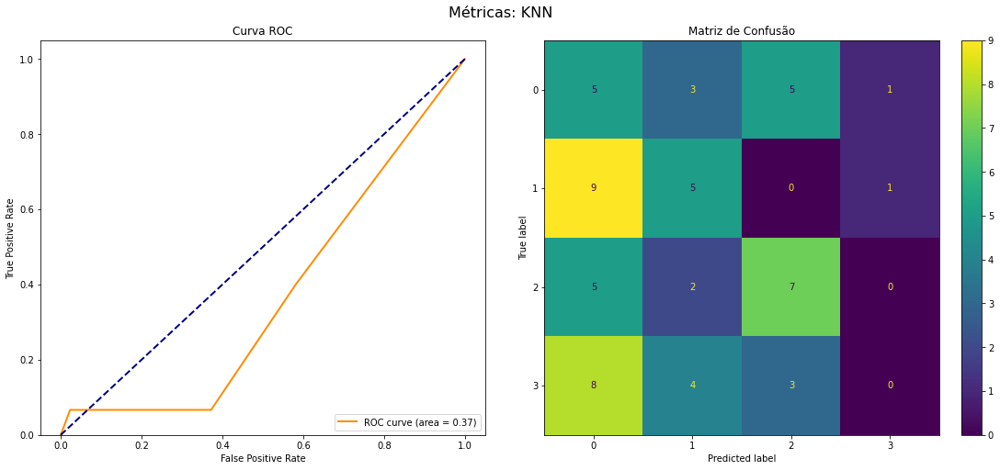

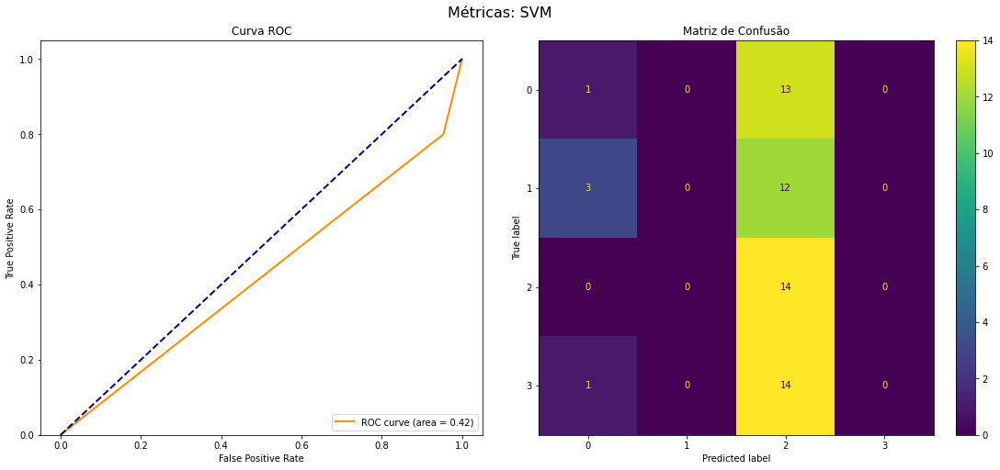

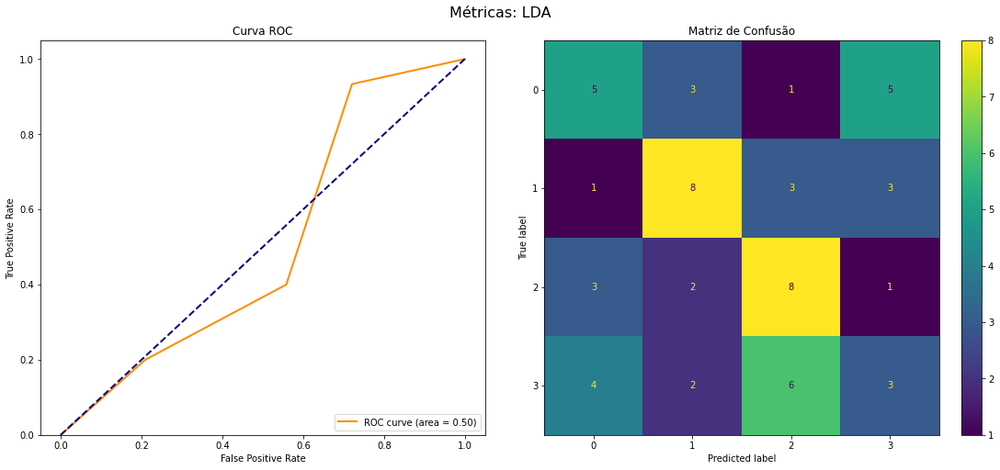

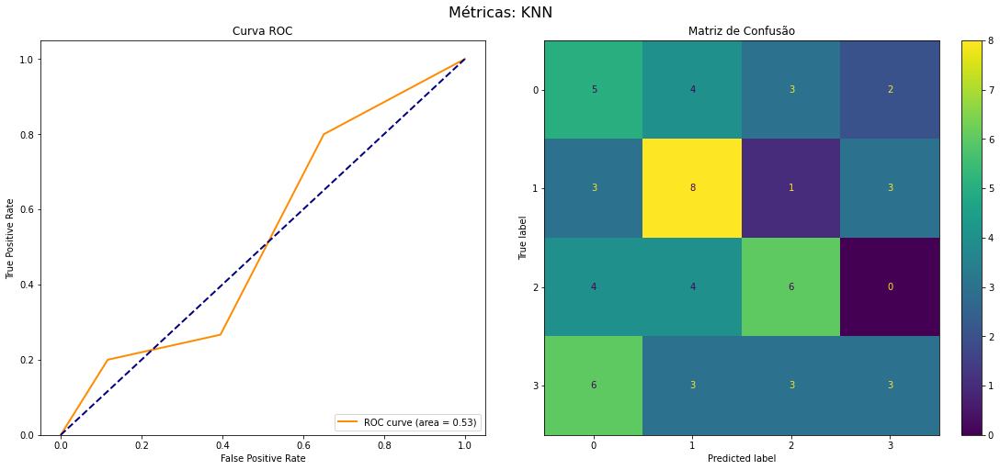

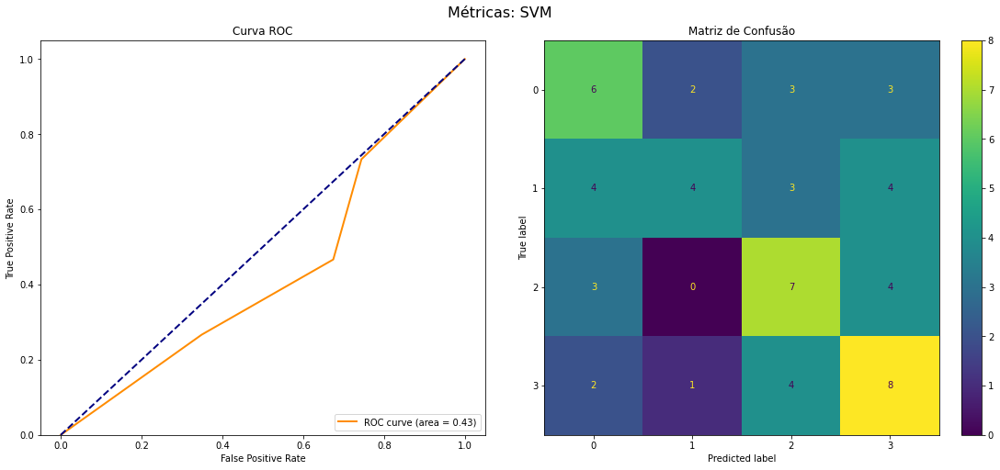

...

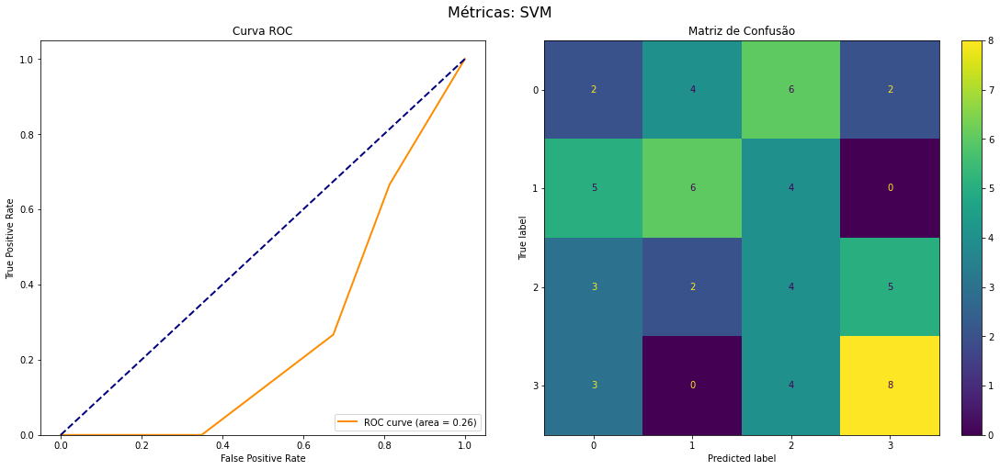

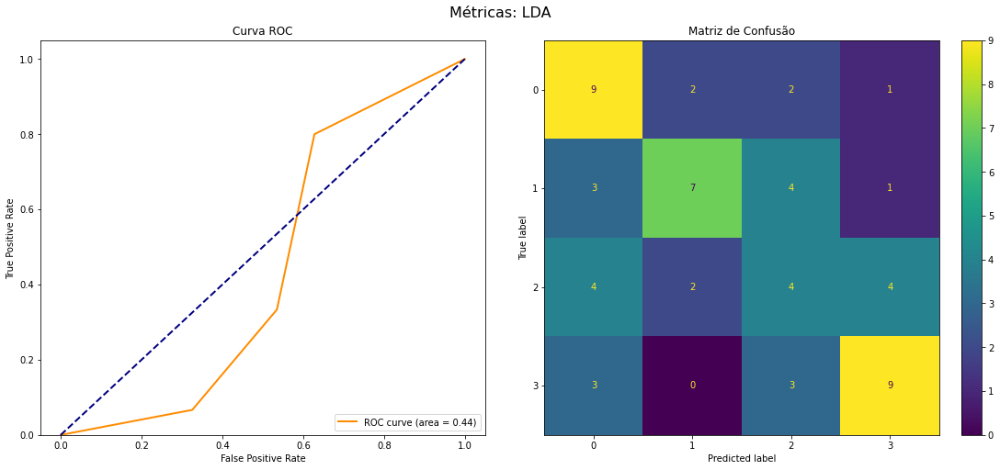

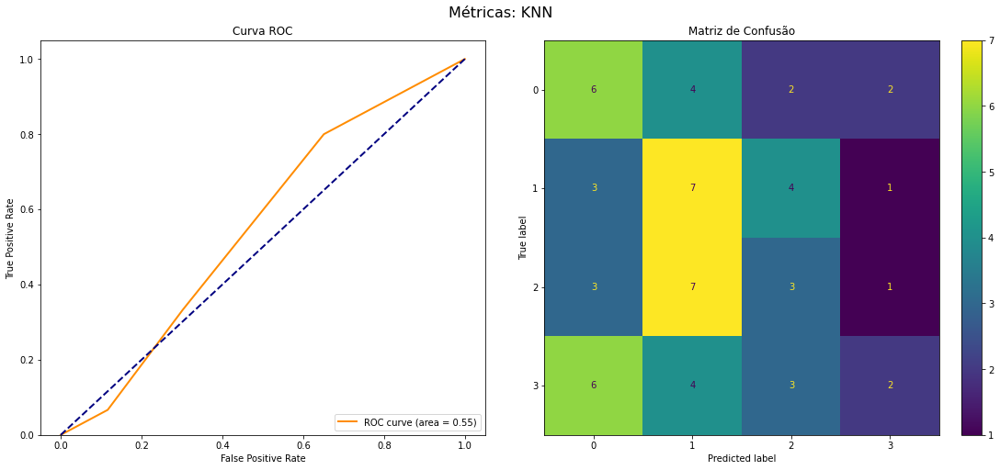

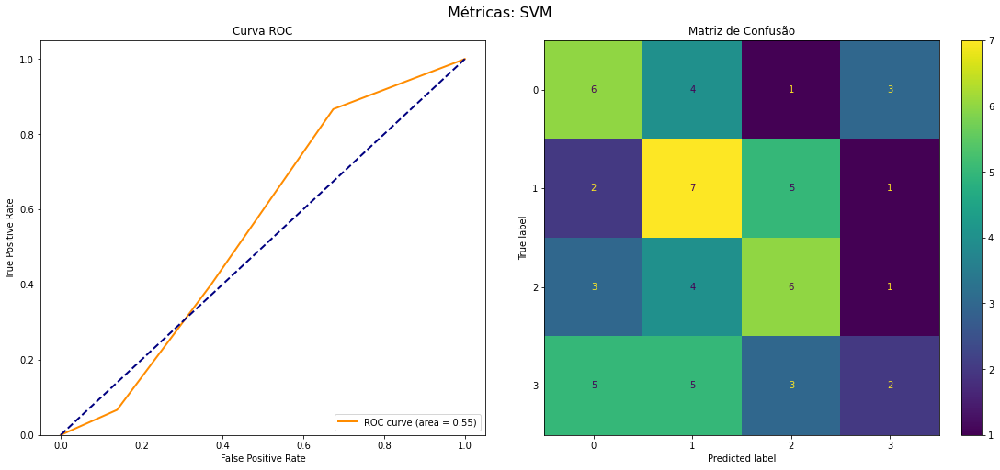

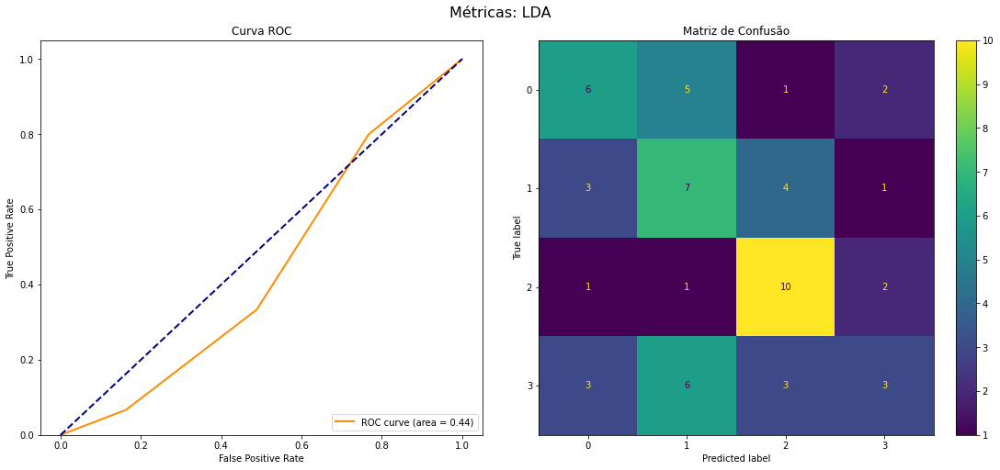

In [28]:
directory = 'C:/Users/Maods/Documents/TCC/data/BCICIV_2a_gdf-dataset/'
files = [ file.stem for file in Path(directory).glob('*T.gdf')]
for file in files:
    extension = file + '.gdf'
    x_train_BCICIV, y_train_BCICIV = load_eeg_data_gdf(directory, extension)
    run_pipeline(x_train_BCICIV, y_train_BCICIV, fs=250, dataset_name="BCICIV_II", subject_id=file, results=models_resut, multiclass=False)

## Dataset C

### Training all subjects' data at once


Training KNN model...
Data Shape: (6915, 7232)...
----------------------------------------------------------------------------------------------------
PIPELINE: 
MODEL: KNN
Runtime: 0:00:02.947320
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.34      0.32      0.33       342
           1       0.32      0.34      0.33       348
           2       0.27      0.20      0.23       345
           3       0.30      0.37      0.33       348

    accuracy                           0.31      1383
   macro avg       0.31      0.31      0.31      1383
weighted avg       0.31      0.31      0.31      1383
 

Train Data:

Cross validation score ACC: 0.315 

Test Data:

Accuracy: 0.309472161966739 

Precision: 0.3074146163061029 

Recall: 0.309472161966739 

F1 Score: 0.30648693133788496 

Area Under Curve: 0.4597395746571159 

Cohen_kappa: 0.07906269414769551 

Matthews Coef: 0.07942150390851532 


Training SVM mode

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

----------------------------------------------------------------------------------------------------
PIPELINE: 
MODEL: LDA
Runtime: 0:08:37.630727
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.25      0.29      0.27       342
           1       0.29      0.28      0.29       348
           2       0.22      0.20      0.21       345
           3       0.26      0.25      0.25       348

    accuracy                           0.26      1383
   macro avg       0.25      0.26      0.25      1383
weighted avg       0.25      0.26      0.25      1383
 

Train Data:

Cross validation score ACC: 0.245 

Test Data:

Accuracy: 0.25524222704266086 

Precision: 0.2546141178354631 

Recall: 0.25524222704266086 

F1 Score: 0.25455584317133384 

Area Under Curve: 0.5036689988339164 

Cohen_kappa: 0.007090863847468043 

Matthews Coef: 0.007098253750773239 


Training XGB model...
Data Shape: (6915, 7232)...
------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: STD_Scaler
MODEL: LDA
Runtime: 0:07:31.101003
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.23      0.26      0.24       342
           1       0.26      0.25      0.26       348
           2       0.28      0.27      0.27       345
           3       0.24      0.23      0.24       348

    accuracy                           0.25      1383
   macro avg       0.25      0.25      0.25      1383
weighted avg       0.25      0.25      0.25      1383
 

Train Data:

Cross validation score ACC: 0.254 

Test Data:

Accuracy: 0.25162689804772237 

Precision: 0.25248097661279395 

Recall: 0.25162689804772237 

F1 Score: 0.2517351058140098 

Area Under Curve: 0.47652840246543393 

Cohen_kappa: 0.002306383014314961 

Matthews Coef: 0.0023085189019095725 


Training XGB model...
Data Shape: (6915, 7232)...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet
MODEL: LDA
Runtime: 0:00:46.388457
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.25      0.23      0.24       342
           1       0.32      0.34      0.33       348
           2       0.27      0.28      0.27       345
           3       0.26      0.27      0.26       348

    accuracy                           0.28      1383
   macro avg       0.28      0.28      0.28      1383
weighted avg       0.28      0.28      0.28      1383
 

Train Data:

Cross validation score ACC: 0.26 

Test Data:

Accuracy: 0.27765726681127983 

Precision: 0.27668476064944947 

Recall: 0.27765726681127983 

F1 Score: 0.2769716863838997 

Area Under Curve: 0.4648175912043978 

Cohen_kappa: 0.03674894218682356 

Matthews Coef: 0.036766507443593416 


Training XGB model...
Data Shape: (6915, 2048)...
-------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 113, using nperseg = 113
  warnings.warn('nperseg = {0:d} is greater than input length '



Training KNN model...
Data Shape: (6915, 3648)...
----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: KNN
Runtime: 0:00:01.625123
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.31      0.37      0.33       342
           1       0.29      0.33      0.31       348
           2       0.34      0.32      0.33       345
           3       0.34      0.25      0.29       348

    accuracy                           0.32      1383
   macro avg       0.32      0.32      0.32      1383
weighted avg       0.32      0.32      0.31      1383
 

Train Data:

Cross validation score ACC: 0.295 

Test Data:

Accuracy: 0.31597975415762836 

Precision: 0.3196277402489465 

Recall: 0.31597975415762836 

F1 Score: 0.31491524709716123 

Area Under Curve: 0.4484840912876895 

Cohen_kappa: 0.08815559477113255 

Matthews Coef: 0.08865422571454724 


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: LDA
Runtime: 0:02:54.338493
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.30      0.24      0.27       342
           1       0.26      0.29      0.28       348
           2       0.30      0.28      0.29       345
           3       0.27      0.31      0.29       348

    accuracy                           0.28      1383
   macro avg       0.28      0.28      0.28      1383
weighted avg       0.28      0.28      0.28      1383
 

Train Data:

Cross validation score ACC: 0.26 

Test Data:

Accuracy: 0.2812725958062184 

Precision: 0.2831123242259284 

Recall: 0.2812725958062184 

F1 Score: 0.2808012854193085 

Area Under Curve: 0.4648120384252318 

Cohen_kappa: 0.04136750849358162 

Matthews Coef: 0.04149789252151624 


Training XGB model...
Data Shape: (6915, 3648)...
---

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 32, using nperseg = 32
  warnings.warn('nperseg = {0:d} is greater than input length '



Training KNN model...
Data Shape: (6915, 512)...
----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: KNN
Runtime: 0:00:00.322547
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.28      0.26      0.27       342
           1       0.28      0.27      0.28       348
           2       0.27      0.27      0.27       345
           3       0.28      0.32      0.30       348

    accuracy                           0.28      1383
   macro avg       0.28      0.28      0.28      1383
weighted avg       0.28      0.28      0.28      1383
 

Train Data:

Cross validation score ACC: 0.283 

Test Data:

Accuracy: 0.28054953000723065 

Precision: 0.28043514292244476 

Recall: 0.28054953000723065 

F1 Score: 0.280079017292414 

Area Under Curve: 0.45100505302904104 

Cohen_kappa: 0.04060379663172331 

Matthews Coef: 0.0406

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: LDA
Runtime: 0:00:04.412150
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.38      0.36      0.37       342
           1       0.34      0.30      0.32       348
           2       0.33      0.37      0.35       345
           3       0.33      0.34      0.34       348

    accuracy                           0.34      1383
   macro avg       0.34      0.34      0.34      1383
weighted avg       0.34      0.34      0.34      1383
 

Train Data:

Cross validation score ACC: 0.332 

Test Data:

Accuracy: 0.34345625451916123 

Precision: 0.3444884156837404 

Recall: 0.34345625451916123 

F1 Score: 0.3433471848263737 

Area Under Curve: 0.42994752623688154 

Cohen_kappa: 0.12458225105509069 

Matthews Coef: 0.12473512713942891 


Training XGB model...
Data Shape:

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 113, using nperseg = 113
  warnings.warn('nperseg = {0:d} is greater than input length '



Processing step Time Domain Features...
Data Shape: (6915, 64, 57)...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 57, using nperseg = 57
  warnings.warn('nperseg = {0:d} is greater than input length '



Processing step STD_Scaler...
Data Shape: (6915, 512)...

Training KNN model...
Data Shape: (6915, 512)...
----------------------------------------------------------------------------------------------------
PIPELINE: PSD -> Time Domain Features -> STD_Scaler
MODEL: KNN
Runtime: 0:00:00.271646
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.33      0.34      0.33       342
           1       0.30      0.34      0.32       348
           2       0.32      0.31      0.32       345
           3       0.29      0.25      0.27       348

    accuracy                           0.31      1383
   macro avg       0.31      0.31      0.31      1383
weighted avg       0.31      0.31      0.31      1383
 

Train Data:

Cross validation score ACC: 0.308 

Test Data:

Accuracy: 0.31019522776572667 

Precision: 0.30995234592524773 

Recall: 0.31019522776572667 

F1 Score: 0.3092494245674446 

Area Under Curve: 0.4634224

c:\Users\Maods\Documents\Repos\EEG-Analysis-\src\utils\mlpipelinebuilder.py:107: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1, 2, constrained_layout=True, figsize=(15,7))


----------------------------------------------------------------------------------------------------
PIPELINE: PSD -> Time Domain Features -> STD_Scaler
MODEL: SVM
Runtime: 0:00:13.769020
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.35      0.36      0.36       342
           1       0.31      0.27      0.29       348
           2       0.33      0.32      0.33       345
           3       0.29      0.34      0.31       348

    accuracy                           0.32      1383
   macro avg       0.32      0.32      0.32      1383
weighted avg       0.32      0.32      0.32      1383
 

Train Data:

Cross validation score ACC: 0.32 

Test Data:

Accuracy: 0.32176428054953 

Precision: 0.3224839619020373 

Recall: 0.32176428054953 

F1 Score: 0.3211880263531046 

Area Under Curve: 0.44661280470875675 

Cohen_kappa: 0.09568145220319135 

Matthews Coef: 0.09587956126449232 


Training LDA model...
Data Sha

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: PSD -> Time Domain Features -> STD_Scaler
MODEL: LDA
Runtime: 0:00:03.737892
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.35      0.33      0.34       342
           1       0.31      0.27      0.29       348
           2       0.32      0.32      0.32       345
           3       0.27      0.32      0.29       348

    accuracy                           0.31      1383
   macro avg       0.31      0.31      0.31      1383
weighted avg       0.31      0.31      0.31      1383
 

Train Data:

Cross validation score ACC: 0.32 

Test Data:

Accuracy: 0.30874909616775126 

Precision: 0.31065648401662604 

Recall: 0.30874909616775126 

F1 Score: 0.30887162272948865 

Area Under Curve: 0.44530373702037873 

Cohen_kappa: 0.07826803502747115 

Matthews Coef: 0.07842264440583496 


Training XGB model...


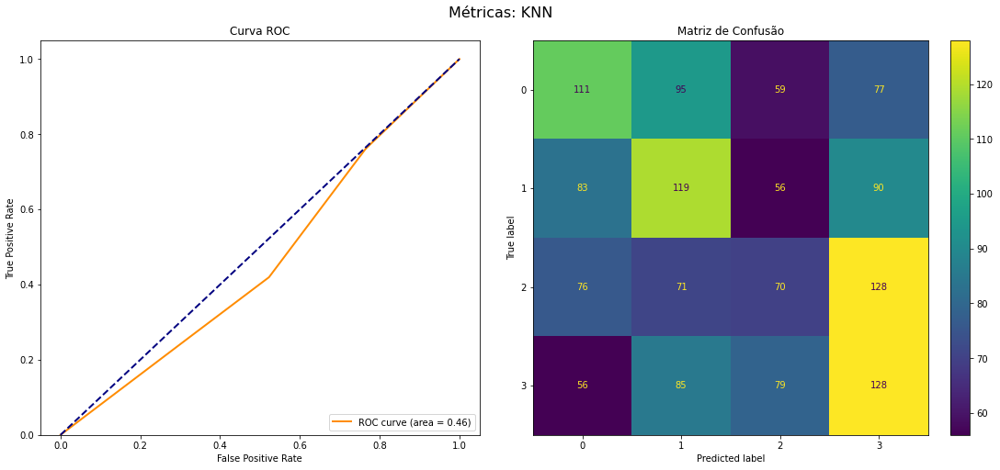

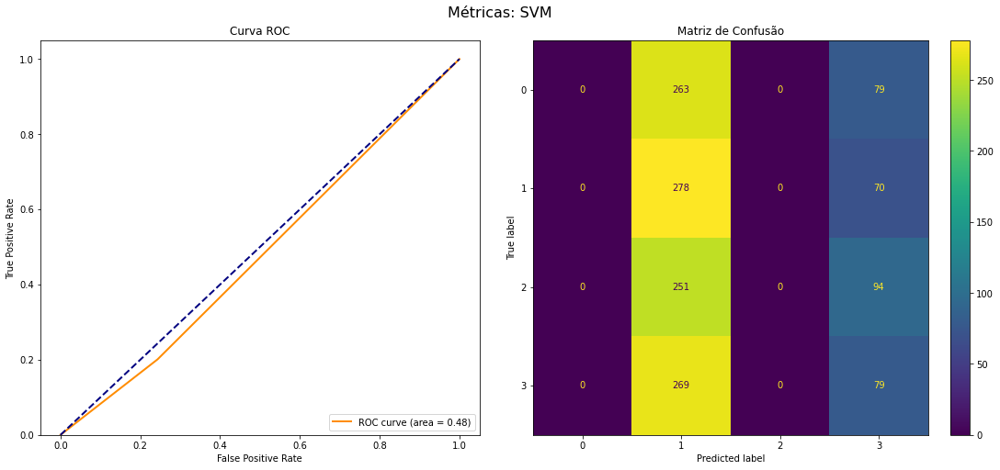

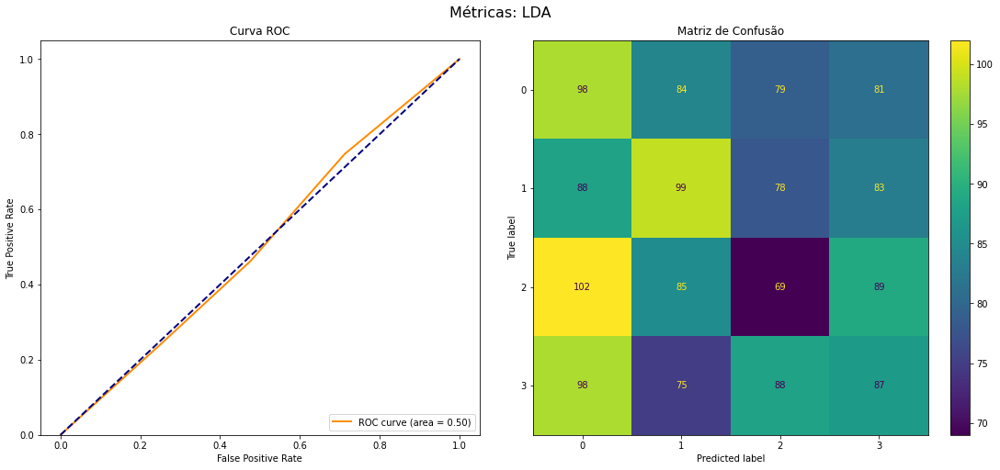

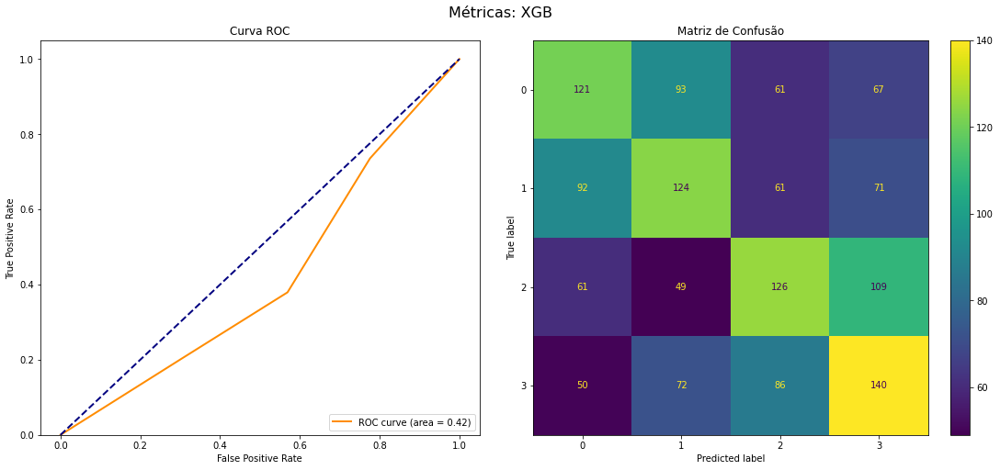

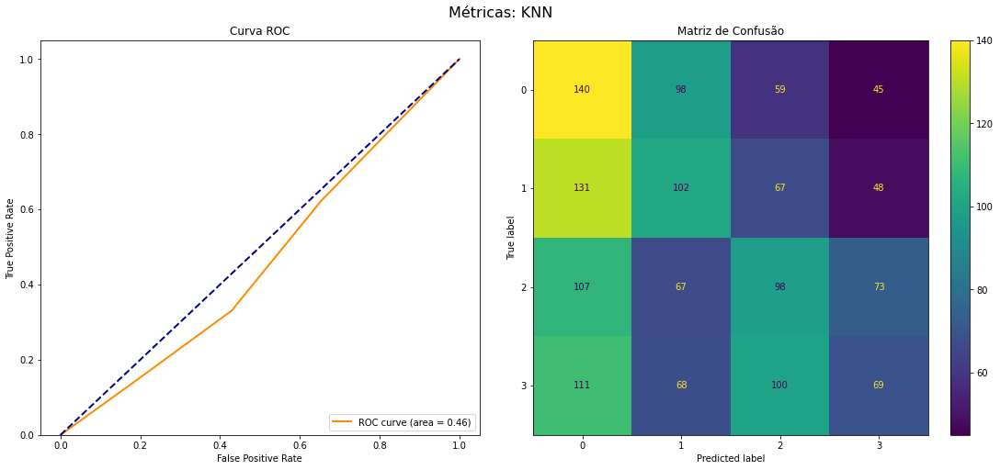

...

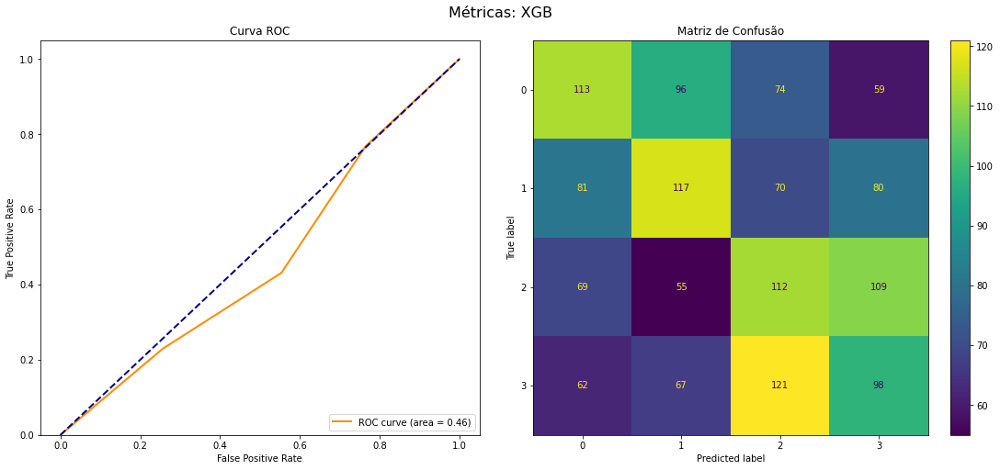

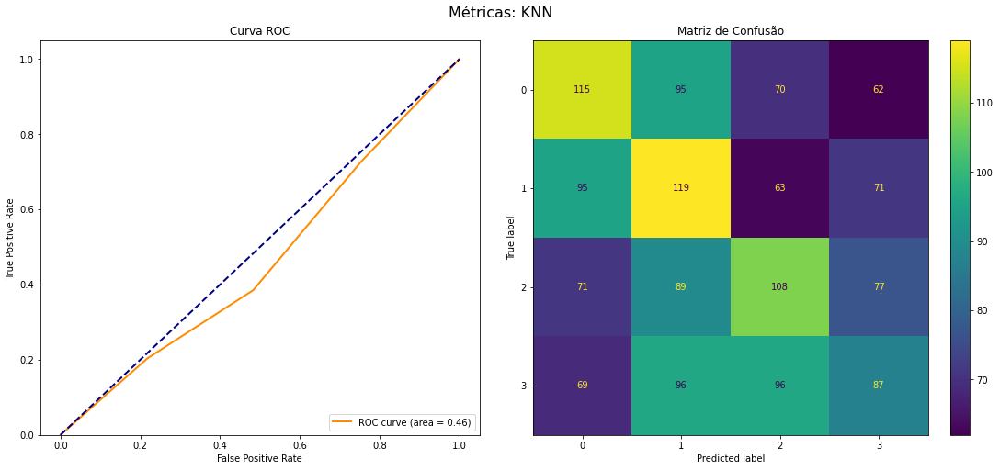

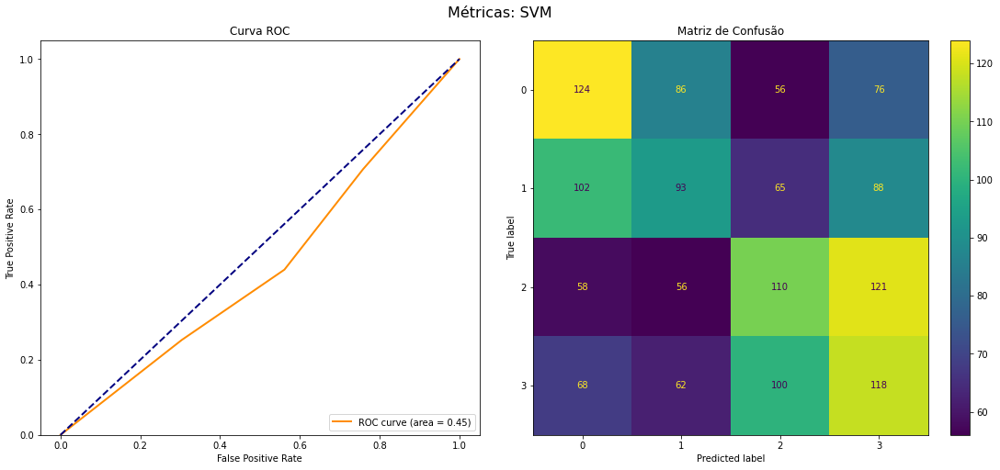

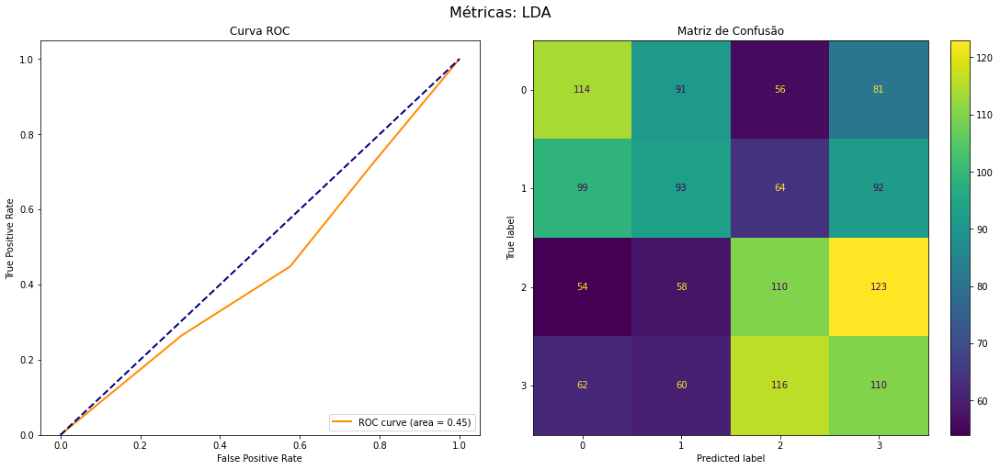

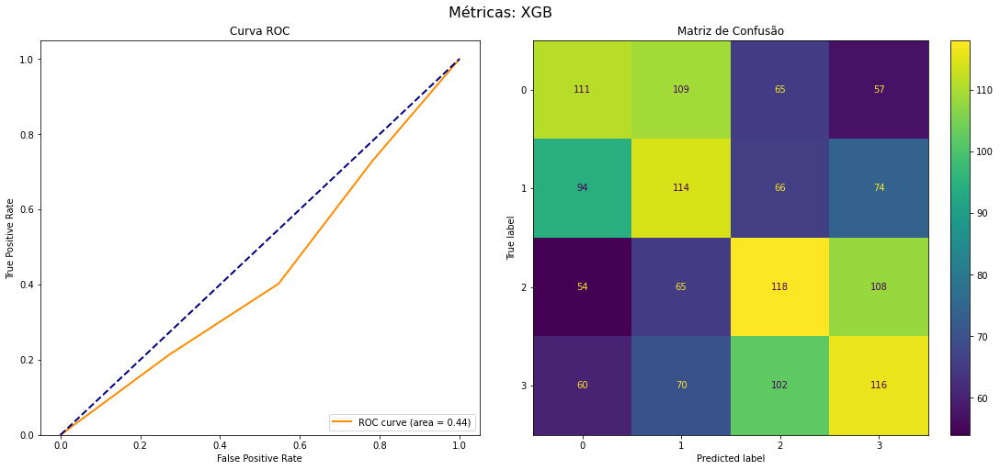

In [20]:
directory = 'C:/Users/Maods/Documents/TCC/data/eeg-motor-movementimagery-dataset/files/'
extension = '**/*.edf'

x_movementimagery, y_movementimagery  = load_eeg_data_edf(directory, extension)
run_pipeline(x_movementimagery, y_movementimagery , fs=160, dataset_name="eeg-mi", subject_id="all", results=models_resut, multiclass=True)

### Training the subjects' data separately


Training KNN model...
Data Shape: (180, 7232)...
----------------------------------------------------------------------------------------------------
PIPELINE: 
MODEL: KNN
Runtime: 0:00:00.046641
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.33      0.22      0.27         9
           1       0.31      0.56      0.40         9
           2       0.60      0.33      0.43         9
           3       0.33      0.33      0.33         9

    accuracy                           0.36        36
   macro avg       0.39      0.36      0.36        36
weighted avg       0.39      0.36      0.36        36
 

Train Data:

Cross validation score ACC: 0.286 

Test Data:

Accuracy: 0.3611111111111111 

Precision: 0.39479166666666665 

Recall: 0.3611111111111111 

F1 Score: 0.35714285714285715 

Area Under Curve: 0.4053497942386831 

Cohen_kappa: 0.14814814814814814 

Matthews Coef: 0.1541314241705833 


Training SVM mod

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

----------------------------------------------------------------------------------------------------
PIPELINE: 
MODEL: LDA
Runtime: 0:00:21.262350
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.75      0.33      0.46         9
           1       0.27      0.33      0.30         9
           2       0.58      0.78      0.67         9
           3       0.33      0.33      0.33         9

    accuracy                           0.44        36
   macro avg       0.48      0.44      0.44        36
weighted avg       0.48      0.44      0.44        36
 

Train Data:

Cross validation score ACC: 0.271 

Test Data:

Accuracy: 0.4444444444444444 

Precision: 0.4848484848484848 

Recall: 0.4444444444444444 

F1 Score: 0.4403846153846154 

Area Under Curve: 0.6069958847736625 

Cohen_kappa: 0.2592592592592593 

Matthews Coef: 0.2644806905783364 


Training XGB model...
Data Shape: (180, 7232)...
--------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: STD_Scaler
MODEL: LDA
Runtime: 0:00:20.441113
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.29      0.22      0.25         9
           1       0.33      0.33      0.33         9
           2       0.60      0.67      0.63         9
           3       0.40      0.44      0.42         9

    accuracy                           0.42        36
   macro avg       0.40      0.42      0.41        36
weighted avg       0.40      0.42      0.41        36
 

Train Data:

Cross validation score ACC: 0.342 

Test Data:

Accuracy: 0.4166666666666667 

Precision: 0.40476190476190477 

Recall: 0.4166666666666667 

F1 Score: 0.4089912280701754 

Area Under Curve: 0.51440329218107 

Cohen_kappa: 0.2222222222222222 

Matthews Coef: 0.22291128503014113 


Training XGB model...
Data Shape: (180, 7232)...
----------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet
MODEL: LDA
Runtime: 0:00:02.037075
--------------------------------------------------


              precision    recall  f1-score   support

           0       1.00      0.33      0.50         9
           1       0.09      0.11      0.10         9
           2       0.50      0.56      0.53         9
           3       0.42      0.56      0.48         9

    accuracy                           0.39        36
   macro avg       0.50      0.39      0.40        36
weighted avg       0.50      0.39      0.40        36
 

Train Data:

Cross validation score ACC: 0.305 

Test Data:

Accuracy: 0.3888888888888889 

Precision: 0.5018939393939394 

Recall: 0.3888888888888889 

F1 Score: 0.4006265664160401 

Area Under Curve: 0.7654320987654321 

Cohen_kappa: 0.18518518518518523 

Matthews Coef: 0.19014018499356047 


Training XGB model...
Data Shape: (180, 2048)...
-----------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 113, using nperseg = 113
  warnings.warn('nperseg = {0:d} is greater than input length '
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env


Training KNN model...
Data Shape: (180, 3648)...
----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: KNN
Runtime: 0:00:00.026106
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.12      0.11      0.12         9
           1       0.26      0.56      0.36         9
           2       0.00      0.00      0.00         9
           3       0.44      0.44      0.44         9

    accuracy                           0.28        36
   macro avg       0.21      0.28      0.23        36
weighted avg       0.21      0.28      0.23        36
 

Train Data:

Cross validation score ACC: 0.361 

Test Data:

Accuracy: 0.2777777777777778 

Precision: 0.20815058479532164 

Recall: 0.2777777777777778 

F1 Score: 0.22980859010270777 

Area Under Curve: 0.3724279835390947 

Cohen_kappa: 0.03703703703703709 

Matthews Coef: 0.04108240150088805 




c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: LDA
Runtime: 0:00:04.862027
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.50      0.33      0.40         9
           1       0.67      0.67      0.67         9
           2       0.46      0.67      0.55         9
           3       0.38      0.33      0.35         9

    accuracy                           0.50        36
   macro avg       0.50      0.50      0.49        36
weighted avg       0.50      0.50      0.49        36
 

Train Data:

Cross validation score ACC: 0.376 

Test Data:

Accuracy: 0.5 

Precision: 0.500801282051282 

Recall: 0.5 

F1 Score: 0.49126559714795015 

Area Under Curve: 0.4444444444444444 

Cohen_kappa: 0.33333333333333337 

Matthews Coef: 0.337882975100225 


Training XGB model...
Data Shape: (180, 3648)...
-----------------------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 32, using nperseg = 32
  warnings.warn('nperseg = {0:d} is greater than input length '


----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: SVM
Runtime: 0:00:00.022293
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.20      0.22      0.21         9
           1       0.27      0.44      0.33         9
           2       0.00      0.00      0.00         9
           3       0.17      0.11      0.13         9

    accuracy                           0.19        36
   macro avg       0.16      0.19      0.17        36
weighted avg       0.16      0.19      0.17        36
 

Train Data:

Cross validation score ACC: 0.264 

Test Data:

Accuracy: 0.19444444444444445 

Precision: 0.15833333333333333 

Recall: 0.19444444444444445 

F1 Score: 0.16929824561403511 

Area Under Curve: 0.43209876543209874 

Cohen_kappa: -0.07407407407407418 

Matthews Coef: -0.07655590023509527 


Training LDA model...
Data Sh

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: LDA
Runtime: 0:00:00.422642
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.25      0.22      0.24         9
           1       0.36      0.44      0.40         9
           2       0.25      0.22      0.24         9
           3       0.44      0.44      0.44         9

    accuracy                           0.33        36
   macro avg       0.33      0.33      0.33        36
weighted avg       0.33      0.33      0.33        36
 

Train Data:

Cross validation score ACC: 0.388 

Test Data:

Accuracy: 0.3333333333333333 

Precision: 0.32702020202020204 

Recall: 0.3333333333333333 

F1 Score: 0.32875816993464047 

Area Under Curve: 0.5205761316872428 

Cohen_kappa: 0.11111111111111116 

Matthews Coef: 0.11145564251507056 


Training XGB model...
Data Shape: 

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 113, using nperseg = 113
  warnings.warn('nperseg = {0:d} is greater than input length '
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 57, using nperseg = 57
  warnings.warn('nperseg = {0:d} is greater than input length '



Processing step STD_Scaler...
Data Shape: (180, 512)...

Training KNN model...
Data Shape: (180, 512)...
----------------------------------------------------------------------------------------------------
PIPELINE: PSD -> Time Domain Features -> STD_Scaler
MODEL: KNN
Runtime: 0:00:00.007505
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.33      0.56      0.42         9
           1       0.40      0.22      0.29         9
           2       0.57      0.44      0.50         9
           3       0.33      0.33      0.33         9

    accuracy                           0.39        36
   macro avg       0.41      0.39      0.38        36
weighted avg       0.41      0.39      0.38        36
 

Train Data:

Cross validation score ACC: 0.306 

Test Data:

Accuracy: 0.3888888888888889 

Precision: 0.4095238095238095 

Recall: 0.3888888888888889 

F1 Score: 0.3839285714285714 

Area Under Curve: 0.292181069958

c:\Users\Maods\Documents\Repos\EEG-Analysis-\src\utils\mlpipelinebuilder.py:107: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1, 2, constrained_layout=True, figsize=(15,7))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Docu

----------------------------------------------------------------------------------------------------
PIPELINE: PSD -> Time Domain Features -> STD_Scaler
MODEL: LDA
Runtime: 0:00:00.416754
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.18      0.22      0.20         9
           1       0.00      0.00      0.00         9
           2       0.29      0.44      0.35         9
           3       0.25      0.11      0.15         9

    accuracy                           0.19        36
   macro avg       0.18      0.19      0.18        36
weighted avg       0.18      0.19      0.18        36
 

Train Data:

Cross validation score ACC: 0.32 

Test Data:

Accuracy: 0.19444444444444445 

Precision: 0.1793831168831169 

Recall: 0.19444444444444445 

F1 Score: 0.17541806020066886 

Area Under Curve: 0.5555555555555555 

Cohen_kappa: -0.07407407407407418 

Matthews Coef: -0.07638819817118042 


Training XGB model...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

----------------------------------------------------------------------------------------------------
PIPELINE: 
MODEL: LDA
Runtime: 0:00:20.432009
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.27      0.33      0.30         9
           1       0.17      0.11      0.13         9
           2       0.27      0.33      0.30         9
           3       0.50      0.44      0.47         9

    accuracy                           0.31        36
   macro avg       0.30      0.31      0.30        36
weighted avg       0.30      0.31      0.30        36
 

Train Data:

Cross validation score ACC: 0.25 

Test Data:

Accuracy: 0.3055555555555556 

Precision: 0.303030303030303 

Recall: 0.3055555555555556 

F1 Score: 0.3009803921568628 

Area Under Curve: 0.4691358024691358 

Cohen_kappa: 0.07407407407407407 

Matthews Coef: 0.0747696205456059 


Training XGB model...
Data Shape: (180, 7232)...
---------------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: STD_Scaler
MODEL: LDA
Runtime: 0:00:20.752557
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.40      0.44      0.42         9
           1       0.40      0.22      0.29         9
           2       0.42      0.56      0.48         9
           3       0.67      0.67      0.67         9

    accuracy                           0.47        36
   macro avg       0.47      0.47      0.46        36
weighted avg       0.47      0.47      0.46        36
 

Train Data:

Cross validation score ACC: 0.25 

Test Data:

Accuracy: 0.4722222222222222 

Precision: 0.4708333333333333 

Recall: 0.4722222222222222 

F1 Score: 0.46240601503759393 

Area Under Curve: 0.49588477366255146 

Cohen_kappa: 0.2962962962962963 

Matthews Coef: 0.30034042231131114 


Training XGB model...
Data Shape: (180, 7232)...
--------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet
MODEL: LDA
Runtime: 0:00:02.003690
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.40      0.44      0.42         9
           1       0.25      0.11      0.15         9
           2       0.36      0.44      0.40         9
           3       0.55      0.67      0.60         9

    accuracy                           0.42        36
   macro avg       0.39      0.42      0.39        36
weighted avg       0.39      0.42      0.39        36
 

Train Data:

Cross validation score ACC: 0.299 

Test Data:

Accuracy: 0.4166666666666667 

Precision: 0.38977272727272727 

Recall: 0.4166666666666667 

F1 Score: 0.39372469635627527 

Area Under Curve: 0.43621399176954734 

Cohen_kappa: 0.2222222222222222 

Matthews Coef: 0.22621385432622335 


Training XGB model...
Data Shape: (180, 2048)...
---------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 113, using nperseg = 113
  warnings.warn('nperseg = {0:d} is greater than input length '



Training KNN model...
Data Shape: (180, 3648)...
----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: KNN
Runtime: 0:00:00.024805
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.43      0.33      0.38         9
           1       0.50      0.67      0.57         9
           2       0.33      0.22      0.27         9
           3       0.73      0.89      0.80         9

    accuracy                           0.53        36
   macro avg       0.50      0.53      0.50        36
weighted avg       0.50      0.53      0.50        36
 

Train Data:

Cross validation score ACC: 0.41 

Test Data:

Accuracy: 0.5277777777777778 

Precision: 0.49729437229437234 

Recall: 0.5277777777777778 

F1 Score: 0.5032738095238094 

Area Under Curve: 0.308641975308642 

Cohen_kappa: 0.37037037037037035 

Matthews Coef: 0.3754255278891389 


Trai

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: LDA
Runtime: 0:00:05.095933
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.36      0.44      0.40         9
           1       0.22      0.22      0.22         9
           2       0.33      0.22      0.27         9
           3       0.30      0.33      0.32         9

    accuracy                           0.31        36
   macro avg       0.30      0.31      0.30        36
weighted avg       0.30      0.31      0.30        36
 

Train Data:

Cross validation score ACC: 0.341 

Test Data:

Accuracy: 0.3055555555555556 

Precision: 0.3047979797979798 

Recall: 0.3055555555555556 

F1 Score: 0.3011695906432748 

Area Under Curve: 0.43415637860082307 

Cohen_kappa: 0.07407407407407407 

Matthews Coef: 0.07461336202466366 


Training XGB model...
Data Shape: (180, 3648)...
--

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 32, using nperseg = 32
  warnings.warn('nperseg = {0:d} is greater than input length '


----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: SVM
Runtime: 0:00:00.019696
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.25      0.33      0.29         9
           1       0.25      0.22      0.24         9
           2       0.12      0.11      0.12         9
           3       0.38      0.33      0.35         9

    accuracy                           0.25        36
   macro avg       0.25      0.25      0.25        36
weighted avg       0.25      0.25      0.25        36
 

Train Data:

Cross validation score ACC: 0.278 

Test Data:

Accuracy: 0.25 

Precision: 0.25 

Recall: 0.25 

F1 Score: 0.24789915966386555 

Area Under Curve: 0.5740740740740741 

Cohen_kappa: 0.0 

Matthews Coef: 0.0 


Training LDA model...
Data Shape: (180, 512)...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: LDA
Runtime: 0:00:00.409045
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.18      0.22      0.20         9
           1       0.12      0.11      0.12         9
           2       0.56      0.56      0.56         9
           3       0.38      0.33      0.35         9

    accuracy                           0.31        36
   macro avg       0.31      0.31      0.31        36
weighted avg       0.31      0.31      0.31        36
 

Train Data:

Cross validation score ACC: 0.43 

Test Data:

Accuracy: 0.3055555555555556 

Precision: 0.30934343434343436 

Recall: 0.3055555555555556 

F1 Score: 0.3065359477124183 

Area Under Curve: 0.4773662551440329 

Cohen_kappa: 0.07407407407407407 

Matthews Coef: 0.07430376167671371 


Training XGB model...
Data Shape: (1

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 113, using nperseg = 113
  warnings.warn('nperseg = {0:d} is greater than input length '
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 57, using nperseg = 57
  warnings.warn('nperseg = {0:d} is greater than input length '



Processing step STD_Scaler...
Data Shape: (180, 512)...

Training KNN model...
Data Shape: (180, 512)...
----------------------------------------------------------------------------------------------------
PIPELINE: PSD -> Time Domain Features -> STD_Scaler
MODEL: KNN
Runtime: 0:00:00.007707
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.43      0.33      0.38         9
           1       0.40      0.44      0.42         9
           2       0.14      0.11      0.12         9
           3       0.42      0.56      0.48         9

    accuracy                           0.36        36
   macro avg       0.35      0.36      0.35        36
weighted avg       0.35      0.36      0.35        36
 

Train Data:

Cross validation score ACC: 0.291 

Test Data:

Accuracy: 0.3611111111111111 

Precision: 0.34702380952380957 

Recall: 0.3611111111111111 

F1 Score: 0.3493107769423559 

Area Under Curve: 0.39094650205

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: PSD -> Time Domain Features -> STD_Scaler
MODEL: LDA
Runtime: 0:00:00.392463
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.33      0.33      0.33         9
           1       0.20      0.11      0.14         9
           2       0.27      0.44      0.33         9
           3       0.29      0.22      0.25         9

    accuracy                           0.28        36
   macro avg       0.27      0.28      0.26        36
weighted avg       0.27      0.28      0.26        36
 

Train Data:

Cross validation score ACC: 0.361 

Test Data:

Accuracy: 0.2777777777777778 

Precision: 0.2714285714285714 

Recall: 0.2777777777777778 

F1 Score: 0.2648809523809524 

Area Under Curve: 0.4238683127572016 

Cohen_kappa: 0.03703703703703709 

Matthews Coef: 0.038152379685825785 


Training XGB model...
Dat

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: 
MODEL: LDA
Runtime: 0:00:20.367260
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         9
           1       0.17      0.11      0.13         9
           2       0.40      0.44      0.42         9
           3       0.25      0.33      0.29         9

    accuracy                           0.22        36
   macro avg       0.20      0.22      0.21        36
weighted avg       0.20      0.22      0.21        36
 

Train Data:

Cross validation score ACC: 0.271 

Test Data:

Accuracy: 0.2222222222222222 

Precision: 0.20416666666666666 

Recall: 0.2222222222222222 

F1 Score: 0.21002506265664161 

Area Under Curve: 0.5164609053497943 

Cohen_kappa: -0.03703703703703698 

Matthews Coef: -0.03742405942825599 


Training XGB model...
Data Shape: (180, 7232)...
--------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: STD_Scaler
MODEL: LDA
Runtime: 0:00:21.330432
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.12      0.11      0.12         9
           1       0.00      0.00      0.00         9
           2       0.22      0.22      0.22         9
           3       0.10      0.11      0.11         9

    accuracy                           0.11        36
   macro avg       0.11      0.11      0.11        36
weighted avg       0.11      0.11      0.11        36
 

Train Data:

Cross validation score ACC: 0.319 

Test Data:

Accuracy: 0.1111111111111111 

Precision: 0.11180555555555556 

Recall: 0.1111111111111111 

F1 Score: 0.11128310973512212 

Area Under Curve: 0.5637860082304527 

Cohen_kappa: -0.18518518518518512 

Matthews Coef: -0.1853759994400162 


Training XGB model...
Data Shape: (180, 7232)...
-----

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet
MODEL: LDA
Runtime: 0:00:02.086541
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         9
           1       0.12      0.11      0.12         9
           2       0.33      0.44      0.38         9
           3       0.00      0.00      0.00         9

    accuracy                           0.14        36
   macro avg       0.11      0.14      0.12        36
weighted avg       0.11      0.14      0.12        36
 

Train Data:

Cross validation score ACC: 0.236 

Test Data:

Accuracy: 0.1388888888888889 

Precision: 0.11458333333333333 

Recall: 0.1388888888888889 

F1 Score: 0.12464985994397759 

Area Under Curve: 0.6234567901234568 

Cohen_kappa: -0.14814814814814814 

Matthews Coef: -0.14907119849998599 


Training XGB model...
Data Shape: (180, 2048)...
-------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 113, using nperseg = 113
  warnings.warn('nperseg = {0:d} is greater than input length '



Training KNN model...
Data Shape: (180, 3648)...
----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: KNN
Runtime: 0:00:00.024157
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         9
           1       0.29      0.22      0.25         9
           2       0.00      0.00      0.00         9
           3       0.28      0.78      0.41         9

    accuracy                           0.25        36
   macro avg       0.14      0.25      0.17        36
weighted avg       0.14      0.25      0.17        36
 

Train Data:

Cross validation score ACC: 0.361 

Test Data:

Accuracy: 0.25 

Precision: 0.14142857142857143 

Recall: 0.25 

F1 Score: 0.1654411764705882 

Area Under Curve: 0.4897119341563786 

Cohen_kappa: 0.0 

Matthews Coef: 0.0 


Training SVM model...
Data Shape: (180, 3648)...
------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: LDA
Runtime: 0:00:05.110682
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.50      0.11      0.18         9
           1       0.30      0.33      0.32         9
           2       0.23      0.33      0.27         9
           3       0.09      0.11      0.10         9

    accuracy                           0.22        36
   macro avg       0.28      0.22      0.22        36
weighted avg       0.28      0.22      0.22        36
 

Train Data:

Cross validation score ACC: 0.417 

Test Data:

Accuracy: 0.2222222222222222 

Precision: 0.28041958041958037 

Recall: 0.2222222222222222 

F1 Score: 0.21758373205741627 

Area Under Curve: 0.5246913580246914 

Cohen_kappa: -0.03703703703703698 

Matthews Coef: -0.038447322405439625 


Training XGB model...
Data Shape: (180, 3648)..

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 32, using nperseg = 32
  warnings.warn('nperseg = {0:d} is greater than input length '


----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: SVM
Runtime: 0:00:00.019482
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.22      0.22      0.22         9
           1       0.10      0.11      0.11         9
           2       0.50      0.56      0.53         9
           3       0.43      0.33      0.38         9

    accuracy                           0.31        36
   macro avg       0.31      0.31      0.31        36
weighted avg       0.31      0.31      0.31        36
 

Train Data:

Cross validation score ACC: 0.313 

Test Data:

Accuracy: 0.3055555555555556 

Precision: 0.3126984126984127 

Recall: 0.3055555555555556 

F1 Score: 0.30720029239766083 

Area Under Curve: 0.46502057613168724 

Cohen_kappa: 0.07407407407407407 

Matthews Coef: 0.07430376167671371 


Training LDA model...
Data Shape: 

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: LDA
Runtime: 0:00:00.379023
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.38      0.33      0.35         9
           1       0.33      0.33      0.33         9
           2       0.42      0.56      0.48         9
           3       0.57      0.44      0.50         9

    accuracy                           0.42        36
   macro avg       0.42      0.42      0.42        36
weighted avg       0.42      0.42      0.42        36
 

Train Data:

Cross validation score ACC: 0.347 

Test Data:

Accuracy: 0.4166666666666667 

Precision: 0.42410714285714285 

Recall: 0.4166666666666667 

F1 Score: 0.41561624649859946 

Area Under Curve: 0.4382716049382716 

Cohen_kappa: 0.2222222222222222 

Matthews Coef: 0.223840086073991 


Training XGB model...
Data Shape: (18

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 113, using nperseg = 113
  warnings.warn('nperseg = {0:d} is greater than input length '
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 57, using nperseg = 57
  warnings.warn('nperseg = {0:d} is greater than input length '



Processing step STD_Scaler...
Data Shape: (180, 512)...

Training KNN model...
Data Shape: (180, 512)...
----------------------------------------------------------------------------------------------------
PIPELINE: PSD -> Time Domain Features -> STD_Scaler
MODEL: KNN
Runtime: 0:00:00.008145
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.50      0.44      0.47         9
           1       0.60      0.33      0.43         9
           2       0.40      0.67      0.50         9
           3       0.38      0.33      0.35         9

    accuracy                           0.44        36
   macro avg       0.47      0.44      0.44        36
weighted avg       0.47      0.44      0.44        36
 

Train Data:

Cross validation score ACC: 0.3 

Test Data:

Accuracy: 0.4444444444444444 

Precision: 0.46875 

Recall: 0.4444444444444444 

F1 Score: 0.4380252100840336 

Area Under Curve: 0.47530864197530864 

Cohen

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: PSD -> Time Domain Features -> STD_Scaler
MODEL: LDA
Runtime: 0:00:00.417850
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.33      0.44      0.38         9
           1       0.54      0.78      0.64         9
           2       0.30      0.33      0.32         9
           3       1.00      0.11      0.20         9

    accuracy                           0.42        36
   macro avg       0.54      0.42      0.38        36
weighted avg       0.54      0.42      0.38        36
 

Train Data:

Cross validation score ACC: 0.368 

Test Data:

Accuracy: 0.4166666666666667 

Precision: 0.5429487179487179 

Recall: 0.4166666666666667 

F1 Score: 0.383276372750057 

Area Under Curve: 0.6131687242798354 

Cohen_kappa: 0.2222222222222222 

Matthews Coef: 0.23328473740792172 


Training XGB model...
Data S

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: 
MODEL: LDA
Runtime: 0:00:20.944104
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.33      0.44      0.38         9
           1       0.43      0.33      0.38         9
           2       0.11      0.11      0.11         9
           3       0.25      0.22      0.24         9

    accuracy                           0.28        36
   macro avg       0.28      0.28      0.28        36
weighted avg       0.28      0.28      0.28        36
 

Train Data:

Cross validation score ACC: 0.298 

Test Data:

Accuracy: 0.2777777777777778 

Precision: 0.28075396825396826 

Recall: 0.2777777777777778 

F1 Score: 0.27558940242763774 

Area Under Curve: 0.4958847736625514 

Cohen_kappa: 0.03703703703703709 

Matthews Coef: 0.03730668101233183 


Training XGB model...
Data Shape: (180, 7232)...
----------------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: STD_Scaler
MODEL: LDA
Runtime: 0:00:20.319863
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.25      0.33      0.29         9
           1       0.40      0.44      0.42         9
           2       0.17      0.11      0.13         9
           3       0.25      0.22      0.24         9

    accuracy                           0.28        36
   macro avg       0.27      0.28      0.27        36
weighted avg       0.27      0.28      0.27        36
 

Train Data:

Cross validation score ACC: 0.271 

Test Data:

Accuracy: 0.2777777777777778 

Precision: 0.26666666666666666 

Recall: 0.2777777777777778 

F1 Score: 0.26884859206840633 

Area Under Curve: 0.6069958847736625 

Cohen_kappa: 0.03703703703703709 

Matthews Coef: 0.03742405942825599 


Training XGB model...
Data Shape: (180, 7232)...
------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet
MODEL: LDA
Runtime: 0:00:02.175804
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.29      0.44      0.35         9
           1       0.29      0.22      0.25         9
           2       0.00      0.00      0.00         9
           3       0.36      0.44      0.40         9

    accuracy                           0.28        36
   macro avg       0.23      0.28      0.25        36
weighted avg       0.23      0.28      0.25        36
 

Train Data:

Cross validation score ACC: 0.278 

Test Data:

Accuracy: 0.2777777777777778 

Precision: 0.23376623376623376 

Recall: 0.2777777777777778 

F1 Score: 0.2494565217391304 

Area Under Curve: 0.5349794238683128 

Cohen_kappa: 0.03703703703703709 

Matthews Coef: 0.03819409908559021 


Training XGB model...
Data Shape: (180, 2048)...
----------

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 113, using nperseg = 113
  warnings.warn('nperseg = {0:d} is greater than input length '



Training KNN model...
Data Shape: (180, 3648)...
----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: KNN
Runtime: 0:00:00.025643
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.56      0.56      0.56         9
           1       0.41      0.78      0.54         9
           2       0.40      0.22      0.29         9
           3       0.60      0.33      0.43         9

    accuracy                           0.47        36
   macro avg       0.49      0.47      0.45        36
weighted avg       0.49      0.47      0.45        36
 

Train Data:

Cross validation score ACC: 0.396 

Test Data:

Accuracy: 0.4722222222222222 

Precision: 0.49183006535947704 

Recall: 0.4722222222222222 

F1 Score: 0.452075702075702 

Area Under Curve: 0.4938271604938272 

Cohen_kappa: 0.2962962962962963 

Matthews Coef: 0.31210972585634816 


Tra

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

----------------------------------------------------------------------------------------------------
PIPELINE: bandpass -> PSD
MODEL: LDA
Runtime: 0:00:05.152442
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.29      0.22      0.25         9
           1       0.14      0.22      0.17         9
           2       0.17      0.11      0.13         9
           3       0.22      0.22      0.22         9

    accuracy                           0.19        36
   macro avg       0.20      0.19      0.19        36
weighted avg       0.20      0.19      0.19        36
 

Train Data:

Cross validation score ACC: 0.278 

Test Data:

Accuracy: 0.19444444444444445 

Precision: 0.20436507936507936 

Recall: 0.19444444444444445 

F1 Score: 0.1948671497584541 

Area Under Curve: 0.6790123456790123 

Cohen_kappa: -0.07407407407407418 

Matthews Coef: -0.0755659115938104 


Training XGB model...
Data Shape: (180, 3648)...

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 32, using nperseg = 32
  warnings.warn('nperseg = {0:d} is greater than input length '


Train Data:

Cross validation score ACC: 0.304 

Test Data:

Accuracy: 0.25 

Precision: 0.24791666666666667 

Recall: 0.25 

F1 Score: 0.24871001031991746 

Area Under Curve: 0.5740740740740742 

Cohen_kappa: 0.0 

Matthews Coef: 0.0 


Training LDA model...
Data Shape: (180, 512)...


c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: Wavelet -> Time Domain Features
MODEL: LDA
Runtime: 0:00:00.395619
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.38      0.33      0.35         9
           1       0.50      0.44      0.47         9
           2       0.27      0.33      0.30         9
           3       0.56      0.56      0.56         9

    accuracy                           0.42        36
   macro avg       0.43      0.42      0.42        36
weighted avg       0.43      0.42      0.42        36
 

Train Data:

Cross validation score ACC: 0.327 

Test Data:

Accuracy: 0.4166666666666667 

Precision: 0.425820707070707 

Recall: 0.4166666666666667 

F1 Score: 0.41977124183006537 

Area Under Curve: 0.3292181069958848 

Cohen_kappa: 0.2222222222222222 

Matthews Coef: 0.22291128503014113 


Training XGB model...
Data Shape: (18

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 113, using nperseg = 113
  warnings.warn('nperseg = {0:d} is greater than input length '
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\scipy\signal\_spectral_py.py:1961: UserWarning: nperseg = 256 is greater than input length  = 57, using nperseg = 57
  warnings.warn('nperseg = {0:d} is greater than input length '



Processing step STD_Scaler...
Data Shape: (180, 512)...

Training KNN model...
Data Shape: (180, 512)...
----------------------------------------------------------------------------------------------------
PIPELINE: PSD -> Time Domain Features -> STD_Scaler
MODEL: KNN
Runtime: 0:00:00.008014
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.50      0.56      0.53         9
           1       0.50      0.22      0.31         9
           2       0.38      0.67      0.48         9
           3       0.50      0.33      0.40         9

    accuracy                           0.44        36
   macro avg       0.47      0.44      0.43        36
weighted avg       0.47      0.44      0.43        36
 

Train Data:

Cross validation score ACC: 0.424 

Test Data:

Accuracy: 0.4444444444444444 

Precision: 0.46875 

Recall: 0.4444444444444444 

F1 Score: 0.428502024291498 

Area Under Curve: 0.4711934156378601 

Cohen

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\discriminant_analysis.py", line 599, in fit
    self._solve_eigen(
  File "c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn

----------------------------------------------------------------------------------------------------
PIPELINE: PSD -> Time Domain Features -> STD_Scaler
MODEL: LDA
Runtime: 0:00:00.410418
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.18      0.22      0.20         9
           1       0.00      0.00      0.00         9
           2       0.50      0.56      0.53         9
           3       0.27      0.33      0.30         9

    accuracy                           0.28        36
   macro avg       0.24      0.28      0.26        36
weighted avg       0.24      0.28      0.26        36
 

Train Data:

Cross validation score ACC: 0.312 

Test Data:

Accuracy: 0.2777777777777778 

Precision: 0.23863636363636362 

Recall: 0.2777777777777778 

F1 Score: 0.256578947368421 

Area Under Curve: 0.5082304526748971 

Cohen_kappa: 0.03703703703703709 

Matthews Coef: 0.03770230905437056 


Training XGB model...
Data

c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_ranking.py:999: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\metrics\_ranking.py:999: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
c:\Users\Maods\Documents\Repos\EEG-Analysis-\env_tcc_eeg\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File

----------------------------------------------------------------------------------------------------
PIPELINE: 
MODEL: LDA
Runtime: 0:00:17.084581
--------------------------------------------------


              precision    recall  f1-score   support

           0       0.50      0.33      0.40         3
           2       0.00      0.00      0.00         3
           3       0.50      0.67      0.57         3

    accuracy                           0.33         9
   macro avg       0.33      0.33      0.32         9
weighted avg       0.33      0.33      0.32         9
 

Train Data:

Cross validation score ACC: 0.532 

Test Data:

Accuracy: 0.3333333333333333 

Precision: 0.3333333333333333 

Recall: 0.3333333333333333 

F1 Score: 0.3238095238095238 

Area Under Curve: nan 

Cohen_kappa: 0.0 

Matthews Coef: 0.0 


Training XGB model...
Data Shape: (45, 7232)...


ValueError: Invalid classes inferred from unique values of `y`.  Expected: [0 1 2], got [0 2 3]

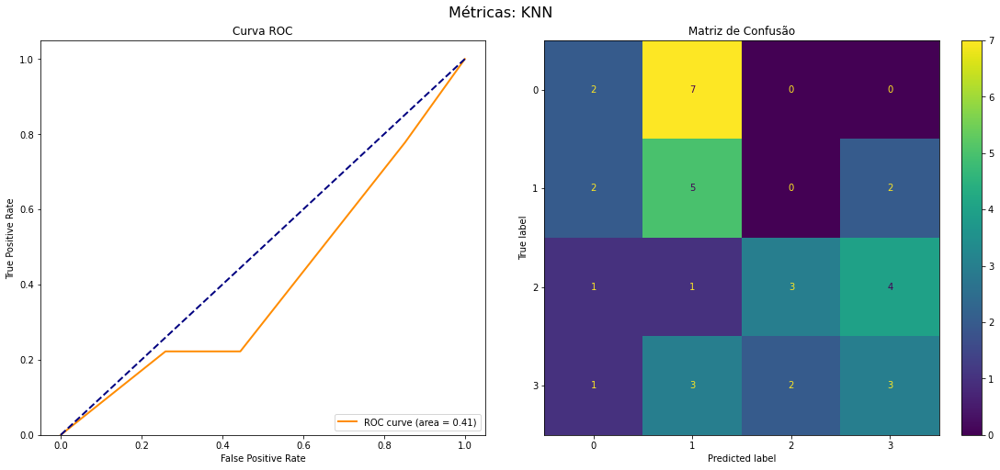

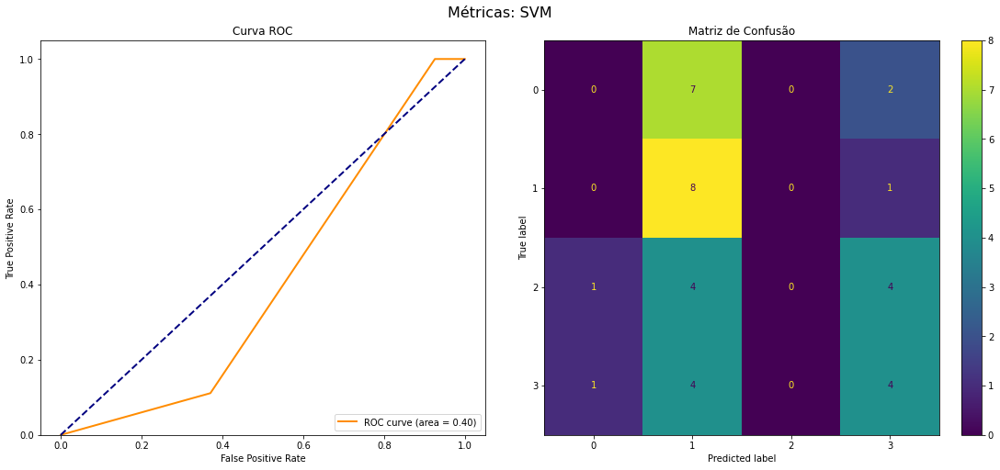

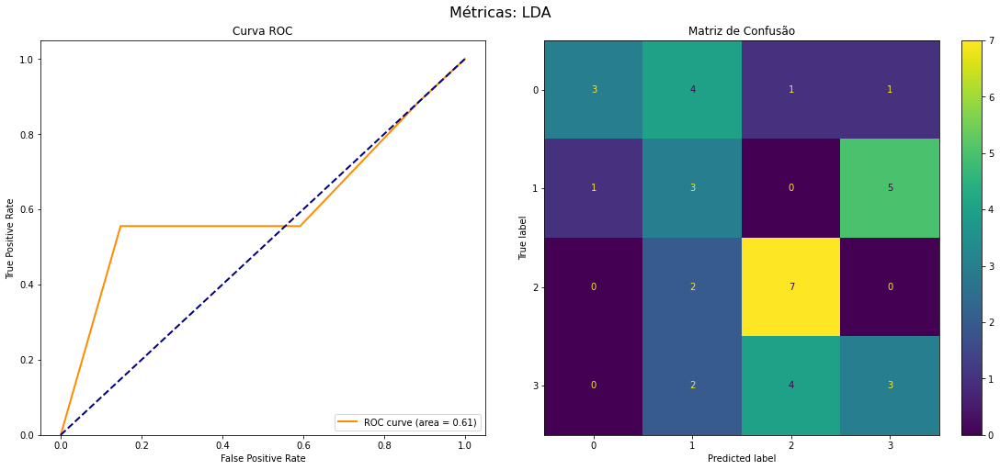

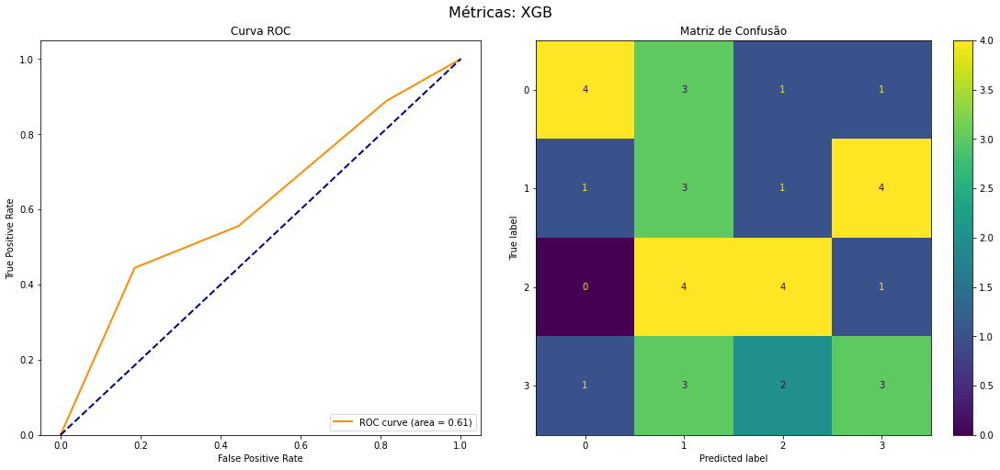

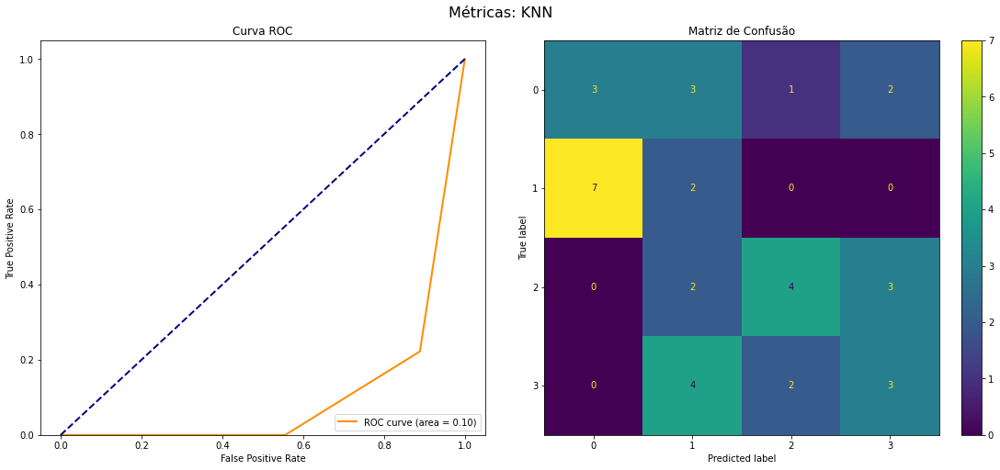

...

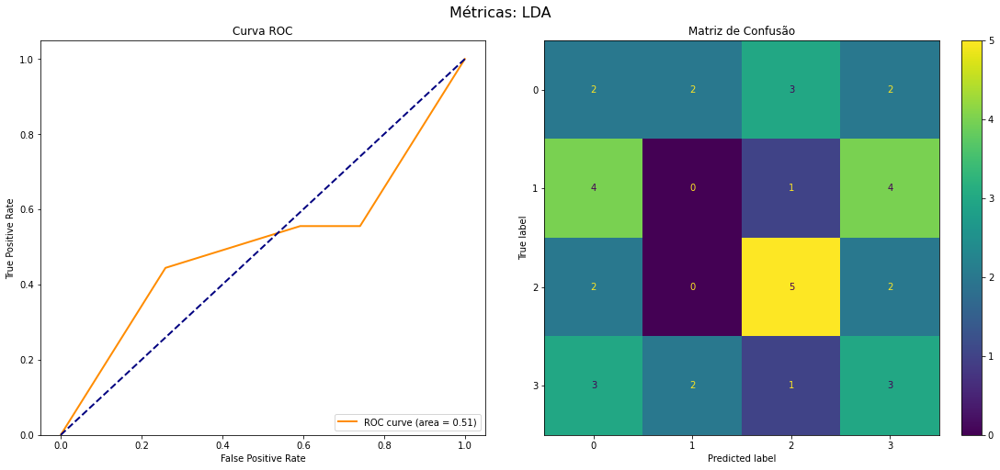

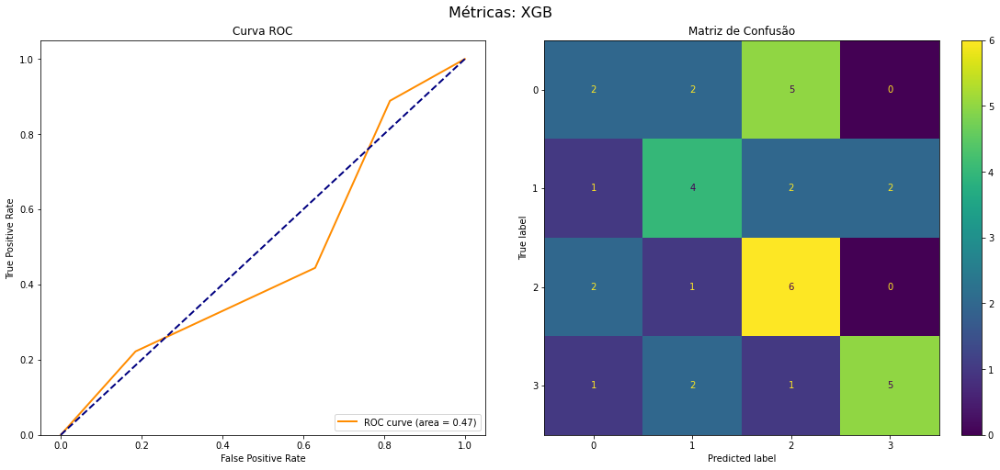

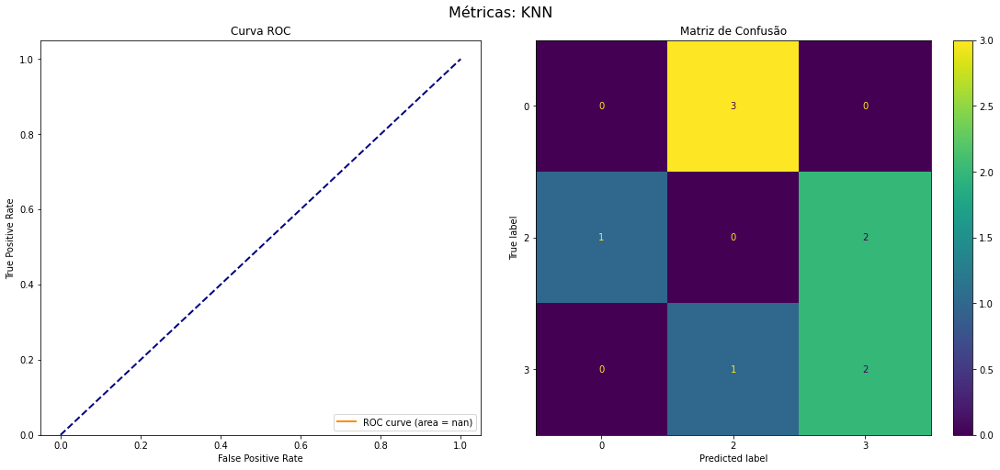

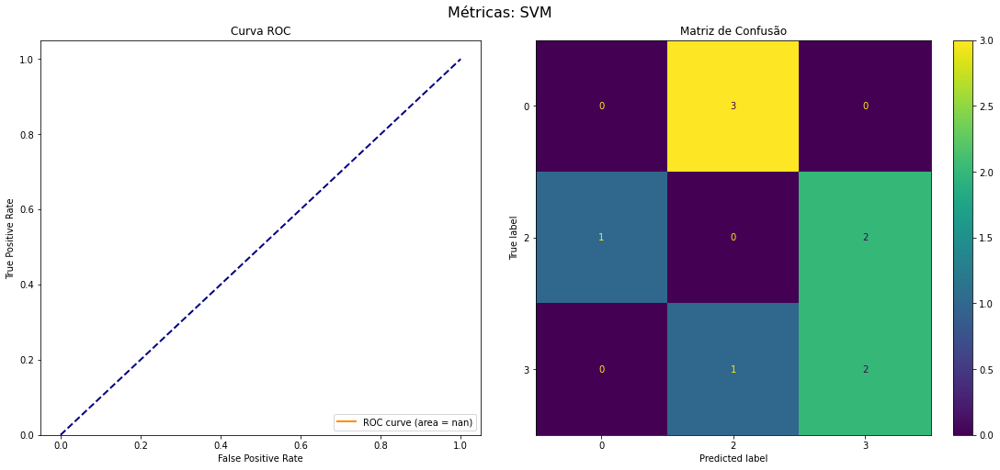

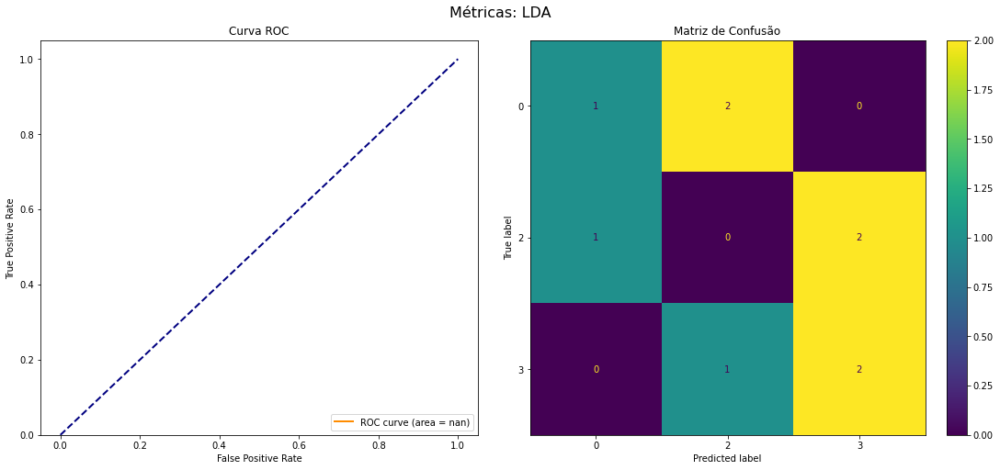

In [22]:
directory = 'C:/Users/Maods/Documents/TCC/data/eeg-motor-movementimagery-dataset/files/'
extension = '**/*.edf'
files = [ file.name for file in Path(directory).glob('**/*') if len(file.name) == 4]
for file in files:
    x_movementimagery, y_movementimagery  = load_eeg_data_edf(directory + file, extension)
    run_pipeline(x_movementimagery, y_movementimagery, fs=160, dataset_name="eeg-mi", subject_id=file, results=models_resut, multiclass=True)

## Results

In [33]:
df_reslts = pd.DataFrame(models_resut)
df_reslts = df_reslts.sort_values(['cross_val_score','F1_score'], ascending=False)
df_reslts.to_csv('ml_models_results.csv', index=False, header=True)

In [54]:
df_reslts[(df_reslts.dataset == 'BCICIV_II') ].head(15)

,model_name,cross_val_score,Accuracy,Precision,Recall,F1_score,auc,kappa,mathew_coef,model_runtime,dataset,subject
410,STD_Scaler => SVM,0.739,0.689655,0.718693,0.689655,0.682132,0.695238,0.385882,0.410513,0:00:00.041579,BCICIV_II,A04T
411,STD_Scaler => LDA,0.643,0.758621,0.795826,0.758621,0.752769,0.764286,0.522353,0.555695,0:00:05.678576,BCICIV_II,A04T
406,=> KNN,0.635,0.586207,0.597353,0.586207,0.580239,0.590476,0.179245,0.186355,0:00:00.048376,BCICIV_II,A04T
408,=> LDA,0.626,0.758621,0.771805,0.758621,0.756890,0.761905,0.520095,0.531457,0:00:05.771551,BCICIV_II,A04T
412,Wavelet => KNN,0.617,0.689655,0.691297,0.689655,0.689655,0.690476,0.380048,0.380952,0:00:00.009226,BCICIV_II,A04T
415,Wavelet => KNN,0.617,0.689655,0.691297,0.689655,0.689655,0.690476,0.380048,0.380952,0:00:00.009226,BCICIV_II,A04T
414,Wavelet => LDA,0.609,0.689655,0.718693,0.689655,0.682132,0.695238,0.385882,0.410513,0:00:00.554126,BCICIV_II,A04T
417,Wavelet => LDA,0.609,0.689655,0.718693,0.689655,0.682132,0.695238,0.385882,0.410513,0:00:00.554126,BCICIV_II,A04T
409,STD_Scaler => KNN,0.591,0.655172,0.691954,0.655172,0.642495,0.661905,0.319249,0.349754,0:00:00.027383,BCICIV_II,A04T
418,bandpass -> PSD => KNN,0.583,0.413793,0.414778,0.413793,0.413793,0.414286,-0.171021,-0.171429,0:00:00.019596,BCICIV_II,A04T


In [55]:
df_reslts[(df_reslts.dataset == 'BCICIV_I')].head(15)

,model_name,cross_val_score,Accuracy,Precision,Recall,F1_score,auc,kappa,mathew_coef,model_runtime,dataset,subject
38,Wavelet -> Time Domain Features => LDA,0.712,0.600,0.601010,0.600,0.598997,0.600,0.20,0.201008,0:00:00.420812,BCICIV_I,BCICIV_calib_ds1a
118,bandpass -> PSD => SVM,0.688,0.725,0.730179,0.725,0.723444,0.725,0.45,0.455150,0:00:00.084853,BCICIV_I,BCICIV_calib_ds1e
37,Wavelet -> Time Domain Features => SVM,0.688,0.675,0.679028,0.675,0.673162,0.675,0.35,0.354005,0:00:00.108586,BCICIV_I,BCICIV_calib_ds1a
160,bandpass -> PSD => SVM,0.681,0.550,0.550505,0.550,0.548872,0.550,0.10,0.100504,0:00:00.097866,BCICIV_I,BCICIV_calib_ds1g
139,bandpass -> PSD => SVM,0.675,0.600,0.601010,0.600,0.598997,0.600,0.20,0.201008,0:00:00.082227,BCICIV_I,BCICIV_calib_ds1f
34,bandpass -> PSD => SVM,0.669,0.525,0.526667,0.525,0.517460,0.525,0.05,0.051640,0:00:00.076665,BCICIV_I,BCICIV_calib_ds1a
41,PSD -> Time Domain Features -> STD_Scaler => LDA,0.631,0.550,0.550000,0.550,0.550000,0.550,0.10,0.100000,0:00:00.428646,BCICIV_I,BCICIV_calib_ds1a
164,Wavelet -> Time Domain Features => LDA,0.631,0.525,0.525575,0.525,0.522313,0.525,0.05,0.050572,0:00:00.449038,BCICIV_I,BCICIV_calib_ds1g
29,Wavelet => LDA,0.625,0.600,0.601010,0.600,0.598997,0.600,0.20,0.201008,0:00:03.197902,BCICIV_I,BCICIV_calib_ds1a
32,Wavelet => LDA,0.625,0.600,0.601010,0.600,0.598997,0.600,0.20,0.201008,0:00:03.197902,BCICIV_I,BCICIV_calib_ds1a


In [51]:
df_reslts[(df_reslts.dataset == 'eeg-mi') ].head(15)

,model_name,cross_val_score,Accuracy,Precision,Recall,F1_score,auc,kappa,mathew_coef,model_runtime,dataset,subject
307,PSD -> Time Domain Features -> STD_Scaler => XGB,0.535,0.472222,0.480159,0.472222,0.464463,0.467078,0.296296,0.302264,0:00:01.159585,eeg-mi,S004
279,PSD -> Time Domain Features -> STD_Scaler => XGB,0.466,0.444444,0.435859,0.444444,0.435819,0.409465,0.259259,0.261147,0:00:01.185600,eeg-mi,S003
303,Wavelet -> Time Domain Features => XGB,0.465,0.444444,0.441919,0.444444,0.437135,0.413580,0.259259,0.261147,0:00:01.142549,eeg-mi,S004
284,STD_Scaler => KNN,0.445,0.305556,0.213095,0.305556,0.233764,0.372428,0.074074,0.081548,0:00:00.043982,eeg-mi,S004
271,bandpass -> PSD => XGB,0.444,0.305556,0.281534,0.305556,0.274176,0.246914,0.074074,0.077939,0:00:03.940854,eeg-mi,S003
249,PSD -> Time Domain Features -> STD_Scaler => SVM,0.437,0.333333,0.356685,0.333333,0.325570,0.230453,0.111111,0.114332,0:00:00.017954,eeg-mi,S002
246,Wavelet -> Time Domain Features => LDA,0.430,0.305556,0.309343,0.305556,0.306536,0.477366,0.074074,0.074304,0:00:00.409045,eeg-mi,S002
304,PSD -> Time Domain Features -> STD_Scaler => KNN,0.424,0.444444,0.468750,0.444444,0.428502,0.471193,0.259259,0.271244,0:00:00.008014,eeg-mi,S004
270,bandpass -> PSD => LDA,0.417,0.222222,0.280420,0.222222,0.217584,0.524691,-0.037037,-0.038447,0:00:05.110682,eeg-mi,S003
240,bandpass -> PSD => KNN,0.410,0.527778,0.497294,0.527778,0.503274,0.308642,0.370370,0.375426,0:00:00.024805,eeg-mi,S002
